# Credit Card Holders Clustering Analysis
This is the final project for the course **BMCS 2114 Machine Learning**. The project is about clustering analysis of credit card holders.

Latest update of this project: **7<sup>th</sup> September 2024**.

The authors are from the Faculty of Computing and Information Technology, Tunku Abdul Rahman University of Management and Technology (TAR UMT), as follows:
1) Yeap Jie Shen 
2) Gan Yee Jing
3) Jerome Subash A/L Joseph

## Acknowledgement
We would like to thank our lecturer and practical tutor Dr Lim Siew Mooi for guiding us throughout the project. We would also like to thank the author of the dataset Arjun Bhasin for providing the dataset for us to work on.

Link to Kaggle dataset: [Credit Card Dataset for Clustering](https://www.kaggle.com/arjunbhasin2013/ccdata)

## Checking Python Environment
The Python environment is checked as follows

In [1]:
import sys
import IPython

# Change path to append here
sys.path.append(r'C:\Users\hp\Downloads\Machine Learning Assignment')

print('Python executable')
print(f'-->{sys.executable}')

print('Python version')
print(f'-->{sys.version}')

print('Kernel')
print(f'-->{IPython.get_ipython().kernel}')

print('Sys paths')
_ = [print(f'{i+1}. {path}') for i, path in enumerate(sys.path)]

Python executable
-->C:\Users\hp\Downloads\Machine Learning Assignment\ml-venv\Scripts\python.exe
Python version
-->3.11.5 | packaged by Anaconda, Inc. | (main, Sep 11 2023, 13:26:23) [MSC v.1916 64 bit (AMD64)]
Kernel
--><ipykernel.ipkernel.IPythonKernel object at 0x000001B1924EC2D0>
Sys paths
1. C:\Users\hp\Downloads\Machine Learning Assignment
2. C:\Users\hp\anaconda3\python311.zip
3. C:\Users\hp\anaconda3\DLLs
4. C:\Users\hp\anaconda3\Lib
5. C:\Users\hp\anaconda3
6. C:\Users\hp\Downloads\Machine Learning Assignment\ml-venv
7. 
8. C:\Users\hp\Downloads\Machine Learning Assignment\ml-venv\Lib\site-packages
9. C:\Users\hp\Downloads\Machine Learning Assignment\ml-venv\Lib\site-packages\win32
10. C:\Users\hp\Downloads\Machine Learning Assignment\ml-venv\Lib\site-packages\win32\lib
11. C:\Users\hp\Downloads\Machine Learning Assignment\ml-venv\Lib\site-packages\Pythonwin
12. C:\Users\hp\Downloads\Machine Learning Assignment


## Installing Required Libraries
Required libraries are listed in <b>requirements.txt</b>, and are installed as follows

In [2]:
%pip install -r requirements.txt

Note: you may need to restart the kernel to use updated packages.


## 1 Data Understanding
Libraries used in this section:
1) **pandas** (For DataFrame manipulation)

In [3]:
# For DataFrame
import pandas as pd

### 1.1 Data Loading

Following shows the raw dataset that is loaded into the notebook


In [4]:
# Reading the raw dataset
df_raw = pd.read_csv(r'./raw_data/Customer Data.csv')

### 1.2 Basic Data Understanding

The dataset summarise the usage behaviour of about 9000 active credit card holders during the last 6 months.

The file is at a customer level with 18 behavioral variables. This dataset is last updated on 2018.

Following are the columns in the dataset:
1. **CUST_ID**: Identification of Credit Card holder (Categorical)
2. **BALANCE**: Balance amount left in their account to make purchases
3. **BALANCE_FREQUENCY**: How frequently the Balance is updated, score between 0 and 1 (1 = frequently updated, 0 = not frequently updated)
4. **PURCHASES**: Amount of purchases made from account
5. **ONEOFF_PURCHASES**: Maximum purchase amount done in one-go
6. **INSTALLMENTS_PURCHASES**: Amount of purchase done in installment
7. **CASH_ADVANCE**: Cash in advance given by the user
8. **PURCHASES_FREQUENCY**: How frequently the Purchases are being made, score between 0 and 1 (1 = frequently purchased, 0 = not frequently purchased)
9. **ONEOFF_PURCHASES_FREQUENCY**: How frequently Purchases are happening in one-go (1 = frequently purchased, 0 = not frequently purchased)
10. **PURCHASES_INSTALLMENTS_FREQUENCY**: How frequently purchases in installments are being done (1 = frequently done, 0 = not frequently done)
11. **CASH_ADVANCE_FREQUENCY**: How frequently the cash in advance being paid
12. **CASH_ADVANCE_TRX**: Number of Transactions made with "Cash in Advance"
13. **PURCHASES_TRX**: Number of purchase transactions made
14. **CREDIT_LIMIT**: Limit of Credit Card for user
15. **PAYMENTS**: Amount of Payment done by user
16. **MINIMUM_PAYMENTS**: Minimum amount of payments made by user
17. **PRC_FULL_PAYMENT**: Percent of full payment paid by user
18. **TENURE**: Tenure of credit card service for user

The dataset contains **8950 rows** and **18 columns**.

In [5]:
# Getting the shape of the dataset
df_raw.shape

(8950, 18)

In [6]:
# Getting the first 5 rows of the dataset
df_raw.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [7]:
# Getting the information of the dataset
df_raw.info(verbose = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

### 1.3 Descriptive Statistics
Following is the basic statistical description of the dataset, which includes:
1) Count
2) Mean
3) Standard Deviation
4) Minimum
5) $25^{th}$ Percentile, $Q_1$
6) Median, $Q_2$
7) $75^{th}$ Percentile, $Q_3$
8) Maximum
9) Skewness
10) Kurtosis

The **large skewness and kurtosis** of almost all columns indicate that the data of these columns **deviates significantly** from a **Gaussian distribution**. This is important to note for further processing and analysis.

In [8]:
# Setting CUST_ID as the index of the DataFrame
df_raw = df_raw.set_index('CUST_ID')

# Describing the dataset, including only numerical columns
df_raw_desc = df_raw.describe(include = ['float64', 'int64']).T

# Including skewness and kurtosis to gain more statistical description of the dataset
# Kurtosis calculated is excess kurtosis, which is the kurtosis minus 3 (Gaussian Distribution has kurtosis of 3)
df_raw_desc['skewness'] = df_raw.skew(axis = 0, skipna = True, numeric_only = True)
df_raw_desc['kurtosis'] = df_raw.kurtosis(axis = 0, skipna = True, numeric_only = True)

df_raw_desc.T

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000
skewness,2.393386,-2.023266,8.144269,10.045083,7.299120,5.166609,0.060164,1.535613,0.509201,1.828686,5.721298,4.630655,1.522464,5.907620,13.622797,1.942820,-2.943017
kurtosis,7.674751,3.092370,111.388771,164.187572,96.575178,52.899434,-1.638631,1.161846,-1.398632,3.334734,61.646862,34.793100,2.836656,54.770736,283.989986,2.432395,7.694823


## 2 Data Preprocessing

Libraries used in this section:
1) **pandas** (For DataFrame manipulation)
2) **scikit-learn** imputers (SimpleImputer, KNNImputer, IterativeImputer)

The following data preprocessing techniques are performed on the dataset, as follows:
1. Detecting & Handling **Missing Values**
2. Detecting & Handling **Outliers**
3. Detecting & Handling **Contaminated Data**
4. Detecting & Handling **Inconsistent Data** (Skipped, no text data in this dataset)
5. Detecting & Handling **Invalid Data**
6. Detecting & Handling **Duplicated Data**
7. Detecting & Handling **Data Type Issues**
8. Detecting & Handling **Structural Issues**

In [9]:
# For DataFrame
import pandas as pd

# For Imputers
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer, KNNImputer, IterativeImputer

## 2.1 Detecting & Handling Missing Values
From the understanding obtained about the dataset, only **NULL** are treated as **missing values**, whereas **zeroes** are **not treated as missing values**.

### 2.1.1 Detecting Missing Values
The missing values are detected as follows

In [10]:
# Getting number of missing values in each column
series_isnull_sum = df_raw.isnull().sum(axis = 0)

# Getting the summary of missing values in the dataset
df_missing_summary = pd.concat([series_isnull_sum.sort_values(ascending = False), round(series_isnull_sum / len(df_raw) * 100, 2).sort_values(ascending = False)], axis = 1, keys = ['Missing Values', 'Percentage Missing Values (%)'])

df_missing_summary

,Missing Values,Percentage Missing Values (%)
MINIMUM_PAYMENTS,313,3.50
CREDIT_LIMIT,1,0.01
BALANCE,0,0.00
BALANCE_FREQUENCY,0,0.00
PURCHASES,0,0.00
CASH_ADVANCE,0,0.00
PURCHASES_FREQUENCY,0,0.00
ONEOFF_PURCHASES,0,0.00
INSTALLMENTS_PURCHASES,0,0.00
PURCHASES_INSTALLMENTS_FREQUENCY,0,0.00


### 2.1.2 Handling Missing Values
It is observed that only **MINIMUM_PAYMENTS** and **CREDIT_LIMIT** have missing values.

Hence, the following approaches are employed to handle the missing values:
1) Imputing **MINIMUM_PAYMENTS** with **PAYMENTS**, **CREDIT_LIMIT** with **median**
2) **MINIMUM_PAYMENTS** imputed with **KNNImputer**, and **CREDIT_LIMIT** imputed with **median**

#### Imputing 'MINIMUM_PAYMENTS' with 'PAYMENTS', 'CREDIT_LIMIT' with median
The missing values in **MINIMUM_PAYMENTS** are imputed with the corresponding **PAYMENTS** made by the cardholder, whereas the missing values in **CREDIT_LIMIT** are imputed with the median of **CREDIT_LIMIT**.

**(Considered)**

**Note:**

This method is viable, as the possible minimum payment made is at most the total payment made by the cardholder.

In [11]:
# Creating a deep copy of the raw dataset
df_imputed_payments = df_raw.copy(deep = True)

# Imputing with the aforementioned method and storing in new columns
df_imputed_payments['MINIMUM_PAYMENTS'] = df_imputed_payments['MINIMUM_PAYMENTS'].fillna(df_imputed_payments['PAYMENTS'])
df_imputed_payments['CREDIT_LIMIT'] = df_imputed_payments['CREDIT_LIMIT'].fillna(df_imputed_payments['CREDIT_LIMIT'].median())

# Saving to csv for future use
df_imputed_payments.to_csv(r'./preprocessed_data/imputed_payments_imputed_median.csv')

df_imputed_payments

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
CUST_ID,,,,,,,,,,,,,,,,,
C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,0.000000,0.000000,12
C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,275.861322,0.000000,6
C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6


#### Imputing 'MINIMUM_PAYMENTS', 'CREDIT_LIMIT' with Mean
The missing values in **MINIMUM_PAYMENTS** and **CREDIT_LIMIT** are imputed with the mean of the respective columns.

**(Not Considered)**

**Note:**

This is not practical for **MINIMUM_PAYMENTS** since some cardholders have made no payments at all, which their minimum payment should not exceed the total payment made as mentioned above.

In [12]:
# Instantiating a simple imputer with mean strategy
imputer_mean = SimpleImputer(strategy = 'mean')

# Creating a deep copy of the raw dataset
df_imputed_mean = df_raw.copy(deep = True)

# Imputing with the aforementioned method and storing in new columns
df_imputed_mean = pd.DataFrame(imputer_mean.fit_transform(df_imputed_mean), columns = df_imputed_mean.columns, index = df_imputed_mean.index)

# Saving to csv for future use
df_imputed_mean.to_csv(r'./preprocessed_data/imputed_mean_all.csv')

df_imputed_mean

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
CUST_ID,,,,,,,,,,,,,,,,,
C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0.0,2.0,1000.0,201.802084,139.509787,0.000000,12.0
C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4.0,0.0,7000.0,4103.032597,1072.340217,0.222222,12.0
C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0.0,12.0,7500.0,622.066742,627.284787,0.000000,12.0
C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1.0,1.0,7500.0,0.000000,864.206542,0.000000,12.0
C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0.0,1.0,1200.0,678.334763,244.791237,0.000000,12.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0.0,6.0,1000.0,325.594462,48.886365,0.500000,6.0
C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0.0,6.0,1000.0,275.861322,864.206542,0.000000,6.0
C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0.0,5.0,1000.0,81.270775,82.418369,0.250000,6.0


#### Imputing with Median
The missing values in **MINIMUM_PAYMENTS** and **CREDIT_LIMIT** are imputed with the median of the respective columns.

**(Not Considered)**

**Note:**

This is not practical for **MINIMUM_PAYMENTS** as well, same reason as imputing with mean.

In [13]:
# Instantiating a simple imputer with median strategy
imputer_median = SimpleImputer(strategy = 'median')

# Creating a deep copy of the raw dataset
df_imputed_median = df_raw.copy(deep = True)

# Imputing with the aforementioned method and storing in new columns
df_imputed_median = pd.DataFrame(imputer_median.fit_transform(df_imputed_median), columns = df_imputed_median.columns, index = df_imputed_median.index)

# Saving to csv for future use
df_imputed_median.to_csv(r'./preprocessed_data/imputed_median.csv')

df_imputed_median

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
CUST_ID,,,,,,,,,,,,,,,,,
C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0.0,2.0,1000.0,201.802084,139.509787,0.000000,12.0
C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4.0,0.0,7000.0,4103.032597,1072.340217,0.222222,12.0
C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0.0,12.0,7500.0,622.066742,627.284787,0.000000,12.0
C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1.0,1.0,7500.0,0.000000,312.343947,0.000000,12.0
C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0.0,1.0,1200.0,678.334763,244.791237,0.000000,12.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0.0,6.0,1000.0,325.594462,48.886365,0.500000,6.0
C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0.0,6.0,1000.0,275.861322,312.343947,0.000000,6.0
C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0.0,5.0,1000.0,81.270775,82.418369,0.250000,6.0


#### Imputing with Zero
The missing values in **MINIMUM_PAYMENTS** and **CREDIT_LIMIT** are imputed with zero.

**(Not Considered)**

**Note:**

This is not practical for **MINIMUM_PAYMENTS** as well, since some cardholders have already made payments, hence the minimum payment should not be zero

In [14]:
# Creating a deep copy of the raw dataset
df_imputed_zero= df_raw.copy(deep = True)

# Imputing with the aforementioned method and storing in new columns
df_imputed_zero = df_imputed_zero.fillna(0)

# Saving to csv for future use
df_imputed_zero.to_csv(r'./preprocessed_data/imputed_zero.csv')

df_imputed_zero

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
CUST_ID,,,,,,,,,,,,,,,,,
C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,0.000000,0.000000,12
C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,0.000000,0.000000,6
C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6


#### Imputing with Forward Fill Method
The missing values in **MINIMUM_PAYMENTS** and **CREDIT_LIMIT** are imputed with the last known value.

**(Not Considered)**

**Note:**

This is not practical at all, no correlation between the rows, this is **not a time series** dataset

In [15]:
# Creating a deep copy of the raw dataset
df_imputed_ffill = df_raw.copy(deep = True)

# Imputing with the aforementioned method and storing in new columns
df_imputed_ffill = df_imputed_ffill.ffill()

# Saving to csv for future use
df_imputed_ffill.to_csv(r'./preprocessed_data/imputed_ffill.csv')

df_imputed_ffill

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
CUST_ID,,,,,,,,,,,,,,,,,
C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,627.284787,0.000000,12
C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,48.886365,0.000000,6
C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6


#### Imputing with Backward Fill Method
The missing values in **MINIMUM_PAYMENTS** and **CREDIT_LIMIT** are imputed with the next known value.

**(Not Considered)**

**Note:**

This is not practical as well, same reason as imputing with forward fill method.

In [16]:
# Creating a deep copy of the raw dataset
df_imputed_bfill = df_raw.copy(deep = True)

# Imputing with the aforementioned method and storing in new columns
df_imputed_bfill = df_imputed_bfill.bfill()

# Saving to csv for future use
df_imputed_bfill.to_csv(r'./preprocessed_data/imputed_bfill.csv')

df_imputed_bfill

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
CUST_ID,,,,,,,,,,,,,,,,,
C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,244.791237,0.000000,12
C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,82.418369,0.000000,6
C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6


#### Imputing with K-Nearest Neighbors Imputer
The missing values in **MINIMUM_PAYMENTS** and **CREDIT_LIMIT** are imputed by finding the K-nearest neighbors of each sample, then averaging the neighbors' values.

In scikit-learn's implementation, this method by default considers the **5-nearest neighbors** and uses **Euclidean distance** as the distance metric.

The following uses **3-nearest neighbors**.

**(Considered)**

**Note:**

This is good only for fitting into simple models, SimpleImputer would be considerably better for complex models.

**References:**
1) [Sklearn's KnnImputer](https://scikit-learn.org/stable/modules/generated/sklearn.impute.KNNImputer.html)
2) [Prediction Performance of Various Imputing Strategies](https://scikit-learn.org/stable/modules/generated/sklearn.impute.SimpleImputer.html#sklearn.impute.SimpleImputer)

In [17]:
# Instantiating a KNN imputer with 3 neighbors
imputer_knn = KNNImputer(n_neighbors = 3)

# Creating a deep copy of the raw dataset
df_imputed_knn = df_raw.copy(deep = True)

# Imputing with the aforementioned method and storing in new columns
df_imputed_knn = pd.DataFrame(imputer_knn.fit_transform(df_imputed_knn), columns = df_imputed_knn.columns, index = df_imputed_knn.index)

# Saving to csv for future use
df_imputed_knn.to_csv(r'./preprocessed_data/imputed_knn_n3.csv')

df_imputed_knn

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
CUST_ID,,,,,,,,,,,,,,,,,
C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0.0,2.0,1000.0,201.802084,139.509787,0.000000,12.0
C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4.0,0.0,7000.0,4103.032597,1072.340217,0.222222,12.0
C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0.0,12.0,7500.0,622.066742,627.284787,0.000000,12.0
C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1.0,1.0,7500.0,0.000000,448.208854,0.000000,12.0
C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0.0,1.0,1200.0,678.334763,244.791237,0.000000,12.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0.0,6.0,1000.0,325.594462,48.886365,0.500000,6.0
C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0.0,6.0,1000.0,275.861322,174.958656,0.000000,6.0
C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0.0,5.0,1000.0,81.270775,82.418369,0.250000,6.0


#### Imputing with Iterative Imputer
The missing values in **MINIMUM_PAYMENTS** and **CREDIT_LIMIT** are imputed by modeling each feature with missing values as a function of other features, then estimating the missing values, in a round-robin fashion.

In scikit-learn's implementation, this method by default uses **BayesianRidge** as the estimator.

**(Considered)**

**Note:**

This is good only for fitting into simple models, SimpleImputer would be considerably better for complex models. It is using BayesianRidge as the estimator by default

**References:**
1. [Sklearn's IterativeImputer](https://scikit-learn.org/stable/modules/generated/sklearn.impute.IterativeImputer.html) 
2. [Prediction Performance of Various Imputing Strategies](https://scikit-learn.org/stable/modules/generated/sklearn.impute.SimpleImputer.html#sklearn.impute.SimpleImputer)

In [18]:
# Instantiating an Iterative Imputer with the default BayesianRidge estimator 
imputer_iterative = IterativeImputer()

# Creating a deep copy of the raw dataset
df_imputed_iter = df_raw.copy(deep = True)

# Imputing with the aforementioned method and storing in new columns
df_imputed_iter = pd.DataFrame(imputer_iterative.fit_transform(df_imputed_iter), columns = df_imputed_iter.columns, index = df_imputed_iter.index)

# Saving to csv for future use
df_imputed_iter.to_csv(r'./preprocessed_data/imputed_iterative.csv')

df_imputed_iter

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
CUST_ID,,,,,,,,,,,,,,,,,
C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0.0,2.0,1000.0,201.802084,139.509787,0.000000,12.0
C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4.0,0.0,7000.0,4103.032597,1072.340217,0.222222,12.0
C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0.0,12.0,7500.0,622.066742,627.284787,0.000000,12.0
C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1.0,1.0,7500.0,0.000000,431.220627,0.000000,12.0
C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0.0,1.0,1200.0,678.334763,244.791237,0.000000,12.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0.0,6.0,1000.0,325.594462,48.886365,0.500000,6.0
C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0.0,6.0,1000.0,275.861322,346.308629,0.000000,6.0
C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0.0,5.0,1000.0,81.270775,82.418369,0.250000,6.0


**Conclusion**: 

There is no straight forward way to determine the best imputation method. A good way to measure the quality of imputations is to look at how a machine learning model performs against each imputation. We will try out different imputation methods and see how they perform in the model later.

However, in our context, the first method (imputing minimum payments with payments) and iterative imputer might not be suitable for dataset with fewer rows and more columns like this dataset.

Therefore, **KNN Imputer** is **chosen** as the most reasonable and best imputation value would be the value obtained from its nearby neighbours. 

**Reference**:

1. [Evaluation of different imputation techniques](https://campus.datacamp.com/courses/dealing-with-missing-data-in-python/advanced-imputation-techniques?ex=8#:~:text=Evaluation%20techniques,-00%3A00%20%2D%2000&text=A%20good%20way%20to%20measure,imputations%20we%20had%20done%20earlier)

## 2.2 Detecting & Handling Outliers
The outliers in the dataset are detected using techniques as follows:
1) **Interquartile Range (IQR)**
2) **z-Score**

Both **IQR** and **z-Score** methods are used to detect outliers in the dataset, but **IQR** is more suitable as the data are skewed, not near-Gaussian, as indicated by its skewness and excess kurtosis

### 2.2.1 Detecting Outliers
Functions for both **IQR** and **z-Score** method are defined as follows to improve code readability.

In [19]:
# Defining function for computing outliers using IQR method
def outliers_iqr(column):
    # Getting first and third quartile of the column
    q1 = column.quantile(0.25)
    q3 = column.quantile(0.75)

    # Computing the IQR, lower and upper fences
    iqr = q3 - q1
    lower_fence = q1 - 1.5 * iqr
    upper_fence = q3 + 1.5 * iqr

    # Getting the outliers
    outliers = column[(column < lower_fence) | (column > upper_fence)]

    # Returning the number of outliers, lower fence, upper fence, and percentage of outliers
    return len(outliers), lower_fence, upper_fence, round(len(outliers) / len(column) * 100, 2)

# Defining function for computing outliers using z-Score method
def outliers_zscore(column):
    # Computing the mean and standard deviation of the column
    mean = column.mean()
    std = column.std()

    # Computing the z-scores of each row
    z_scores = (column - mean) / std

    # Computing the lower and upper fences
    lower_fence = mean - 3 * std
    upper_fence = mean + 3 * std

    # Getting the outliers
    outliers = column[abs(z_scores) > 3]

    # Returning the number of outliers, lower fence, upper fence, and percentage of outliers
    return len(outliers), lower_fence, upper_fence, round(len(outliers) / len(column) * 100, 2)

#### IQR Method
This method requires the first quartile, $Q_1$ and third quartile $Q_3$ of the dataset to be computed, which in turn is used to calculate the interquartile range, $Q_3 - Q_1$, and in turn used to derive the upper and lower fences.

Data points falling out of these fences are considered outliers. The equations are as follows:

\begin{align*}
Q1 &= \text{First Quartile (25th percentile)} \\
Q3 &= \text{Third Quartile (75th percentile)} \\
IQR &= Q3 - Q1 \\
\text{Lower Fence} &= Q1 - 1.5 \times IQR \\
\text{Upper Fence} &= Q3 + 1.5 \times IQR \\
\text{Outliers} &= \{ x \mid x < \text{Lower Fence} \text{ or } x > \text{Upper Fence} \}
\end{align*}

In [20]:
# Choosing the KNN imputed dataset for further process and analysis
df_imputed = pd.read_csv(r'./preprocessed_data/imputed_knn_n3.csv', index_col = 'CUST_ID')

# Getting outliers information using IQR method
df_outliers_iqr = df_imputed.apply(outliers_iqr).T.rename({0: 'Outliers Count', 1: 'Lower Fence', 2: 'Upper Fence', 3: 'Percentage Outliers (%)'}, axis = 1)

df_outliers_iqr

,Outliers Count,Lower Fence,Upper Fence,Percentage Outliers (%)
BALANCE,695.0,-2760.505265,4942.927215,7.77
BALANCE_FREQUENCY,1493.0,0.722223,1.166666,16.68
PURCHASES,808.0,-1566.107500,2715.872500,9.03
ONEOFF_PURCHASES,1013.0,-866.107500,1443.512500,11.32
INSTALLMENTS_PURCHASES,867.0,-702.956250,1171.593750,9.69
CASH_ADVANCE,1030.0,-1670.731709,2784.552848,11.51
PURCHASES_FREQUENCY,0.0,-1.166668,2.166668,0.00
ONEOFF_PURCHASES_FREQUENCY,782.0,-0.450000,0.750000,8.74
PURCHASES_INSTALLMENTS_FREQUENCY,0.0,-1.125000,1.875000,0.00
CASH_ADVANCE_FREQUENCY,525.0,-0.333333,0.555555,5.87


#### z-Score Method
This method assumes an approximate symmetrical distribution of the data, which is not the case for this dataset.

Hence, it is **not practical** for outliers detection in this dataset.

The z-Score is calculated as follows:
\begin{align*}
z &= \frac{x - \mu}{\sigma} \\
\text{Lower Fence} &= \mu - 3 \times \sigma \\
\text{Upper Fence} &= \mu + 3 \times \sigma \\
\text{Outliers} &= \{ x \mid z < -3 \text{ or } z > 3 \}
\end{align*}

In [21]:
# Getting outliers information using z-Score method
df_outliers_zscore = df_imputed.apply(outliers_zscore).T.rename({0: 'Outliers Count', 1: 'Lower Fence', 2: 'Upper Fence', 3: 'Percentage Outliers (%)'}, axis = 1)

df_outliers_zscore

,Outliers Count,Lower Fence,Upper Fence,Percentage Outliers (%)
BALANCE,196.0,-4680.120811,7809.070466,2.19
BALANCE_FREQUENCY,176.0,0.166559,1.587983,1.97
PURCHASES,135.0,-5406.699512,7413.109179,1.51
ONEOFF_PURCHASES,122.0,-4387.226381,5572.101123,1.36
INSTALLMENTS_PURCHASES,137.0,-2301.946701,3124.081990,1.53
CASH_ADVANCE,182.0,-5312.620517,7270.362742,2.03
PURCHASES_FREQUENCY,0.0,-0.713762,1.694463,0.00
ONEOFF_PURCHASES_FREQUENCY,0.0,-0.692551,1.097466,0.00
PURCHASES_INSTALLMENTS_FREQUENCY,0.0,-0.827906,1.556781,0.00
CASH_ADVANCE_FREQUENCY,199.0,-0.465220,0.735508,2.22


### 2.2.2 Handling Outliers
It is observed that the dataset has a great portion of outliers.

However, instead of imputing or removing, the outliers are retained, as they might represent customers departing from different segments.

## 2.3 Detecting & Handling Contaminated Data
This dataset has **no identified contamination**, as rows are rather independent of each other, having no correlation between them.

Since there is no contaminated data, **no action** is performed.

## 2.4 Detecting & Handling Inconsistent Data
This dataset has **no identified inconsistencies**, as the data is numerical and there is no text data in this dataset.

Since there is no inconsistent data, **no action** is performed.

## 2.5 Detecting & Handling Invalid Data
Possible source of invalid data in this dataset is the occurence of negative values in any of the columns in the dataset.

### 2.5.1 Detecting Invalid Data
The following steps are taken to detect invalid data.

In [22]:
# Getting number of negative values in each column
series_negative_values = (df_imputed < 0).sum(axis = 0)

# Getting the summary of negative values in the dataset
df_negative_summary = pd.concat([series_negative_values.sort_values(ascending = False), round(series_negative_values / len(df_imputed) * 100, 2).sort_values(ascending = False)], axis = 1, keys = ['Negative Values', 'Percentage Negative Values (%)'])

df_negative_summary

,Negative Values,Percentage Negative Values (%)
BALANCE,0,0.0
BALANCE_FREQUENCY,0,0.0
PURCHASES,0,0.0
ONEOFF_PURCHASES,0,0.0
INSTALLMENTS_PURCHASES,0,0.0
CASH_ADVANCE,0,0.0
PURCHASES_FREQUENCY,0,0.0
ONEOFF_PURCHASES_FREQUENCY,0,0.0
PURCHASES_INSTALLMENTS_FREQUENCY,0,0.0
CASH_ADVANCE_FREQUENCY,0,0.0


### 2.5.2 Handling Invalid Data
Since **no negative values** is observed, hence **no action** is performed

## 2.6 Detecting & Handling Duplicated Data
Duplicated data in the context of this dataset is defined as rows with the same index, or rows with the same values in all columns. 

### 2.6.1 Detecting Duplicated Data
This following steps are taken to detect duplicated data.

In [23]:
# Getting duplicated indices
duplicated_indices = df_imputed.index.duplicated()

# Getting the number of duplicated indices
duplicated_indices_count = duplicated_indices.sum()

# Printing the number of duplicated indices found
print(f'Number of duplicated indices found: {duplicated_indices_count}')

# Getting duplicated rows with same values in all columns
duplicated_rows = df_imputed.duplicated(keep = 'first')

# Printing the number of duplicated rows found
print(f'Number of duplicated rows found: {duplicated_rows.sum()}')

Number of duplicated indices found: 0
Number of duplicated rows found: 0


### 2.6.1 Handling Duplicated Data
Since **no duplicated data** is observed, hence **no action** is performed

## 2.7 Detecting & Handling Data Type Issues
Columns **CASH_ADVANCE_TRX**, **PURCHASES_TRX**, and **TENURE** should be of **int64** data type, as they represent the number of transactions and tenure in months respectively, whereas the others should be of **float64** data type.
 
### 2.7.1 Detecting Data Type Issues
This following steps are taken to detect data type issues.

In [24]:
# Getting the data types of the dataset
df_imputed.dtypes

BALANCE                             float64
BALANCE_FREQUENCY                   float64
PURCHASES                           float64
ONEOFF_PURCHASES                    float64
INSTALLMENTS_PURCHASES              float64
CASH_ADVANCE                        float64
PURCHASES_FREQUENCY                 float64
ONEOFF_PURCHASES_FREQUENCY          float64
PURCHASES_INSTALLMENTS_FREQUENCY    float64
CASH_ADVANCE_FREQUENCY              float64
CASH_ADVANCE_TRX                    float64
PURCHASES_TRX                       float64
CREDIT_LIMIT                        float64
PAYMENTS                            float64
MINIMUM_PAYMENTS                    float64
PRC_FULL_PAYMENT                    float64
TENURE                              float64
dtype: object

### 2.7.1 Handling Data Type Issues
It is observed that **CASH_ADVANCE_TRX**, **PURCHASES_TRX**, and **TENURE** are in **float64** data type, but they should be in **int64** data type.

Hence, they are converted to **int64** data type.

In [25]:
# Defining the columns to be converted to int64 data type
columns_int64 = ['CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'TENURE']

# Converting the columns to int64 data type
df_imputed[columns_int64] = df_imputed[columns_int64].astype('int64')

# Getting the data types of the dataset again
df_imputed.dtypes

BALANCE                             float64
BALANCE_FREQUENCY                   float64
PURCHASES                           float64
ONEOFF_PURCHASES                    float64
INSTALLMENTS_PURCHASES              float64
CASH_ADVANCE                        float64
PURCHASES_FREQUENCY                 float64
ONEOFF_PURCHASES_FREQUENCY          float64
PURCHASES_INSTALLMENTS_FREQUENCY    float64
CASH_ADVANCE_FREQUENCY              float64
CASH_ADVANCE_TRX                      int64
PURCHASES_TRX                         int64
CREDIT_LIMIT                        float64
PAYMENTS                            float64
MINIMUM_PAYMENTS                    float64
PRC_FULL_PAYMENT                    float64
TENURE                                int64
dtype: object

## 2.8 Detecting & Handling Structural Issues
The dataset is already in a **good structure**, with the index set to **CUST_ID**, which is the unique identifier for each customer.

Hence, **no action** is required

In [26]:
# Saving preprocessed dataset to a new csv file
df_imputed.to_csv(r'./preprocessed_data/preprocessed_imputed_knn_n3_outlier_retained.csv')

# 3 Exploratory Data Analysis (EDA)
Libraries used in this section:
1) **pandas** (For DataFrame manipulation)
2) **numpy** (For numerical operations)
3) **seaborn** (For visualisation)
4) **matplotlib.pyplot** (For visualisation)
5) **scipy.stats** (For statistical operations)

The following exploratory data analysis is performed on the dataset:
1) **Correlation Analysis**
2) **Univariate Analysis**
2) **Bivariate Analysis**
3) **Multivariate Analysis**
5) **Others**

In [27]:
# For DataFrame
import pandas as pd
import numpy as np

# For visualisation
import seaborn as sns
import matplotlib.pyplot as plt

# For t-SNE
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

## 3.1 Correlation Analysis
Heatmap is plotted to visualise the correlation between the features in the dataset.

Some columns with exceptionally high correlation observed are:
1) **PURCHASES** and **ONEOFF_PURCHASES** (<i>0.92</i>)
2) **PURCHASES** and **INSTALLMENTS_PURCHASES** (<i>0.68</i>)
3) **PURCHASES_FREQUENCY** and **PURCHASES_INSTALLMENTS_FREQUENCY** (<i>0.86</i>)

These columns are further analysed in the bivariate analysis.

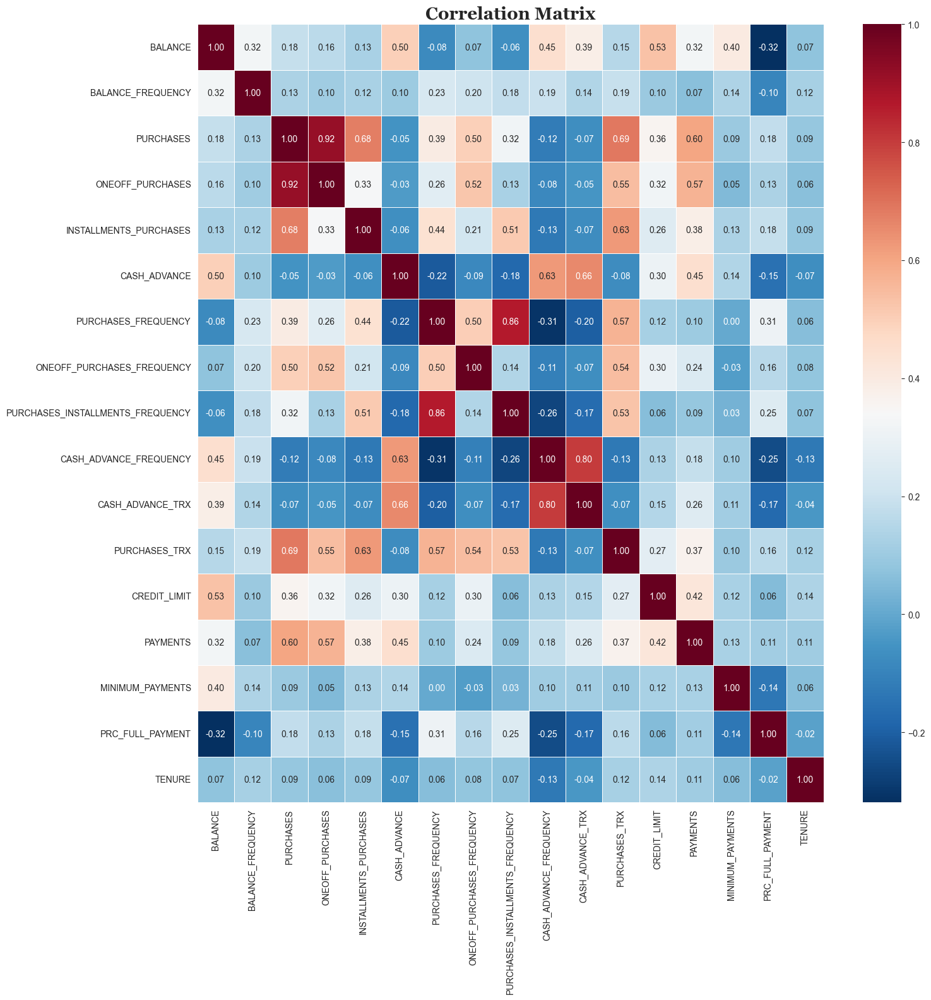

In [28]:
# Loading preprocessed dataset
df_eda = pd.read_csv(r'./preprocessed_data/preprocessed_imputed_knn_n3_outlier_retained.csv')

# Defining categorical and numerical columns
categorical_cols = ['TENURE']
numerical_cols = ['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES',
                  'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY',
                  'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY',
                  'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX',
                  'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS',
                  'PRC_FULL_PAYMENT', 'TENURE']

# Setting layout of the plot
plt.figure(figsize = (16, 16))
plt.title('Correlation Matrix', fontdict = {'family' : 'georgia', 'weight' : 'bold', 'size' : 20})

# Plotting the heatmap
sns.heatmap(df_eda[numerical_cols].corr(), annot = True, cmap = sns.color_palette('RdBu_r', as_cmap = True), fmt = '.2f', linewidth = .7)

# Showing the plot
plt.show()

## 3.2 Univariate Analysis
The distribution plots is plotted for each numerical feature in the dataset, whereas the count plots will be plotted for each categorical feature in the dataset.

All features in the dataset are numerical except for **TENURE**, which is a categorical feature.

### 3.2.1 BALANCE
The summary of the distribution plot for **BALANCE** is as follows:
- **Mean**: 1564.47
- **Median**: 873.39
- **Mode**: 0.00

Hence, this plot shows a **right-skewed** distribution.

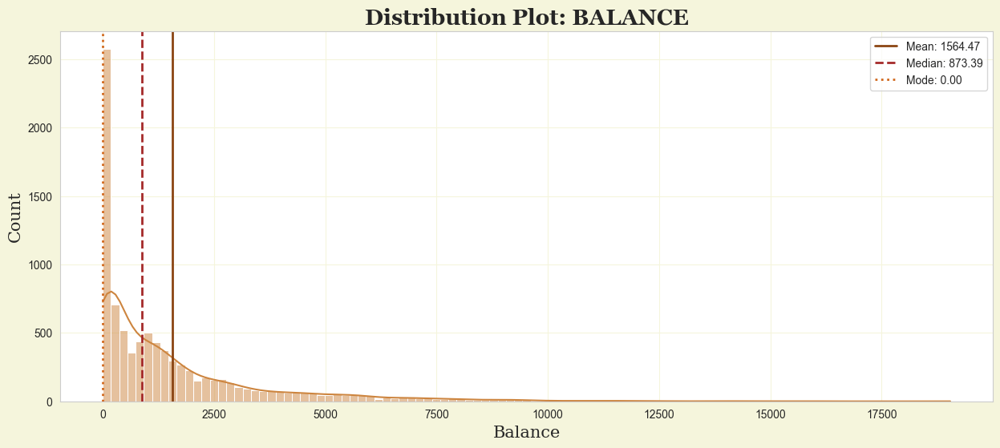

In [29]:
# Getting BALANCE data and its mean, median and mode
balance = df_eda['BALANCE']
eda_balance = {
    'mean': balance.mean(),
    'median': balance.median(),
    'mode': balance.mode()[0]

}

# Setting layout of the plot
plt.figure(figsize = (15, 6), facecolor = 'beige')
plt.grid(visible = True, color = 'beige')
plt.title('Distribution Plot: BALANCE', fontdict = {'family' : 'georgia', 'weight' : 'bold', 'size' : 20})
plt.xlabel('Balance', fontdict = {'family' : 'serif', 'size' : 15})
plt.ylabel('Count', fontdict = {'family' : 'serif', 'size' : 15})

# Plotting the histogram, with KDE and mean, mode, median lines
sns.histplot(balance, kde = True, stat = 'count', color = 'peru')
plt.axvline(eda_balance['mean'], color = 'saddlebrown', linestyle = '-', linewidth = 2, label = f'Mean: {eda_balance["mean"]:.2f}')
plt.axvline(eda_balance['median'], color = 'brown', linestyle = '--', linewidth = 2, label = f'Median: {eda_balance["median"]:.2f}')
plt.axvline(eda_balance['mode'], color = 'chocolate', linestyle = ':', linewidth = 2, label = f'Mode: {eda_balance["mode"]:.2f}')

# Showing the plot
plt.legend()
plt.show()

### 3.2.2 BALANCE_FREQUENCY
The summary of the distribution plot for **BALANCE_FREQUENCY** is as follows:
- **Mean**: 0.88
- **Median**: 1.00
- **Mode**: 1.00

Hence, this plot shows a **left-skewed** distribution.

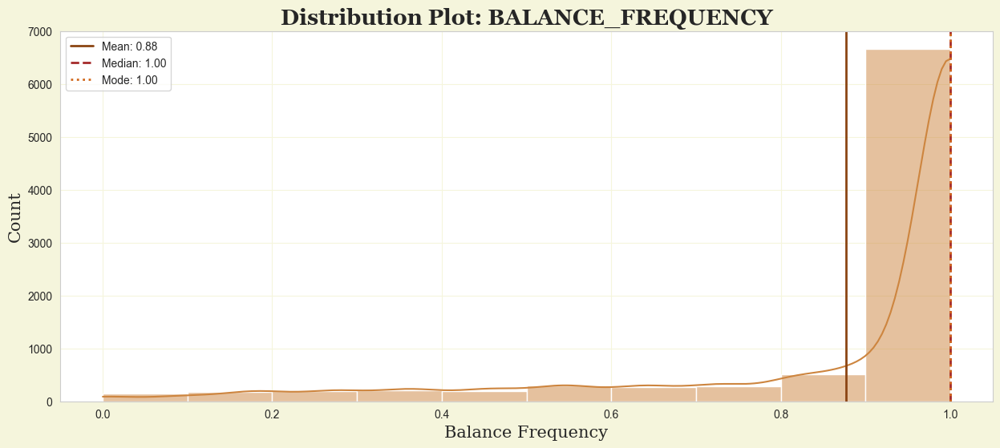

In [30]:
# Getting BALANCE_FREQUENCY data with its mean, median, mode
balance_freq = df_eda['BALANCE_FREQUENCY']
eda_balance_freq = {
    'mean': balance_freq.mean(),
    'median': balance_freq.median(),
    'mode': balance_freq.mode()[0]
}

# Setting layout of the plot
plt.figure(figsize = (15, 6), facecolor = 'beige')
plt.grid(visible = True, color ='beige')
plt.title('Distribution Plot: BALANCE_FREQUENCY', fontdict = {'family' : 'georgia', 'weight' : 'bold', 'size' : 20})
plt.xlabel('Balance Frequency', fontdict = {'family' : 'serif', 'size' : 15})
plt.ylabel('Count', fontdict = {'family' : 'serif', 'size' : 15})

# Plotting the histogram, with KDE and mean, mode, median lines
sns.histplot(balance_freq, kde = True, stat = 'count', color = 'peru', binwidth = 0.1) # Setting binwidth for better visualisation
plt.axvline(eda_balance_freq['mean'], color = 'saddlebrown', linestyle='-', linewidth = 2, label = f'Mean: {eda_balance_freq["mean"]:.2f}')
plt.axvline(eda_balance_freq['median'], color = 'brown', linestyle = '--', linewidth = 2, label = f'Median: {eda_balance_freq["median"]:.2f}')
plt.axvline(eda_balance_freq['mode'], color = 'chocolate', linestyle=':', linewidth = 2, label = f'Mode: {eda_balance_freq["mode"]:.2f}')

# Showing the plot
plt.legend()
plt.show()

### 3.2.3 PURCHASES
The summary of the distribution plot for **PURCHASES** is as follows:
- **Mean**: 1003.20
- **Median**: 361.28
- **Mode**: 0.00.

Hence, this plot shows a **right-skewed** distribution.

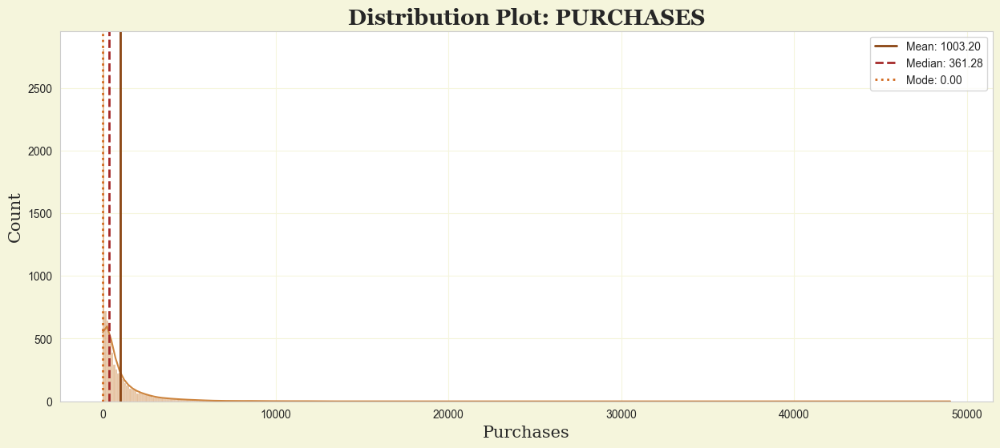

In [31]:
# Getting BALANCE_FREQUENCY data with its mean, median, mode
purchases = df_eda['PURCHASES']
eda_purchases = {
    'mean': purchases.mean(),
    'median': purchases.median(),
    'mode': purchases.mode()[0]
}

# Setting layout of the plot
plt.figure(figsize=(15, 6), facecolor='beige')
plt.grid(visible = True, color = 'beige')
plt.title('Distribution Plot: PURCHASES', fontdict = {'family' : 'georgia', 'weight' : 'bold', 'size' : 20})
plt.xlabel('Purchases', fontdict = {'family' : 'serif', 'size' : 15})
plt.ylabel('Count', fontdict = {'family' : 'serif', 'size' : 15})

# Plotting the histogram, with KDE and mean, mode, median lines
sns.histplot(purchases, kde = True, stat = 'count', color = 'peru')
plt.axvline(eda_purchases['mean'], color = 'saddlebrown', linestyle = '-', linewidth = 2, label = f'Mean: {eda_purchases["mean"]:.2f}')
plt.axvline(eda_purchases['median'], color = 'brown', linestyle = '--', linewidth = 2, label = f'Median: {eda_purchases["median"]:.2f}')
plt.axvline(eda_purchases['mode'], color = 'chocolate', linestyle = ':', linewidth = 2, label = f'Mode: {eda_purchases["mode"]:.2f}')

# Showing the plot
plt.legend()
plt.show()

### 3.2.4 ONEOFF_PURCHASES
The summary of the distribution plot for **ONEOFF_PURCHASES** is as follows:
- **Mean**: 592.44
- **Median**: 38.00
- **Mode**: 0.00

Hence, this plot shows a **right-skewed** distribution.

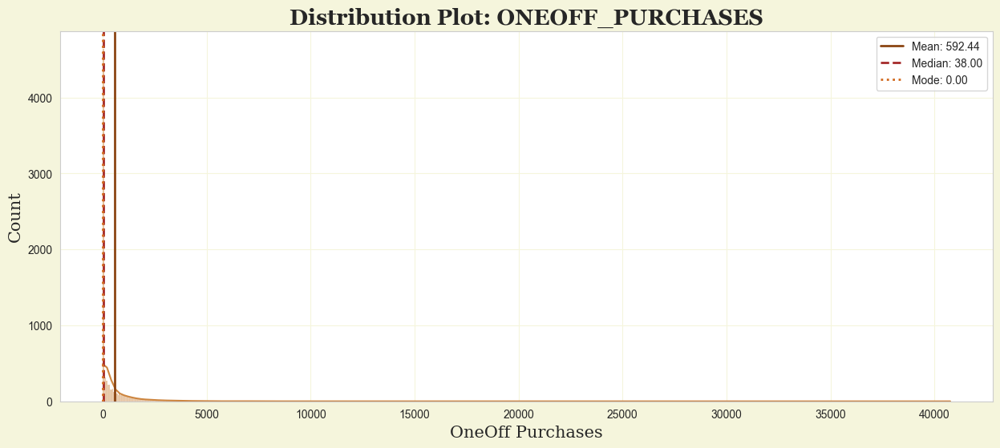

In [32]:
# Getting ONEOFF_PURCHASES data with its mean, median, mode
oneoff_purchases = df_eda['ONEOFF_PURCHASES']
eda_oneoff_purchases = {
    'mean': oneoff_purchases.mean(),
    'median': oneoff_purchases.median(),
    'mode': oneoff_purchases.mode()[0]
}

# Setting layout of the plot
plt.figure(figsize = (15, 6), facecolor = 'beige')
plt.grid(visible = True, color = 'beige')
plt.title('Distribution Plot: ONEOFF_PURCHASES', fontdict = {'family' : 'georgia', 'weight' : 'bold', 'size' : 20})
plt.xlabel('OneOff Purchases', fontdict = {'family' : 'serif', 'size' : 15})
plt.ylabel('Count', fontdict = {'family' : 'serif', 'size' : 15})

# Plotting the histogram, with KDE and mean, mode, median lines
sns.histplot(oneoff_purchases, kde = True, stat = 'count', color = 'peru')
plt.axvline(eda_oneoff_purchases['mean'], color = 'saddlebrown', linestyle = '-', linewidth = 2, label = f'Mean: {eda_oneoff_purchases["mean"]:.2f}')
plt.axvline(eda_oneoff_purchases['median'], color = 'brown', linestyle = '--', linewidth = 2, label = f'Median: {eda_oneoff_purchases["median"]:.2f}')
plt.axvline(eda_oneoff_purchases['mode'], color = 'chocolate', linestyle = ':', linewidth = 2, label = f'Mode: {eda_oneoff_purchases["mode"]:.2f}')

# Showing the plot
plt.legend()
plt.show()

### 3.2.5 INSTALLMENTS_PURCHASES
The summary of the distribution plot for **INSTALLMENTS_PURCHASES** is as follows:
- **Mean**: 411.07
- **Median**: 89.00
- **Mode**: 0.00

Hence, this plot shows a **right-skewed** distribution.

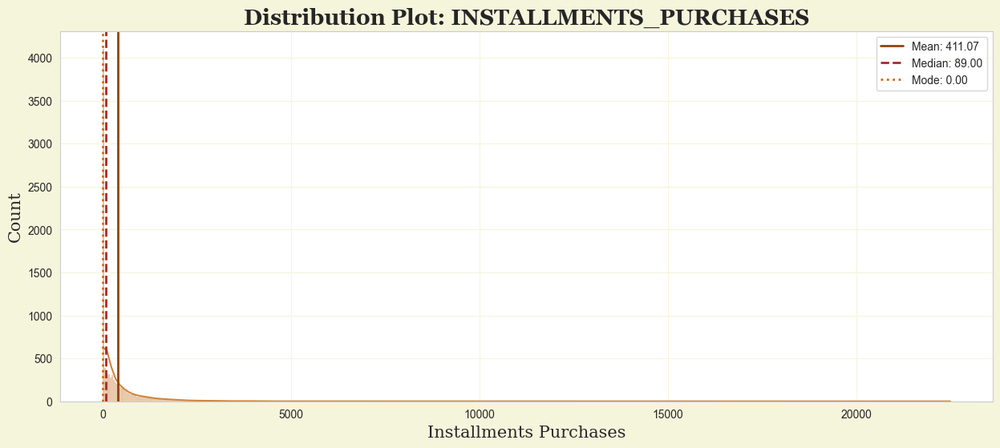

In [33]:
# Getting INSTALLMENTS_PURCHASES data with its mean, median, mode
installments_purchases = df_eda['INSTALLMENTS_PURCHASES']
eda_installments_purchases = {
    'mean': installments_purchases.mean(),
    'median': installments_purchases.median(),
    'mode': installments_purchases.mode()[0]
}

# Setting layout of the plot
plt.figure(figsize = (15, 6), facecolor = 'beige')
plt.grid(visible = True, color = 'beige')
plt.title('Distribution Plot: INSTALLMENTS_PURCHASES', fontdict = {'family' : 'georgia', 'weight' : 'bold', 'size' : 20})
plt.xlabel('Installments Purchases', fontdict = {'family' : 'serif', 'size' : 15})
plt.ylabel('Count', fontdict = {'family' : 'serif', 'size' : 15})

# Plotting the histogram, with KDE and mean, mode, median lines
sns.histplot(installments_purchases, kde = True, stat = 'count', color = 'peru')
plt.axvline(eda_installments_purchases['mean'], color = 'saddlebrown', linestyle = '-', linewidth = 2, label = f'Mean: {eda_installments_purchases["mean"]:.2f}')
plt.axvline(eda_installments_purchases['median'], color = 'brown', linestyle = '--', linewidth = 2, label = f'Median: {eda_installments_purchases["median"]:.2f}')
plt.axvline(eda_installments_purchases['mode'], color = 'chocolate', linestyle = ':', linewidth = 2, label = f'Mode: {eda_installments_purchases["mode"]:.2f}')

# Plotting the histogram, with KDE and mean, mode, median lines
plt.legend()
plt.show()

### 3.2.6 CASH_ADVANCE
The summary of the distribution plot for **CASH_ADVANCE** is as follows:
- **Mean**: 978.87
- **Median**: 0.00
- **Mode**: 0.00

Hence, this plot shows a **right-skewed** distribution.

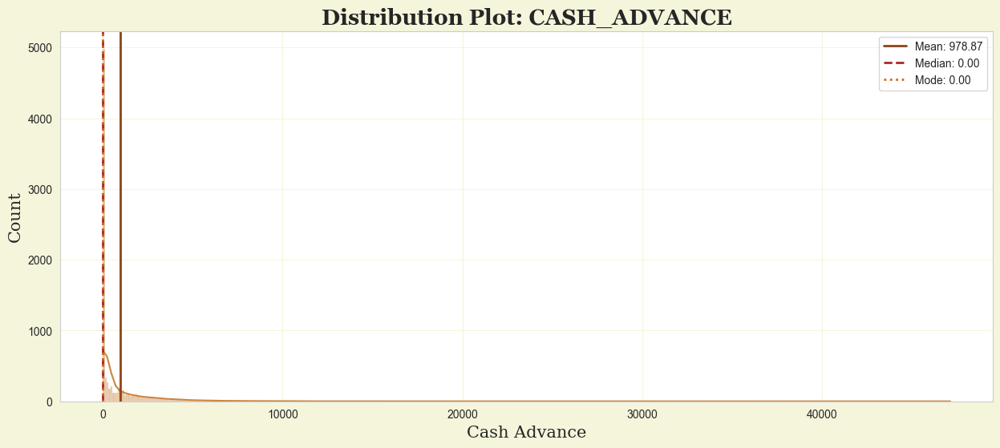

In [34]:
# Getting CASH_ADVANCE data with its mean, median, mode
cash_advance = df_eda['CASH_ADVANCE']
eda_cash_advance = {
    'mean': cash_advance.mean(),
    'median': cash_advance.median(),
    'mode': cash_advance.mode()[0]
}

# Setting layout of the plot
plt.figure(figsize = (15, 6), facecolor= 'beige')
plt.grid(visible = True, color = 'beige')
plt.title('Distribution Plot: CASH_ADVANCE', fontdict = {'family' : 'georgia', 'weight' : 'bold', 'size' : 20})
plt.xlabel('Cash Advance', fontdict = {'family' : 'serif', 'size' : 15})
plt.ylabel('Count', fontdict = {'family' : 'serif', 'size' : 15})

# Plotting the histogram, with KDE and mean, mode, median lines
sns.histplot(cash_advance, kde = True, stat = 'count', color = 'peru')
plt.axvline(eda_cash_advance['mean'], color = 'saddlebrown', linestyle = '-', linewidth = 2, label = f'Mean: {eda_cash_advance["mean"]:.2f}')
plt.axvline(eda_cash_advance['median'], color = 'brown', linestyle = '--', linewidth = 2, label = f'Median: {eda_cash_advance["median"]:.2f}')
plt.axvline(eda_cash_advance['mode'], color = 'chocolate', linestyle = ':', linewidth = 2, label = f'Mode: {eda_cash_advance["mode"]:.2f}')

# Showing the plot
plt.legend()
plt.show()

### 3.2.7 PURCHASES_FREQUENCY
The summary of the distribution plot for **PURCHASES_FREQUENCY** is as follows:
- **Mean**: 0.49
- **Median**: 0.50
- **Mode**: 1.00

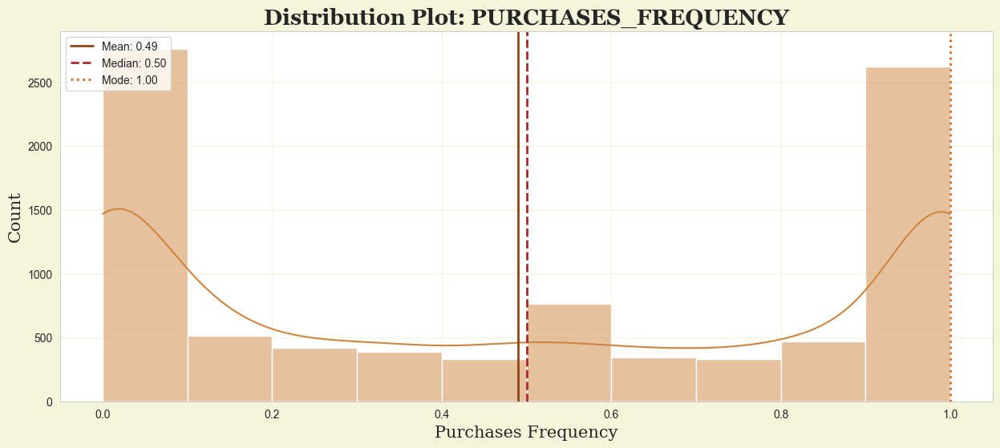

In [35]:
# Getting PURCHASES_FREQUENCY data with its mean, median, mode
purchases_freq = df_eda['PURCHASES_FREQUENCY']
eda_purchases_freq = {
    'mean': purchases_freq.mean(),
    'median': purchases_freq.median(),
    'mode': purchases_freq.mode()[0]
}

# Setting layout of the plot
plt.figure(figsize = (15, 6), facecolor = 'beige')
plt.grid(visible = True, color = 'beige')
plt.title('Distribution Plot: PURCHASES_FREQUENCY', fontdict = {'family' : 'georgia', 'weight' : 'bold', 'size' : 20})
plt.xlabel('Purchases Frequency', fontdict = {'family' : 'serif', 'size' : 15})
plt.ylabel('Count', fontdict = {'family' : 'serif', 'size' : 15})

# Plotting the histogram, with KDE and mean, mode, median lines
sns.histplot(purchases_freq, kde = True, stat = 'count', color = 'peru', binwidth = 0.1) # Setting binwidth for better visualisation
plt.axvline(eda_purchases_freq['mean'], color = 'saddlebrown', linestyle = '-', linewidth = 2, label = f'Mean: {eda_purchases_freq["mean"]:.2f}')
plt.axvline(eda_purchases_freq['median'], color = 'brown', linestyle = '--', linewidth = 2, label = f'Median: {eda_purchases_freq["median"]:.2f}')
plt.axvline(eda_purchases_freq['mode'], color = 'chocolate', linestyle = ':', linewidth = 2, label = f'Mode: {eda_purchases_freq["mode"]:.2f}')

# Showing the plot
plt.legend()
plt.show()

### 3.2.8 ONEOFF_PURCHASES_FREQUENCY
The summary of the distribution plot for **ONEOFF_PURCHASES_FREQUENCY** is as follows:
- **Mean**: 0.20
- **Median**: 0.08
- **Mode**: 0.00

Hence, this plot shows a **right-skewed** distribution.

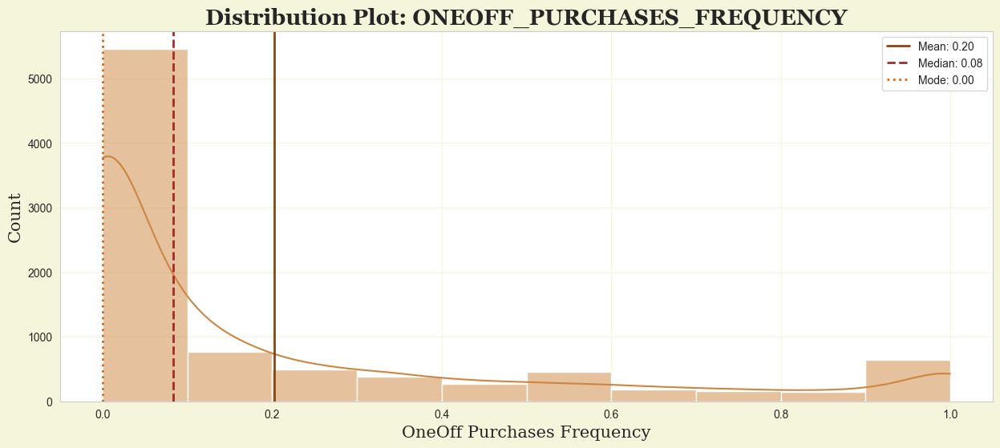

In [36]:
# Getting ONEOFF_PURCHASES_FREQUENCY data with its mean, median, mode
oneoff_purchases_freq = df_eda['ONEOFF_PURCHASES_FREQUENCY']
eda_oneoff_purchases_freq = {
    'mean': oneoff_purchases_freq.mean(),
    'median': oneoff_purchases_freq.median(),
    'mode': oneoff_purchases_freq.mode()[0]
}

# Setting layout of the plot
plt.figure(figsize = (15, 6), facecolor = 'beige')
plt.grid(visible = True, color = 'beige')
plt.title('Distribution Plot: ONEOFF_PURCHASES_FREQUENCY', fontdict = {'family' : 'georgia', 'weight' : 'bold', 'size' : 20})
plt.xlabel('OneOff Purchases Frequency', fontdict = {'family' : 'serif', 'size' : 15})
plt.ylabel('Count', fontdict = {'family' : 'serif', 'size' : 15})

# Plotting the histogram, with KDE and mean, mode, median lines
sns.histplot(oneoff_purchases_freq, kde = True, stat = 'count', color = 'peru', binwidth = 0.1) # Setting binwidth for better visualisation
plt.axvline(eda_oneoff_purchases_freq['mean'], color = 'saddlebrown', linestyle = '-', linewidth = 2, label = f'Mean: {eda_oneoff_purchases_freq["mean"]:.2f}')
plt.axvline(eda_oneoff_purchases_freq['median'], color = 'brown', linestyle = '--', linewidth = 2, label = f'Median: {eda_oneoff_purchases_freq["median"]:.2f}')
plt.axvline(eda_oneoff_purchases_freq['mode'], color = 'chocolate', linestyle = ':', linewidth = 2, label = f'Mode: {eda_oneoff_purchases_freq["mode"]:.2f}')

# Showing the plot
plt.legend()
plt.show()

### 3.2.9 PURCHASES_INSTALLMENTS_FREQUENCY
The summary of the distribution plot for **PURCHASES_INSTALLMENTS_FREQUENCY** is as follows:
- **Mean**: 0.36
- **Median**: 0.17
- **Mode**: 0.00

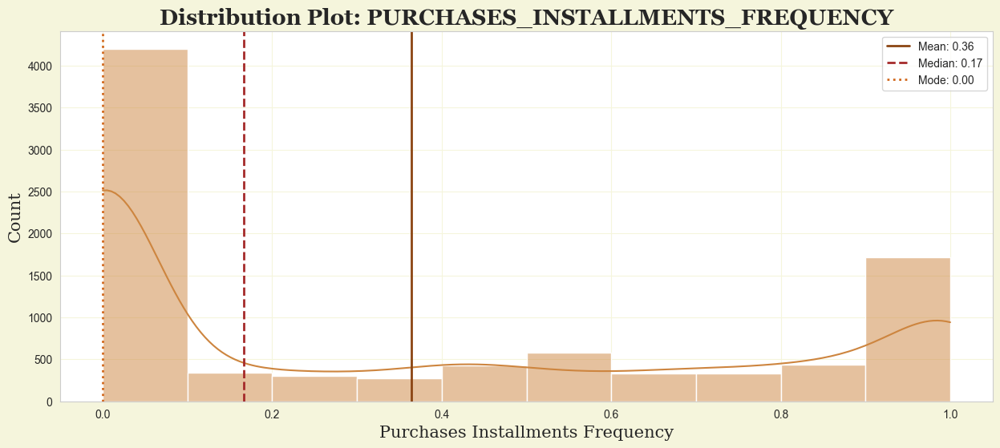

In [37]:
# Getting PURCHASES_INSTALLMENTS_FREQUENCY data with its mean, median, mode
purchases_installments_freq = df_eda['PURCHASES_INSTALLMENTS_FREQUENCY']
eda_purchases_installments_freq = {
    'mean': purchases_installments_freq.mean(),
    'median': purchases_installments_freq.median(),
    'mode': purchases_installments_freq.mode()[0]
}

# Setting layout of the plot
plt.figure(figsize = (15, 6), facecolor = 'beige')
plt.grid(visible = True, color = 'beige')
plt.title('Distribution Plot: PURCHASES_INSTALLMENTS_FREQUENCY', fontdict = {'family' : 'georgia', 'weight' : 'bold', 'size' : 20})
plt.xlabel('Purchases Installments Frequency', fontdict = {'family' : 'serif', 'size' : 15})
plt.ylabel('Count', fontdict = {'family' : 'serif', 'size' : 15})

# Plotting the histogram, with KDE and mean, mode, median lines
sns.histplot(purchases_installments_freq, kde = True, stat = 'count', color = 'peru', binwidth = 0.1) #Setting binwidth for better visualisation
plt.axvline(eda_purchases_installments_freq['mean'], color = 'saddlebrown', linestyle = '-', linewidth = 2, label = f'Mean: {eda_purchases_installments_freq["mean"]:.2f}')
plt.axvline(eda_purchases_installments_freq['median'], color = 'brown', linestyle = '--', linewidth = 2, label = f'Median: {eda_purchases_installments_freq["median"]:.2f}')
plt.axvline(eda_purchases_installments_freq['mode'], color = 'chocolate', linestyle = ':', linewidth = 2, label = f'Mode: {eda_purchases_installments_freq["mode"]:.2f}')

# Showing the plot
plt.legend()
plt.show()

### 3.2.10 CASH_ADVANCE_FREQUENCY
The summary of the distribution plot for **CASH_ADVANCE_FREQUENCY** is as follows:
- **Mean**: 0.14
- **Median**: 0.00
- **Mode**: 0.00

Hence, this plot shows a **right-skewed** distribution.

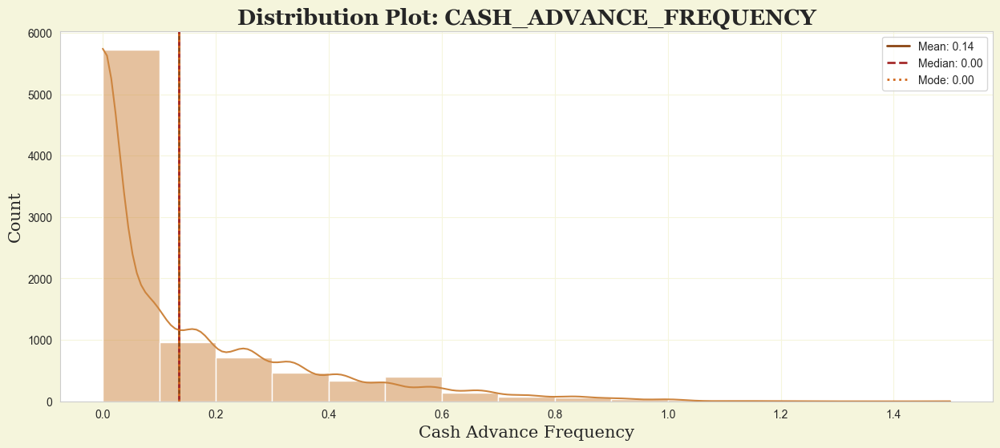

In [38]:
# Getting CASH_ADVANCE_FREQUENCY data with its mean, median, mode
cash_advance_freq = df_eda['CASH_ADVANCE_FREQUENCY']
eda_cash_advance_freq = {
    'mean': cash_advance_freq.mean(),
    'median': cash_advance_freq.median(),
    'mode': cash_advance_freq.mode()[0]
}

# Setting layout of the plot
plt.figure(figsize = (15, 6), facecolor = 'beige')
plt.grid(visible = True, color = 'beige')
plt.title('Distribution Plot: CASH_ADVANCE_FREQUENCY', fontdict = {'family' : 'georgia', 'weight' : 'bold', 'size' : 20})
plt.xlabel('Cash Advance Frequency', fontdict = {'family' : 'serif', 'size' : 15})
plt.ylabel('Count', fontdict = {'family' : 'serif', 'size' : 15})

# Plotting the histogram, with KDE and mean, mode, median lines
sns.histplot(cash_advance_freq, kde = True, stat = 'count', color = 'peru', binwidth = 0.1)
plt.axvline(eda_cash_advance_freq['mean'], color = 'saddlebrown', linestyle = '-', linewidth = 2, label = f'Mean: {eda_cash_advance_freq["mean"]:.2f}')
plt.axvline(eda_cash_advance_freq['mean'], color = 'brown', linestyle = '--', linewidth = 2, label = f'Median: {eda_cash_advance_freq["median"]:.2f}')
plt.axvline(eda_cash_advance_freq['mean'], color = 'chocolate', linestyle = ':', linewidth = 2, label = f'Mode: {eda_cash_advance_freq["mode"]:.2f}')

# Showing the plot
plt.legend()
plt.show()

### 3.2.11 CASH_ADVANCE_TRX
The summary of the distribution plot for **CASH_ADVANCE_TRX** is as follows:
- **Mean**: 3.25
- **Median**: 0.00
- **Mode**: 0.00

Hence, this plot shows a **right-skewed** distribution.

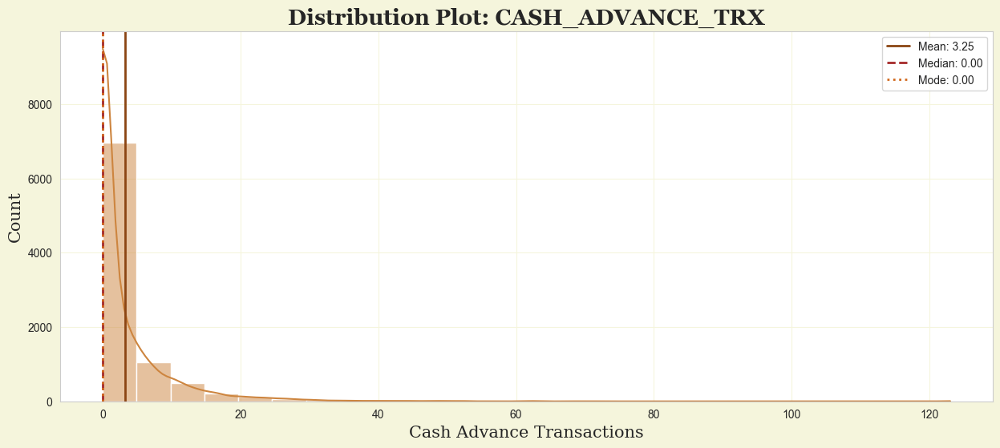

In [39]:
# Getting CASH_ADVANCE_TRX data with its mean, median, mode
cash_advance_trx = df_eda['CASH_ADVANCE_TRX']
eda_cash_advance_trx = {
    'mean': cash_advance_trx.mean(),
    'median': cash_advance_trx.median(),
    'mode': cash_advance_trx.mode()[0]
}

# Setting layout of the plot
plt.figure(figsize = (15, 6), facecolor = 'beige')
plt.grid(visible = True, color = 'beige')
plt.title('Distribution Plot: CASH_ADVANCE_TRX', fontdict = {'family' : 'georgia', 'weight' : 'bold', 'size' : 20})
plt.xlabel('Cash Advance Transactions', fontdict = {'family' : 'serif', 'size' : 15})
plt.ylabel('Count', fontdict = {'family' : 'serif', 'size' : 15})

# Plotting the histogram, with KDE and mean, mode, median lines
sns.histplot(cash_advance_trx, kde = True, stat = 'count', color = 'peru', binwidth = 5) # Setting binwidth for better visualisation
plt.axvline(eda_cash_advance_trx['mean'], color = 'saddlebrown', linestyle = '-', linewidth = 2, label = f'Mean: {eda_cash_advance_trx["mean"]:.2f}')
plt.axvline(eda_cash_advance_trx['median'], color = 'brown', linestyle = '--', linewidth = 2, label = f'Median: {eda_cash_advance_trx["median"]:.2f}')
plt.axvline(eda_cash_advance_trx['mode'], color = 'chocolate', linestyle = ':', linewidth = 2, label = f'Mode: {eda_cash_advance_trx["mode"]:.2f}')

# Showing the plot
plt.legend()
plt.show()

### 3.2.12 PURCHASES_TRX
The summary of the distribution plot for **PURCHASES_TRX** is as follows:
- **Mean**: 14.71
- **Median**: 7.00
- **Mode**: 0.00

Hence, this plot shows a **right-skewed** distribution.

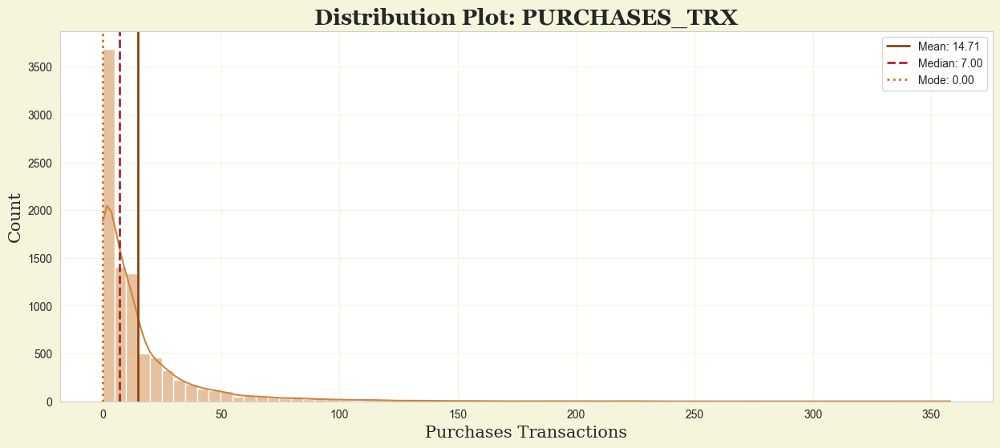

In [40]:
# Getting PURCHASES_TRX data with its mean, median, mode
purchases_trx = df_eda['PURCHASES_TRX']
eda_purchases_trx = {
    'mean': purchases_trx.mean(),
    'median': purchases_trx.median(),
    'mode': purchases_trx.mode()[0]
}

# Setting layout of the plot
plt.figure(figsize = (15, 6), facecolor = 'beige')
plt.grid(visible = True, color = 'beige')
plt.title('Distribution Plot: PURCHASES_TRX', fontdict = {'family' : 'georgia', 'weight' : 'bold', 'size' : 20})
plt.xlabel('Purchases Transactions', fontdict = {'family' : 'serif', 'size' : 15})
plt.ylabel('Count', fontdict = {'family' : 'serif', 'size' : 15})

# Plotting the histogram, with KDE and mean, mode, median lines
sns.histplot(purchases_trx, kde = True, stat = 'count', color = 'peru', binwidth = 5) # 
plt.axvline(eda_purchases_trx['mean'], color = 'saddlebrown', linestyle = '-', linewidth=2, label = f'Mean: {eda_purchases_trx["mean"]:.2f}')
plt.axvline(eda_purchases_trx['median'], color = 'brown', linestyle = '--', linewidth = 2, label = f'Median: {eda_purchases_trx["median"]:.2f}')
plt.axvline(eda_purchases_trx['mode'], color = 'chocolate', linestyle = ':', linewidth = 2, label = f'Mode: {eda_purchases_trx["mode"]:.2f}')

# Showing the plot
plt.legend()
plt.show()

### 3.2.13 CREDIT_LIMIT
The summary of the distribution plot for **CREDIT_LIMIT** is as follows:
- **Mean**: 4494.18
- **Median**: 3000.00
- **Mode**: 3000.00

Hence, this plot shows a **right-skewed** distribution.

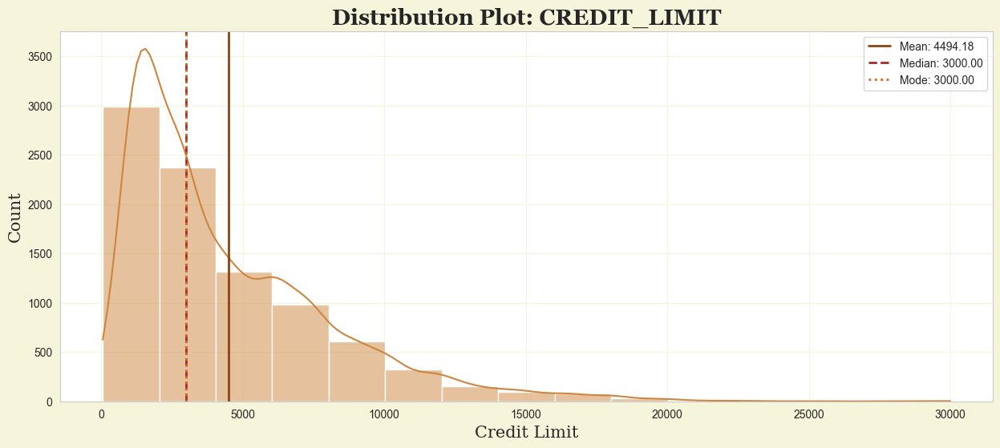

In [41]:
# Getting CREDIT_LIMIT data with its mean, median, mode
credit_limit = df_eda['CREDIT_LIMIT']
eda_credit_limit = {
    'mean': credit_limit.mean(),
    'median': credit_limit.median(),
    'mode': credit_limit.mode()[0]
}

# Setting layout of the plot
plt.figure(figsize = (15, 6), facecolor = 'beige')
plt.grid(visible = True, color = 'beige')
plt.title('Distribution Plot: CREDIT_LIMIT', fontdict = {'family' : 'georgia', 'weight' : 'bold', 'size' : 20})
plt.xlabel('Credit Limit', fontdict = {'family' : 'serif', 'size' : 15})
plt.ylabel('Count', fontdict = {'family' : 'serif', 'size' : 15})

# Plotting the histogram, with KDE and mean, mode, median lines
sns.histplot(credit_limit, kde = True, stat = 'count', color = 'peru', binwidth = 2000) # Setting binwidth for better visualisation
plt.axvline(eda_credit_limit['mean'], color = 'saddlebrown', linestyle = '-', linewidth = 2, label = f'Mean: {eda_credit_limit["mean"]:.2f}')
plt.axvline(eda_credit_limit['median'], color = 'brown', linestyle = '--', linewidth = 2, label = f'Median: {eda_credit_limit["median"]:.2f}')
plt.axvline(eda_credit_limit['mode'], color = 'chocolate', linestyle = ':', linewidth = 2, label = f'Mode: {eda_credit_limit["mode"]:.2f}')

# Showing the plot
plt.legend()
plt.show()

### 3.2.14 PAYMENTS
The summary of the distribution plot for **PAYMENTS** is as follows:
- **Mean**: 1733.14
- **Median**: 856.90
- **Mode**: 0.00

Hence, this plot shows a **right-skewed** distribution.

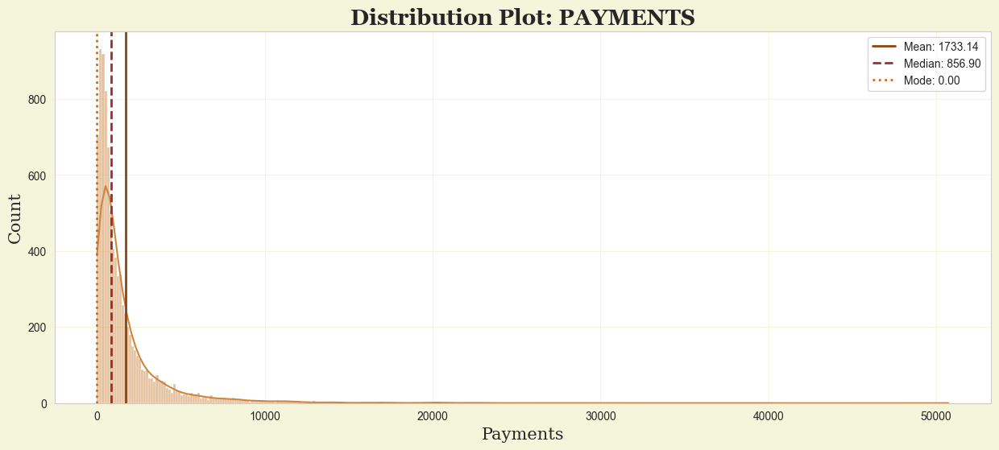

In [42]:
# Getting PAYMENTS data with its mean, median, mode
payments = df_eda['PAYMENTS']
eda_payments = {
    'mean': payments.mean(),
    'median': payments.median(),
    'mode': payments.mode()[0]
}

# Setting layout of the plot
plt.figure(figsize = (15, 6), facecolor = 'beige')
plt.grid(visible = True, color = 'beige')
plt.title('Distribution Plot: PAYMENTS', fontdict = {'family' : 'georgia', 'weight' : 'bold', 'size' : 20})
plt.xlabel('Payments', fontdict = {'family' : 'serif', 'size' : 15})
plt.ylabel('Count', fontdict = {'family' : 'serif', 'size' : 15})

# Plotting the histogram, with KDE and mean, mode, median lines
sns.histplot(payments, kde = True, stat = 'count', color = 'peru')
plt.axvline(eda_payments['mean'], color = 'saddlebrown', linestyle = '-', linewidth = 2, label = f'Mean: {eda_payments["mean"]:.2f}')
plt.axvline(eda_payments['median'], color = 'brown', linestyle = '--', linewidth = 2, label = f'Median: {eda_payments["median"]:.2f}')
plt.axvline(eda_payments['mode'], color = 'chocolate', linestyle = ':', linewidth = 2, label = f'Mode: {eda_payments["mode"]:.2f}')

# Showing the plot
plt.legend()
plt.show()

### 3.2.15 MINIMUM_PAYMENTS
The summary of the distribution plot for **MINIMUM_PAYMENTS** is as follows:
- **Mean**: 854.29
- **Median**: 300.49
- **Mode**: 36.62

Hence, this plot shows a **right-skewed** distribution.

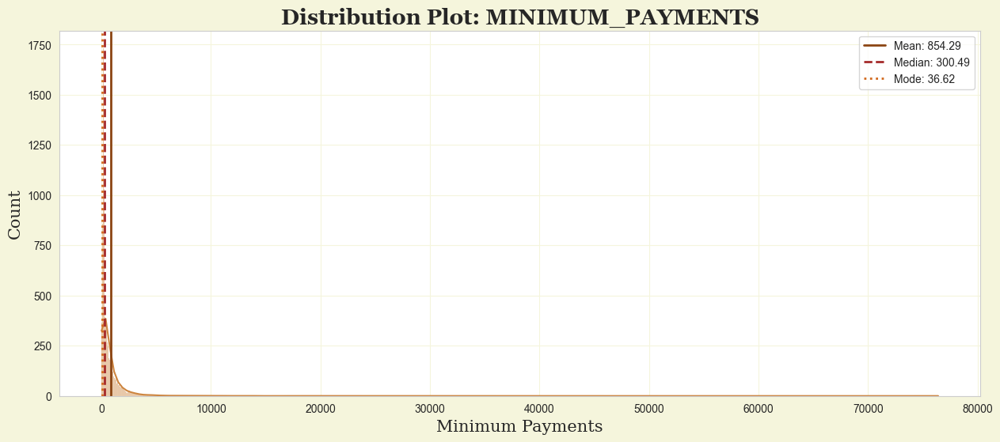

In [43]:
# Getting MINIMUM_PAYMENTS data with its mean, median, mode
min_payments = df_eda['MINIMUM_PAYMENTS']
eda_min_payments = {
    'mean': min_payments.mean(),
    'median': min_payments.median(),
    'mode': min_payments.mode()[0]
}

# Setting layout of the plot
plt.figure(figsize = (15, 6), facecolor = 'beige')
plt.grid(visible = True, color = 'beige')
plt.title('Distribution Plot: MINIMUM_PAYMENTS', fontdict = {'family' : 'georgia', 'weight' : 'bold', 'size' : 20})
plt.xlabel('Minimum Payments', fontdict = {'family' : 'serif', 'size' : 15})
plt.ylabel('Count', fontdict = {'family' : 'serif', 'size' : 15})

# Plotting the histogram, with KDE and mean, mode, median lines
sns.histplot(min_payments, kde = True, stat = 'count', color = 'peru')
plt.axvline(eda_min_payments['mean'], color = 'saddlebrown', linestyle = '-', linewidth = 2, label = f'Mean: {eda_min_payments["mean"]:.2f}')
plt.axvline(eda_min_payments['median'], color = 'brown', linestyle = '--', linewidth = 2, label = f'Median: {eda_min_payments["median"]:.2f}')
plt.axvline(eda_min_payments['mode'], color = 'chocolate', linestyle = ':', linewidth = 2, label = f'Mode: {eda_min_payments["mode"]:.2f}')

# Showing the plot
plt.legend()
plt.show()

### 3.2.16 PRC_FULL_PAYMENT
The summary of the distribution plot for **PRC_FULL_PAYMENT** is as follows:
- **Mean**: 0.15
- **Median**: 0.00
- **Mode**: 0.00

Hence, this plot shows a **right-skewed** distribution.

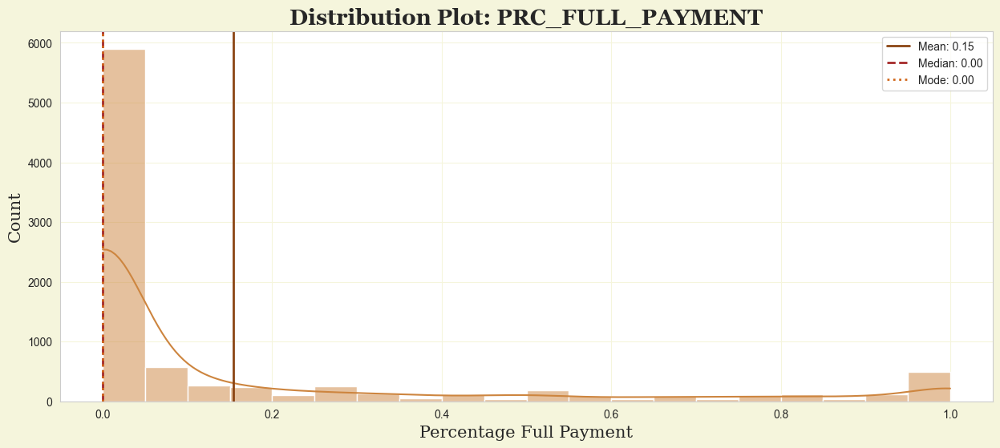

In [44]:
# Getting PRC_FULL_PAYMENT data with its mean, median, mode
prc_full_payment = df_eda['PRC_FULL_PAYMENT']
eda_prc_full_payment = {
    'mean': prc_full_payment.mean(),
    'median': prc_full_payment.median(),
    'mode': prc_full_payment.mode()[0]
}

# Setting layout of the plot
plt.figure(figsize = (15, 6), facecolor = 'beige')
plt.grid(visible = True, color = 'beige')
plt.title('Distribution Plot: PRC_FULL_PAYMENT', fontdict = {'family' : 'georgia', 'weight' : 'bold', 'size' : 20})
plt.xlabel('Percentage Full Payment', fontdict = {'family' : 'serif', 'size' : 15})
plt.ylabel('Count', fontdict = {'family' : 'serif', 'size' : 15})

# Plotting the histogram, with KDE and mean, mode, median lines
sns.histplot(prc_full_payment, kde = True, stat = 'count', color = 'peru', binwidth = 0.05)
plt.axvline(eda_prc_full_payment['mean'], color = 'saddlebrown', linestyle = '-', linewidth = 2, label = f'Mean: {eda_prc_full_payment["mean"]:.2f}')
plt.axvline(eda_prc_full_payment['median'], color = 'brown', linestyle = '--', linewidth = 2, label = f'Median: {eda_prc_full_payment["median"]:.2f}')
plt.axvline(eda_prc_full_payment['mode'], color = 'chocolate', linestyle = ':', linewidth = 2, label = f'Mode: {eda_prc_full_payment["mode"]:.2f}')

# Showing the plot
plt.legend()
plt.show()

### 3.2.17 TENURE
The bar chart shows that most cardholders have a tenure of **12 months**, followed by **11 months** and **10 months**, with respectively **84.74%**, **4.08%** and **2.64%** of the total customers.

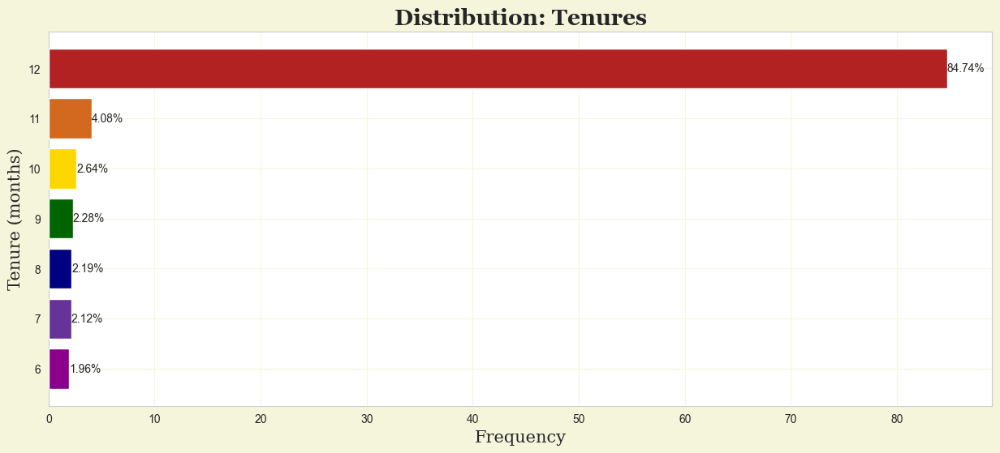

In [45]:
# Getting TENURE data with the respective counts
tenure_value_counts = df_eda['TENURE'].value_counts().sort_values(ascending = False)
tenure_value_percents = [(row / sum(tenure_value_counts)) * 100 for row in tenure_value_counts]

# Setting layout of the plot
fig, ax = plt.subplots(figsize = (15, 6))
colours = ('firebrick', 'chocolate', 'gold', 'darkgreen', 'navy', 'rebeccapurple', 'darkmagenta')
fig.patch.set_facecolor('beige')
ax.grid(visible = True, color = 'beige', zorder=0)
ax.set_title('Distribution: Tenures', fontdict = {'family' : 'georgia', 'weight' : 'bold', 'size' : 20})
ax.set_xlabel('Frequency', fontdict = {'family' : 'serif', 'size' : 15})
ax.set_ylabel('Tenure (months)', fontdict = {'family' : 'serif', 'size' : 15})

# Plotting the horizontal bar chart
bars = ax.barh(tenure_value_counts.index.sort_values(ascending = False), tenure_value_percents, color = colours, zorder = 3)
ax.bar_label(bars, fmt = '%.2f%%')

# Showing the plot
plt.show()

## 3.3 Bivariate Analysis
This sections considers only some of the features in the following scatter plots

### 3.3.1 CREDIT LIMIT vs TENURE
The scatter plot shows that different tenure have **slightly different** credit limits distribution.

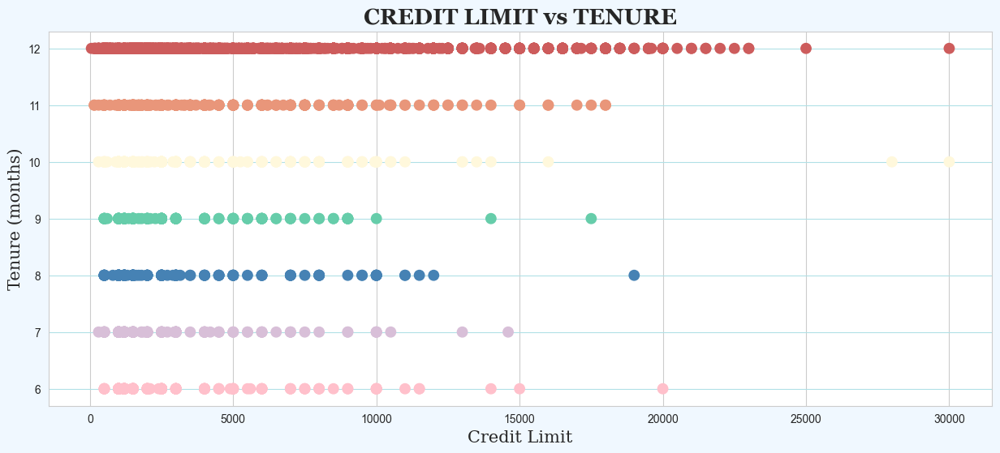

In [46]:
# Color mapping for different tenure values
color_map = {
    12: 'indianred',
    11: 'darksalmon',
    10: 'cornsilk',
    9: 'mediumaquamarine',
    8: 'steelblue',
    7: 'thistle'
}

# Constructing color list using list comprehension
colors = [color_map.get(value, 'pink') for value in df_eda['TENURE']]

# Setting layout of the plot
plt.figure(figsize = (15, 6)).patch.set_facecolor('aliceblue')
plt.gca().grid(visible = True, color = 'powderblue', zorder = 1, axis = 'y')
plt.title('CREDIT LIMIT vs TENURE', fontdict = {'family': 'georgia', 'weight': 'bold', 'size': 20})
plt.xlabel('Credit Limit', fontdict = {'family': 'serif', 'size': 15})
plt.ylabel('Tenure (months)', fontdict = {'family': 'serif', 'size': 15})

# PLotting scatter plot
plt.scatter(df_eda['CREDIT_LIMIT'], df_eda['TENURE'], c = colors, zorder = 3, s = 80)

# Showing the plot
plt.show()

### 3.3.2 ONEOFF_PURCHASES vs PURCHASES 
The scatter plot shows that these two features are highly correlated, it is suspected that **PURCHASES** is derived from **ONEOFF_PURCHASES**.

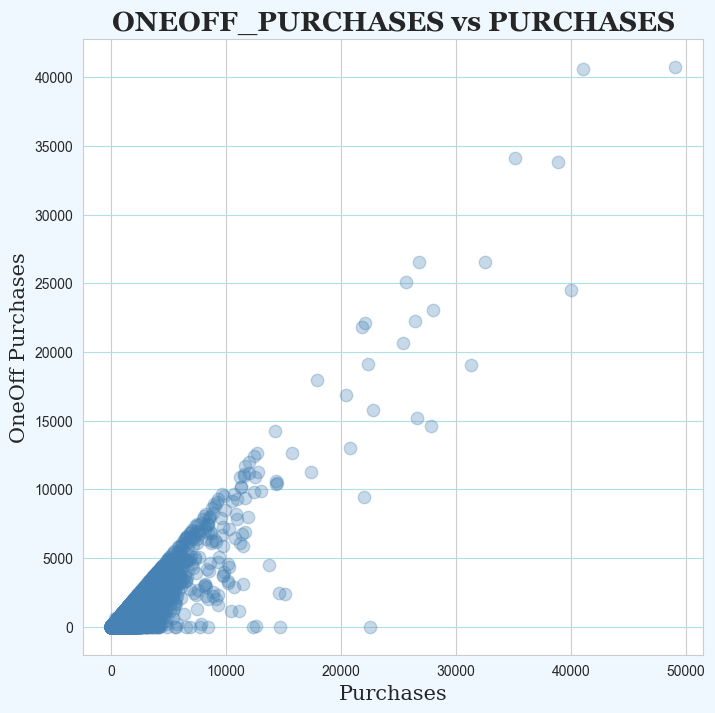

In [47]:
# Setting layout of the plot
plt.figure(figsize = (8, 8)).patch.set_facecolor('aliceblue')
plt.gca().grid(visible = True, color = 'powderblue', zorder = 1, axis = 'y')
plt.title('ONEOFF_PURCHASES vs PURCHASES', fontdict = {'family': 'georgia', 'weight': 'bold', 'size': 20})
plt.xlabel('Purchases', fontdict = {'family': 'serif', 'size': 15})
plt.ylabel('OneOff Purchases', fontdict = {'family': 'serif', 'size': 15})

# Plotting scatter plot
plt.scatter(df_eda['PURCHASES'], df_eda['ONEOFF_PURCHASES'], c = 'steelblue', zorder = 3, s = 80, alpha = 0.3)

# Showing the plot
plt.show()

### 3.3.3 INSTALLMENT_PURCHASES vs PURCHASES
The scatter plot also shows highly correlated relationship, therefore there is a strong evidence that the **PURCHASES** feature is the sum of **ONEOFF_PURCHASES** and **INSTALLMENTS_PURCHASES** features.

Hence, the **PURCHASES** feature can later be dropped from the dataset.

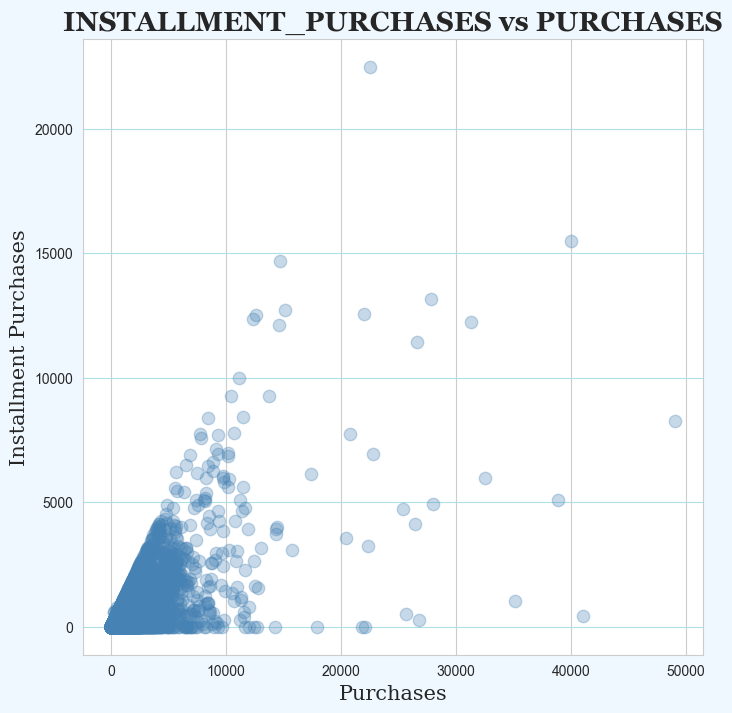

In [48]:
# Setting layout of the plot
plt.figure(figsize = (8, 8)).patch.set_facecolor('aliceblue')
plt.gca().grid(visible = True, color = 'powderblue', zorder = 1, axis = 'y')
plt.title('INSTALLMENT_PURCHASES vs PURCHASES', fontdict = {'family': 'georgia', 'weight': 'bold', 'size': 20})
plt.xlabel('Purchases', fontdict = {'family': 'serif', 'size': 15})
plt.ylabel('Installment Purchases', fontdict = {'family': 'serif', 'size': 15})

# Plotting scatter plot
plt.scatter(df_eda['PURCHASES'], df_eda['INSTALLMENTS_PURCHASES'], c = 'steelblue', zorder = 3, s = 80, alpha = 0.3)

# Showing the plot
plt.show()

### 3.3.4 CASH_ADVANCE vs BALANCE
The scatter plot shows a considerable correlation between these two features, although not obvious in the plot, but this is supported by the correlation matrix. 

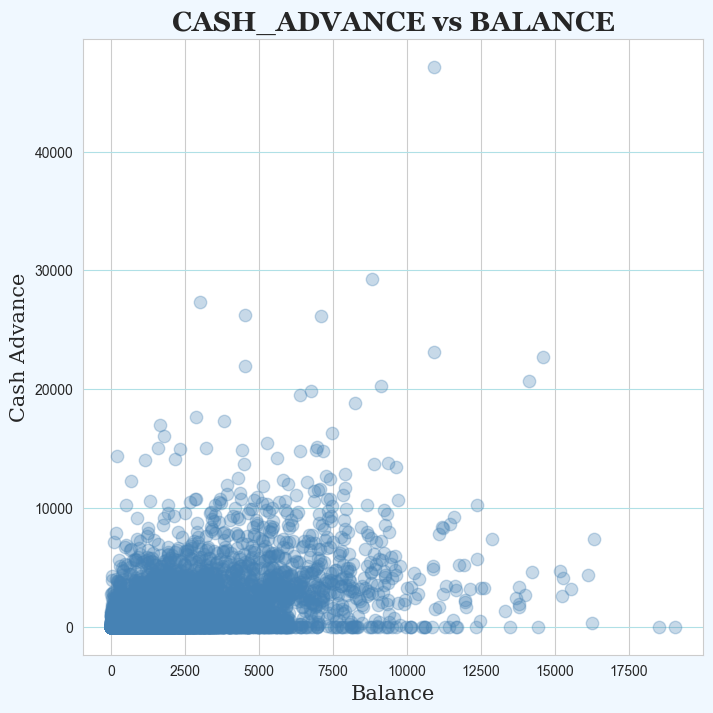

In [49]:
# Setting the layout of the plot
plt.figure(figsize = (8, 8)).patch.set_facecolor('aliceblue')
plt.gca().grid(visible = True, color = 'powderblue', zorder = 1, axis = 'y')
plt.title('CASH_ADVANCE vs BALANCE', fontdict = {'family': 'georgia', 'weight': 'bold', 'size': 20})
plt.xlabel('Balance', fontdict = {'family': 'serif', 'size': 15})
plt.ylabel('Cash Advance', fontdict = {'family': 'serif', 'size': 15})

# Plotting scatter plot
plt.scatter(df_eda['BALANCE'], df_eda['CASH_ADVANCE'], c = 'steelblue', zorder = 3, s = 80, alpha = 0.3)

# Showing the plot
plt.show()

### 3.3.5 CREDIT_LIMIT vs BALANCE

The scatter plot also shows a considerable correlation between these two features.

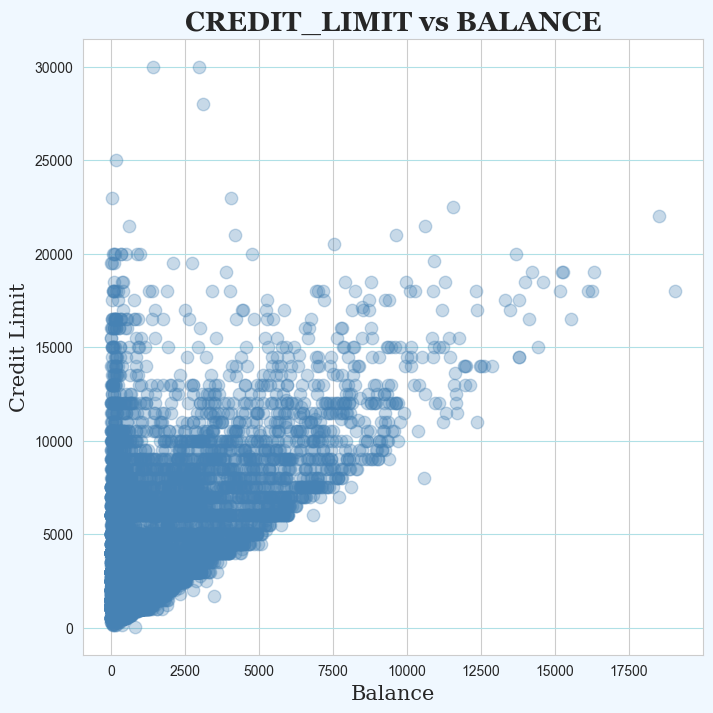

In [50]:
# Setting layout of the plot
plt.figure(figsize = (8, 8)).patch.set_facecolor('aliceblue')
plt.gca().grid(visible=True, color='powderblue', zorder=1, axis='y')
plt.title('CREDIT_LIMIT vs BALANCE', fontdict = {'family': 'georgia', 'weight': 'bold', 'size': 20})
plt.xlabel('Balance', fontdict = {'family': 'serif', 'size': 15})
plt.ylabel('Credit Limit', fontdict = {'family': 'serif', 'size': 15})

# Plotting scatter plot
plt.scatter(df_eda['BALANCE'], df_eda['CREDIT_LIMIT'], c = 'steelblue', zorder = 3, s = 80, alpha = 0.3)

# Showing the plot
plt.show()

### 3.3.6 PURCHASES_INSTALLMENTS_FREQUENCY vs PURCHASES_FREQUENCY

The scatter plot shows a weird relationship between these two features.

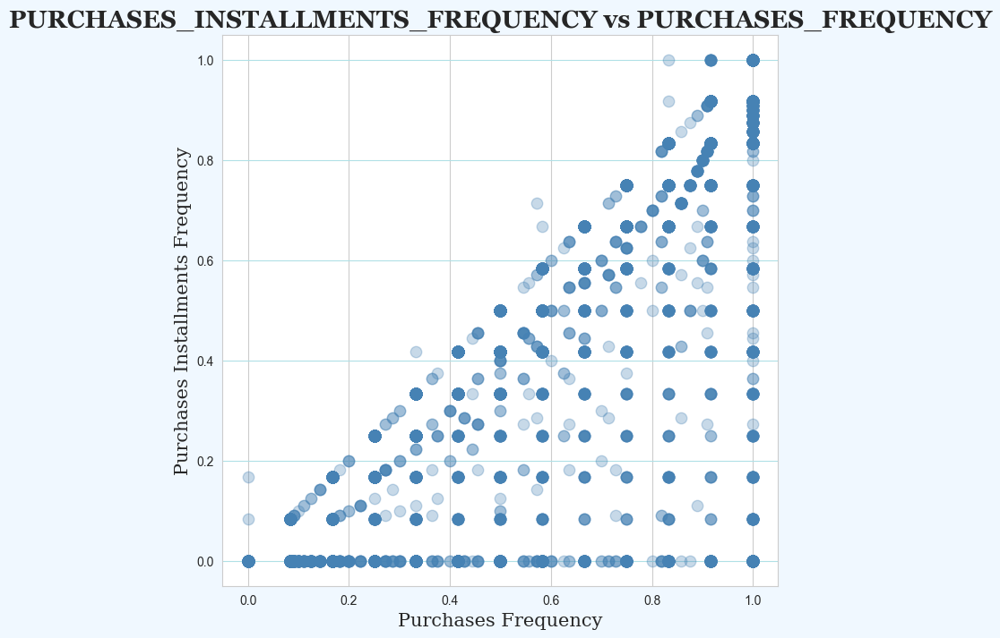

In [51]:
# Setting layout of the plot
plt.figure(figsize = (8, 8)).patch.set_facecolor('aliceblue')
plt.gca().grid(visible=True, color='powderblue', zorder=1, axis='y')
plt.title('PURCHASES_INSTALLMENTS_FREQUENCY vs PURCHASES_FREQUENCY', fontdict = {'family': 'georgia', 'weight': 'bold', 'size': 20})
plt.xlabel('Purchases Frequency', fontdict = {'family': 'serif', 'size': 15})
plt.ylabel('Purchases Installments Frequency', fontdict = {'family': 'serif', 'size': 15})

# Plotting scatter plot
plt.scatter(df_eda['PURCHASES_FREQUENCY'], df_eda['PURCHASES_INSTALLMENTS_FREQUENCY'], c = 'steelblue', zorder = 3, s = 80, alpha = 0.3)

# Showing the plot
plt.show()

## 3.4 Multivariate Analysis

### 3.4.1 t-Distributed Stochastic Neighbor Embedding (t-SNE)
This is a statistical technique for visualizing high-dimensional data by giving each datapoint a location in a two or three-dimensional map. It is a **nonlinear dimensionality reduction technique** as opposed to **Principal Component Analysis (PCA)**, that is particularly well-suited for embedding high-dimensional data into a space of two or three dimensions, which can then be visualized in a scatter plot.

Firstly, the pairwise similarities between all the data points in their original dimension. The pairwise similarity  $p_{ij}$  between data points $x_i$ and $x_j$ is actually the conditional probability that $x_i$ would pick $x_j$ as its neighbor if neighbors were picked in proportion to their probability density under a Gaussian centered at $x_i$. The points that are far apart have a lower probability of being picked than the points that are close together. The mathematical equation is shown as follows:
 
\begin{align*}
p_{ij} = \frac{exp(-\|x_i - x_j\|^2 / 2\sigma_i^2)}{\sum_{k \neq i} exp(-\|x_i - x_k\|^2 / 2\sigma_i^2)}
\end{align*}

Secondly, the data points are randomly placed in the lower-dimensional space. The algorithm then computes the pairwise similarities between all the data points in the lower-dimensional space using a t-distribution with one degree of freedom. The similarity  $q_{ij}$  between two points $y_i$ and $y_j$ in the lower-dimensional space is given by: 

\begin{align*}
q_{ij} = \frac{(1 + \|y_i - y_j\|^2)^{-1}}{\sum_{k \neq i} (1 + \|y_i - y_k\|^2)^{-1}}
\end{align*}

Lastly, the algorithm tries to minimize the difference between the pairwise-distance matrix of the original high-dimensional data and the lower-dimensional representation. The algorithm normally uses gradient descent to adjust the position of data points in the lower dimension iteratively until the pairwise-distance matrix in the lower dimension is close enough to that in the original dimension.

The output of t-SNE is visualised using a **Kernel Density Estimation (KDE)** plot. Darker regions refer to higher density of data points, which may signify the presence of clusters in the data.

**References:**
 1) [Mastering t-SNE(t-distributed stochastic neighbor embedding)](https://medium.com/@sachinsoni600517/mastering-t-sne-t-distributed-stochastic-neighbor-embedding-0e365ee898ea#:~:text=t%2DSNE%2C%20or%20t%2D,typically%20two%20or%20three%20dimensions)

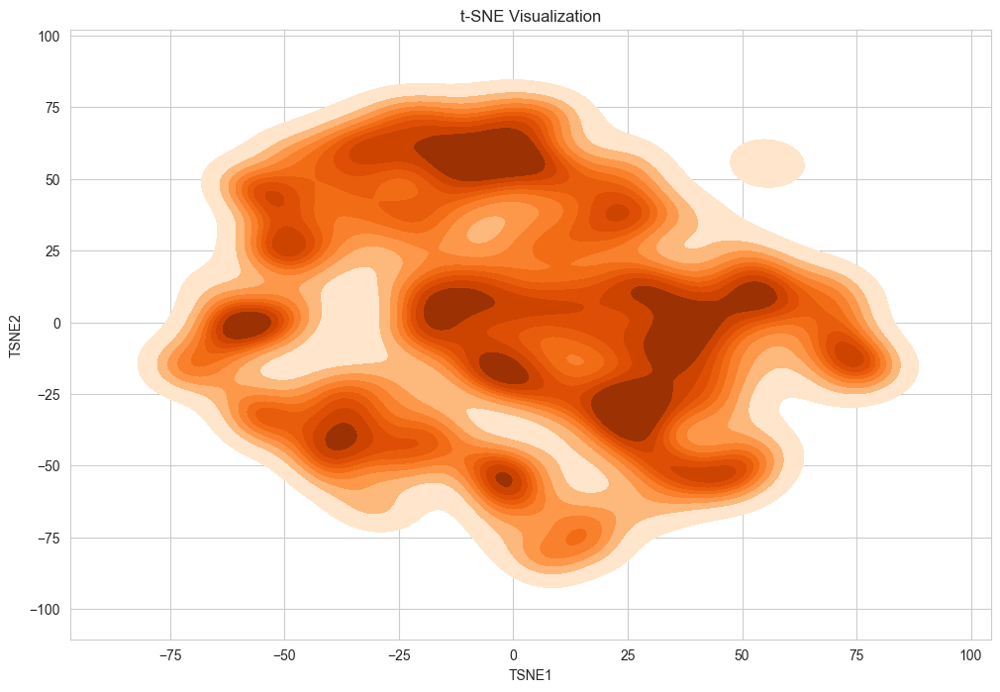

In [52]:
# Defining standard scaler for numerical columns
scaler = StandardScaler()

# Scaling numerical columns
df_scaled = scaler.fit_transform(df_eda[numerical_cols])

# Perform t-SNE with 2 components
# Random state is set to 42 for reproducibility
tsne = TSNE(n_components = 2, random_state = 42)
tsne_results = tsne.fit_transform(df_scaled)

# Create a DataFrame with t-SNE results
df_tsne = pd.DataFrame(tsne_results, columns = ['TSNE1', 'TSNE2'])

# Setting layout of the plot
plt.figure(figsize = (12, 8))
plt.title('t-SNE Visualization')
plt.xlabel('TSNE1')
plt.ylabel('TSNE2')

# Plotting t-SNE using kdeplot
sns.kdeplot(x = df_tsne['TSNE1'], y = df_tsne['TSNE2'], cmap = sns.color_palette('Oranges', as_cmap = True), fill = True, bw_adjust = 0.8) # Setting binwidth for better visualisation

# Showing the plot
plt.show()

## 3.5 Additional Considerations

### 3.5.1 PURCHASES, ONEOFF_PURCHASES & INSTALLMENTS_PURCHASES
It is suspected that **PURCHASES** is derived from **ONEOFF_PURCHASES** and **INSTALLMENTS_PURCHASES**.

Hence, the relationship between these features is further analysed and evaluated.

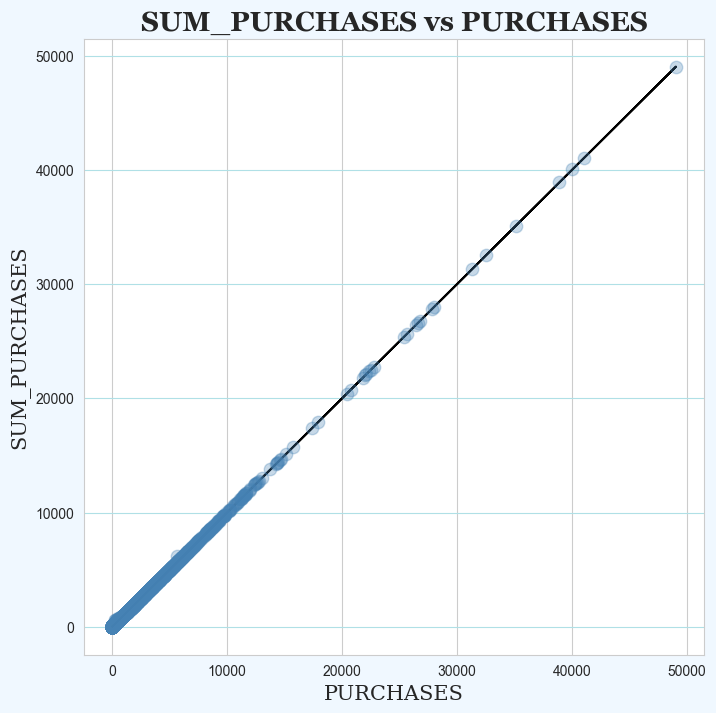

In [53]:
# Summing up 'ONEOFF_PURCHASES' and 'INSTALLMENTS_PURCHASES' features
df_eda['SUM_PURCHASES'] = df_eda['ONEOFF_PURCHASES'] + df_eda['INSTALLMENTS_PURCHASES']

# Getting correlation matrix
corr_matrix = df_eda[['PURCHASES', 'SUM_PURCHASES']].corr()

# Plotting the scatter plot
plt.figure(figsize = (8, 8)).patch.set_facecolor('aliceblue')
plt.gca().grid(visible=True, color='powderblue', zorder=1, axis='y')
plt.title('SUM_PURCHASES vs PURCHASES', fontdict = {'family': 'georgia', 'weight': 'bold', 'size': 20})
plt.xlabel('PURCHASES', fontdict = {'family': 'serif', 'size': 15})
plt.ylabel('SUM_PURCHASES', fontdict = {'family': 'serif', 'size': 15})
plt.scatter(df_eda['PURCHASES'], df_eda['SUM_PURCHASES'], c = 'steelblue', zorder = 3, s = 80, alpha = 0.3)
plt.plot(df_eda['PURCHASES'], df_eda['PURCHASES'], color='black')
plt.show()

**Conclusion:**

It has been shown that **PURCHASES** is derived from **ONEOFF_PURCHASES** and **INSTALLMENTS_PURCHASES**. Hence, **PURCHASES** column can be dropped from the dataset.

### 3.5.2 PURCHASES_FREQUENCY, ONEOFF_PURCHASES_FREQUENCY & PURCHASES_INSTALLMENTS_FREQUENCY
The same behaviour is also suspected in **PURCHASES_FREQUENCY**, **ONEOFF_PURCHASES_FREQUENCY** and **PURCHASES_INSTALLMENTS_FREQUENCY**.

Hence, the relationship between these features is also further analysed and evaluated.

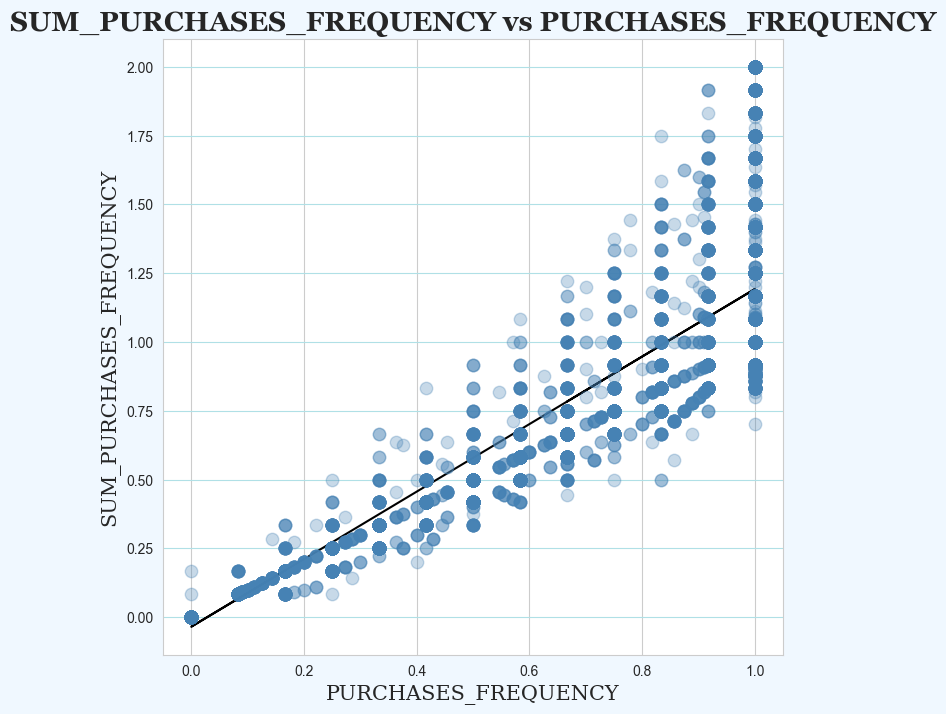

In [54]:
# Summing up 'ONEOFF_PURCHASES_FREQUENCY' and 'PURCHASES_INSTALLMENTS_FREQUENCY' features
df_eda['SUM_PURCHASES_FREQUENCY'] = df_eda['ONEOFF_PURCHASES_FREQUENCY'] + df_eda['PURCHASES_INSTALLMENTS_FREQUENCY']

# Getting correlation matrix
corr_matrix = df_eda[['PURCHASES_FREQUENCY', 'SUM_PURCHASES_FREQUENCY']].corr()

# Plotting the scatter plot
plt.figure(figsize = (8, 8)).patch.set_facecolor('aliceblue')
plt.gca().grid(visible=True, color='powderblue', zorder=1, axis='y')
plt.title('SUM_PURCHASES_FREQUENCY vs PURCHASES_FREQUENCY', fontdict = {'family': 'georgia', 'weight': 'bold', 'size': 20})
plt.xlabel('PURCHASES_FREQUENCY', fontdict = {'family': 'serif', 'size': 15})
plt.ylabel('SUM_PURCHASES_FREQUENCY', fontdict = {'family': 'serif', 'size': 15})
plt.scatter(df_eda['PURCHASES_FREQUENCY'], df_eda['SUM_PURCHASES_FREQUENCY'], c = 'steelblue', zorder = 3, s = 80, alpha = 0.3)
m, b = np.polyfit(df_eda['PURCHASES_FREQUENCY'], df_eda['SUM_PURCHASES_FREQUENCY'], 1)
plt.plot(df_eda['PURCHASES_FREQUENCY'], m*df_eda['PURCHASES_FREQUENCY'] + b, color='black')
plt.show()

**Conclusion:**

It has shown that **PURCHASES_FREQUENCY** is derived from **ONEOFF_PURCHASES_FREQUENCY** and **PURCHASES_INSTALLMENTS_FREQUENCY**. Hence, **PURCHASES_FREQUENCY** can be dropped from the dataset.

# 4 Sampling Methods

Libraries used in this section:
1) **pandas** (For DataFrame manipulation)
2) **numpy** (For numerical operations)
3) **random** (For cluster sampling)
4) **sklearn** train_test_split (For stratified sampling)
5) **scipy.stats** ks_2samp (For Kolmogorov-Smirnov Test)

The following sampling methods are performed:
1) **Simple Random Sampling**
2) **Systematic Sampling**
3) **Stratified Sampling**
4) **Cluster Sampling**
5) **Reservoir Sampling**

The following statistical tests are performed to ensure the validity of the sampling methods:
1) **Kolmogorov-Smirnov Test (KS Test)**

In [55]:
# For DataFrame
import pandas as pd

# For sampling methods
import random
import numpy as np
from sklearn.model_selection import train_test_split

# For statistical tests
from scipy.stats import ks_2samp

## 4.1 Simple Random Sampling
This is the most basic and intuitive form of sampling. It is a method where each individual in the population has an equal chance of being selected. This method is suitable  when the dataset is not biased.

However, it requires a large sample approximating the population, which is not always available. It can also be unrepresentative when the population is not homogenous.

This **might be useful** for this dataset, but might be **not representative** enough as the number of records in the original dataset is 8950 rows only, which might not be large enough to represent the whole population.

**References:**
1) [Simple Random Sampling Definition, Advantages and Disadvantage](https://www.investopedia.com/ask/answers/042815/what-are-disadvantages-using-simple-random-sample-approximate-larger-population.asp)

In [56]:
# Reading preprocessed data
df_preprocesed = pd.read_csv(r'./preprocessed_data/preprocessed_imputed_knn_n3_outlier_retained.csv', index_col = 'CUST_ID')

# Defining sample size, checking if the sample size is larger than the dataset
n = min(3500, len(df_preprocesed))

# Simple random sampling, putting random_state for reproducibility
df_srs = df_preprocesed.sample(n = n, random_state = 42)

df_srs.to_csv(r'./sampled_data/sampled_srs_preprocessed_knn_n3.csv')

df_srs

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
CUST_ID,,,,,,,,,,,,,,,,,
C17875,16.834929,0.454545,15.00,15.00,0.00,209.025389,0.090909,0.090909,0.000000,0.090909,1,1,7500.0,430.213001,86.959785,0.000000,11
C16296,540.020858,1.000000,612.23,495.61,116.62,1708.923217,0.666667,0.166667,0.500000,0.333333,10,10,2000.0,1642.068707,419.956251,0.000000,12
C17219,119.237712,1.000000,342.74,0.00,342.74,0.000000,1.000000,0.000000,1.000000,0.000000,0,20,2000.0,327.166041,165.207233,0.000000,12
C13108,894.081947,1.000000,1901.71,1853.11,48.60,206.618780,0.666667,0.666667,0.416667,0.083333,1,33,1500.0,947.130141,220.745296,0.000000,12
C13576,1294.145453,1.000000,3059.10,1836.98,1222.12,0.000000,1.000000,0.416667,1.000000,0.000000,0,42,7000.0,5560.033502,497.637767,0.083333,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C14210,1539.422470,1.000000,0.00,0.00,0.00,1156.434609,0.000000,0.000000,0.000000,0.083333,4,0,3500.0,369.044340,475.102035,0.000000,12
C17858,21.870580,0.636364,405.00,255.00,150.00,0.000000,0.333333,0.083333,0.250000,0.000000,0,7,4000.0,414.423817,88.853589,0.000000,12
C12903,7.817753,0.272727,170.02,0.00,170.02,0.000000,0.500000,0.000000,0.500000,0.000000,0,6,2000.0,373.028410,73.301702,0.500000,12


## 4.2 Systematic Sampling
This method works by selecting every **k**th individual from the population, easier to implement than simple random sampling. This method eliminates clustered selection, from Simple Random Sampling, whereby samples chosen are exceptionally close to each other, which in Simple Random Sampling can be solved only by increasing the sample size.

However, it is not suitable when there is a pattern in the dataset, or when there is a periodic pattern present in the dataset.

This **might also be useful** for this dataset, but might be **not representative enough**, same as the problem mentioned Simple Random Sampling.

**References:**
1) [Systematic Sampling: Advantages and Disadvantages](https://www.investopedia.com/ask/answers/042415/what-are-advantages-and-disadvantages-using-systematic-sampling.asp)

In [57]:
# Computing the k for the given sample size
k = len(df_preprocesed) // n

# Systematic sampling, limiting to get the desired sample size
df_system = df_preprocesed.iloc[::k, :].head(n)

df_system

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
CUST_ID,,,,,,,,,,,,,,,,,
C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
C10007,627.260806,1.000000,7091.01,6402.63,688.38,0.000000,1.000000,1.000000,1.000000,0.000000,0,64,13500.0,6354.314328,198.065894,1.000000,12
C10009,1014.926473,1.000000,861.49,661.49,200.00,0.000000,0.333333,0.083333,0.250000,0.000000,0,5,7000.0,688.278568,311.963409,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C17181,177.602057,1.000000,2863.31,2407.53,455.78,832.203874,1.000000,0.583333,0.750000,0.416667,10,27,1500.0,3344.466066,203.049504,0.583333,12
C17183,2493.589343,1.000000,4655.55,3299.43,1356.12,0.000000,0.750000,0.500000,0.666667,0.000000,0,44,6500.0,1231.610235,832.178621,0.000000,12
C17185,916.627912,1.000000,155.96,0.00,155.96,0.000000,0.333333,0.000000,0.333333,0.000000,0,8,1200.0,717.212090,389.194590,0.000000,12


## 4.3 Stratified Sampling
This method works by first defining the strata, which are the subgroups of the population, then selecting the sample from each stratum. This method is useful when the whole dataset is heterogeneous, but each stratum itself in the dataset is homogenous. 

However, this method requires strong prior knowledge about the dataset is required to define the strata, otherwise biases (e.g. selection bias) may be introduced to the samples. 

This method is **not suitable** for this dataset as the 'stratifiable' columns is **not clearly observed and defined**. But for illustration purposes, **TENURE** is made the strata column.

**References:**
1) [How to use stratified random sampling to your advantage](https://www.qualtrics.com/en-au/experience-management/research/stratified-random-sampling/?rid=ip&prevsite=en&newsite=au&geo=MY&geomatch=au)

In [58]:
# Defining the strata column
strata_column = 'TENURE'

# Stratified sampling
_, df_stratified = train_test_split(df_preprocesed, test_size = n, stratify = df_preprocesed[strata_column], random_state=42)

df_stratified

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
CUST_ID,,,,,,,,,,,,,,,,,
C15563,2933.387442,0.727273,0.00,0.00,0.00,3317.250842,0.000000,0.000000,0.000000,0.250000,5,0,6500.0,9317.533927,929.334025,0.125000,12
C12893,2432.276042,1.000000,7156.11,5921.26,1234.85,1543.726862,0.833333,0.833333,0.666667,0.166667,3,198,9500.0,1914.832296,621.422606,0.083333,12
C16341,4183.825982,1.000000,490.61,45.65,444.96,178.950075,0.666667,0.083333,0.666667,0.333333,4,13,4500.0,1541.998312,2410.083966,0.000000,12
C12359,5355.922523,1.000000,2469.28,905.98,1563.30,5839.680075,0.916667,0.583333,0.833333,0.666667,27,33,8000.0,1226.857482,2016.382990,0.000000,12
C18783,221.810125,0.727273,0.00,0.00,0.00,903.684584,0.000000,0.000000,0.000000,0.166667,2,0,500.0,662.179022,168.620500,0.166667,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C13414,790.367002,1.000000,3663.31,2744.88,918.43,0.000000,1.000000,1.000000,0.833333,0.000000,0,70,5000.0,4232.922974,250.545557,0.000000,12
C16991,119.368715,0.909091,339.11,611.65,12.41,87.547315,0.416667,0.500000,0.083333,0.083333,2,5,6500.0,107.203529,187.367893,0.000000,12
C12846,179.882212,1.000000,828.00,0.00,828.00,0.000000,1.000000,0.000000,1.000000,0.000000,0,12,1000.0,649.951462,152.775223,0.300000,12


## 4.4 Cluster Sampling
This method works by dividing the population into clusters, then randomly selecting the clusters to sample from. This method is useful when the dataset is large. Homogeneity is present among clusters, but heterogeneity is present within clusters. However, this method is not suitable when the clusters are not homogenous, or when the clusters are not representative of the population.

This method is **not suitable** for this dataset, as the 'clusterable' column is **not clearly observed and defined**, and also it is **not suitable** for clustering machine learning tasks. But for illustration purposes, **TENURE** is made the cluster column.

**References:**
1) [Cluster Sampling](https://corporatefinanceinstitute.com/resources/data-science/cluster-sampling/)

In [59]:
# Defining the clustering column
cluster_column = 'TENURE'

# Cluster sampling, setting random seed for reproducibility
clusters = df_preprocesed.groupby(cluster_column)
np.random.seed(42)

# Getting the desired sample size
df_cluster = pd.DataFrame()
selected_clusters = set()
while len(df_cluster) < n:
    cluster = np.random.choice(list(clusters.groups.keys()), replace = False)
    selected_clusters.add(cluster)
    df_cluster = pd.concat([df_cluster, clusters.get_group(cluster)], axis = 0)

# Selecting the desired sample size
df_cluster = df_cluster.head(n)

df_cluster

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
CUST_ID,,,,,,,,,,,,,,,,,
C10170,114.593817,1.000000,469.98,0.00,469.98,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,367.109312,86.102479,0.500000,6
C10274,7755.698607,1.000000,8533.54,4072.76,4460.78,7540.307350,1.000000,0.500000,0.833333,0.500000,12,72,10000.0,4758.209146,7256.951816,0.000000,6
C10411,918.342234,1.000000,1221.53,1180.00,41.53,1078.788118,0.333333,0.166667,0.166667,0.166667,7,2,1200.0,1421.035206,106.039362,0.250000,6
C10471,9601.071318,1.000000,238.34,0.00,238.34,4809.119550,0.833333,0.000000,0.833333,1.000000,8,5,15000.0,1194.510762,1206.257247,0.000000,6
C10567,76.935610,0.833333,277.00,277.00,0.00,0.000000,0.333333,0.333333,0.000000,0.000000,0,2,8500.0,814.605178,109.433095,0.333333,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C10884,10131.000550,1.000000,0.00,0.00,0.00,3330.326162,0.000000,0.000000,0.000000,0.166667,5,0,14500.0,4056.944212,2592.311811,0.000000,12
C10885,4419.302940,1.000000,12551.95,10901.24,1650.71,14896.540510,1.000000,0.666667,1.000000,0.500000,19,122,17000.0,31698.419020,1448.585054,0.416667,12
C10886,2173.621597,1.000000,200.00,200.00,0.00,201.404735,0.083333,0.083333,0.000000,0.250000,4,1,8000.0,495.968187,502.765453,0.000000,12


## 4.5 Reservoir Sampling
This method works by selecting a sample from the population without replacement, basically much like Simple Random Sampling, but this method is generally used for large datasets, where Simple Random Sampling becomes inefficient. This method is useful when the dataset is large and the size of the dataset is unknown (like in event streaming). However, it might not be very suitable when the dataset is small, as it might not be representative enough.

This method **might be somehow useful** for this dataset, but might be **not representative** enough, same as the problem mentioned in Simple Random Sampling.

**References:**
1) [Reservoir sampling technique](https://medium.com/@choukibhanuprasad/reservoir-sampling-technique-71c9227d6743)

In [60]:
# Defining function for Reservoir sampling
def reservoir_sampling(iterator, n):
    reservoir = []
    for i, row in enumerate(iterator):
        if i < n:
            reservoir.append(row)
        else:
            j = random.randint(0, i)
            if j < n:
                reservoir[j] = row
    return reservoir

# Reservoir sampling
# row is a tuple of (INDEX, DATA)
df_reservoir = pd.DataFrame([row[1] for row in reservoir_sampling(df_preprocesed.iterrows(), n)])

# dtypes of some columns has changed, need to convert back
columns_int64 = ['CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'TENURE']
df_reservoir[columns_int64] = df_reservoir[columns_int64].astype('int64')

df_reservoir

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
C16311,3855.225836,1.000000,0.00,0.00,0.00,1837.620008,0.000000,0.000000,0.0,0.416667,5,0,7500.0,977.203331,875.725207,0.000000,12
C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.0,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
C18375,184.576660,1.000000,408.36,0.00,408.36,0.000000,1.000000,0.000000,1.0,0.000000,0,12,1000.0,294.885863,239.735650,0.000000,12
C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.0,0.083333,1,1,7500.0,0.000000,448.208854,0.000000,12
C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.0,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C13593,4315.123399,1.000000,3927.58,2238.34,1689.24,0.000000,1.000000,0.416667,1.0,0.000000,0,21,11000.0,1518.432988,1317.325470,0.000000,12
C13594,5998.431562,0.909091,0.00,0.00,0.00,7120.317519,0.000000,0.000000,0.0,0.083333,2,0,8500.0,1629.632001,1613.203482,0.000000,12
C16160,1776.088454,1.000000,117.00,117.00,0.00,139.117692,0.333333,0.333333,0.0,0.166667,2,4,9000.0,1160.657884,381.469040,0.000000,12
C15170,2.880247,0.181818,250.00,250.00,0.00,0.000000,0.083333,0.083333,0.0,0.000000,0,1,2000.0,1401.222628,159.142575,0.000000,12


## 4.6 Evaluation of Sampling Methods using Kolmogorov-Smirnov Test (KS Test)

The Kolmogorov-Smirnov test is used to compare the distribution of the original dataset and the sampled dataset. The null hypothesis is that the two distributions are the same. If the **p-value** is less than the significance level (0.05), then the null hypothesis is rejected, meaning that the two distributions are different, and we can conclude that the sample drawn using the sampling method is not representative of the original dataset.

\begin{align*}
H_{0} : P = P_{0},  H_{1} : P \neq P_{0}.
\end{align*}

**References:**
1) [How to Perform a Kolmogorov-Smirnov Test in Python](https://www.statology.org/kolmogorov-smirnov-test-python/)

In [61]:
# Dictionary to store all samples DataFrames
sampling_methods = {
    'Simple Random Sampling': df_srs,
    'Systematic Sampling': df_system,
    'Reservoir Sampling': df_reservoir
}

# Dictionary to store rejected column count
non_rejected_count = {}

# Iterating through column to conduct KS test
for method, dataframe in sampling_methods.items():
    count = 0

    for column in df_preprocesed.columns:
        ks_statistic, p_value = ks_2samp(df_preprocesed[column], dataframe[column])
        if p_value > 0.05:
            count += 1

    non_rejected_count[method] = count

# Creating DataFrame to show the result
df_ks_test = pd.DataFrame(non_rejected_count, index = ['Number of Columns Not Rejected']).T
df_ks_test = pd.concat([df_ks_test, pd.Series([len(df_preprocesed.columns)] * len(df_ks_test), name = 'Total Columns', index = df_ks_test.index)], axis = 1)
df_ks_test['Percentage of Columns Not Rejected (%)'] = round(df_ks_test['Number of Columns Not Rejected'] / df_ks_test['Total Columns'] * 100, 2)

df_ks_test

,Number of Columns Not Rejected,Total Columns,Percentage of Columns Not Rejected (%)
Simple Random Sampling,17,17,100.00
Systematic Sampling,7,17,41.18
Reservoir Sampling,17,17,100.00


**Conclusion:**

The number of columns not rejected for the Kolmogorov-Smirnov test (KS Test) is highest for **Simple Random Sampling** and **Reservoir Sampling**, followed by **Systematic Sampling**.

However, Simple Random Sampling is more preferable, please refer to justification made above.

Hence, **Simple Random Sampling** is **chosen** to sample the dataset.

# 5 Feature Scaling
Libraries used in this section:
1) **pandas** (For DataFrame manipulation)
2) **sklearn.preprocessing** scalers (StandardScaler, MinMaxScaler)
3) **pickle** (For serialisation and de-serialisation)

The following sampling methods are performed:
1) **Standard Scaling**
2) **Min-Max Scaling**

In [62]:
# For DataFrame
import pandas as pd

# For feature scaling
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# For serialisation and de-serialisation
import pickle

## 5.1 Standard Scaling
This method works by transforming the data in such a manner that it has a mean of 0 and a standard deviation of 1. 

This method is useful when the data has outliers, as it is **less sensitive to outliers**.

\begin{equation}
x_{scaled} = \frac{x - \mu}{\sigma}
\end{equation}

**References:**
1) [Feature Scaling: Engineering, Normalization, and Standardization (Updated 2024)](https://www.analyticsvidhya.com/blog/2020/04/feature-scaling-machine-learning-normalization-standardization/)


In [63]:
# Loading sampled datasets
df_srs = pd.read_csv(r'./sampled_data/sampled_srs_preprocessed_knn_n3.csv', index_col = 'CUST_ID')

# Dropping derived columns
df_srs = df_srs.drop(['PURCHASES', 'PURCHASES_FREQUENCY'], axis = 1)

# Initialising StandardScaler
standard_scaler = StandardScaler()

# Transforming the datasets
df_std_scaled = pd.DataFrame(standard_scaler.fit_transform(df_srs), index = df_srs.index, columns = df_srs.columns)

# Saving the scaled datasets
df_std_scaled.to_csv(r'./scaled_data/knn3_standard_scaled.csv')

# Saving the scalers
with open(r'./scalers/knn3_standard_scaler.pkl', 'wb') as file:
    pickle.dump(standard_scaler, file)

## 5.2 Min-Max Scaling
Min-Max Scaling is a normalization technique that transforms features to a fixed range, typically [0, 1]. This scaling method is useful when the data does not follow a Gaussian distribution and when the features have different units or scales. 

The equation for Min-Max Scaling is given by:
\begin{align*}
X_{\text{scaled}} = X_{\text{min}}^{\text{new}} + \frac{(X - X_{\text{min}})}{X_{\text{max}} - X_{\text{min}}} \times \left( X_{\text{max}}^{\text{new}} - X_{\text{min}}^{\text{new}} \right)
\end{align*}

**References:**
1) [All About Min-max scaling](https://medium.com/@poojaviveksingh/all-about-min-max-scaling-c7da4e0044c5)
2) [MinMaxScaler](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.MinMaxScaler.html)

In [64]:
# Initialising MinMaxScaler
minmax_scaler = MinMaxScaler(feature_range = (0, 1))

# Transforming the datasets
df_minmax_scaled = pd.DataFrame(minmax_scaler.fit_transform(df_srs), index = df_srs.index, columns = df_srs.columns)

# Saving the scaled datasets
df_minmax_scaled.to_csv(r'./scaled_data/knn3_minmax_scaled.csv')

# Saving the scalers
with open(r'./scalers/knn3_minmax_scaler.pkl', 'wb') as file:
    pickle.dump(minmax_scaler, file)

**Conclusion:**

Since the dataset contains outliers, **Standard Scaling** is **more preferable** than **Min-Max Scaling**.

Hence, **Standard Scaling** is **chosen** to scale the dataset. 

# 6 Dimensionality Reduction
Libraries used in this section:
1) **pandas** (For DataFrame manipulation)
2) **numpy** (For numerical operations)
3) **matplotlib.pyplot** (For plotting)
4) **seaborn** (For plotting)
5) **sklearn.manifold** PCA (For Principal Component Analysis)
6) **sklearn.decomposition** TSNE (For t-Distributed Stochastic Neighbor Embedding)
7) **umap** (For Uniform Manifold Approximation and Projection)

The following dimensionality reduction methods are performed as follows:
1. **Principal Component Analysis (PCA)**
2. **t-Stochastic Neighbouring Embedding (t-SNE)**
3. **Uniform Manifold Approximation and Projection (UMAP)**

In [65]:
# For DataFrame
import pandas as pd
import numpy as np

# For plotting
import matplotlib.pyplot as plt
import seaborn as sns

# For dimensionality reduction
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import umap

## 6.1 Principal Component Analysis (PCA)
Principal Component Analysis (PCA) is a statistical procedure that uses an orthogonal transformation that converts a set of correlated variables to a set of uncorrelated variables. It is a **linear dimensionality reduction** technique that reduces the features in the original dataset to a number of eigenvectors (principal components) that is less than or equal to the number of features in the original dataset.

Each principal component is a **linear combination of the original features**, and the principal components are **orthogonal** to each other. The first principal component explains the most variance in the data, and each subsequent principal component explains the most variance given that it is orthogonal to the previous principal components.

The steps for PCA are summarised as follows:

Firstly, the data is **centred** by subtracting the mean of each feature from the dataset (or **standardized** but not necessary). 
\begin{align*}
\mathbf{Z} = \frac{\mathbf{X} - \mathbf{\mu}}{\mathbf{\sigma}}
\end{align*}

Then, the **covariance matrix**, $\mathbf{\Sigma}$ of the centred data is computed. The covariance matrix is a square matrix that gives the covariance between each pair of features in the dataset, as shown below

\begin{align*}
\mathbf{\Sigma} = \frac{1}{n-1} \mathbf{Z}^T \mathbf{Z}
\end{align*}

Thirdly, the **eigenvectors**, $\mathbf{V}$ and **eigenvalues**, $\mathbf{\Lambda}$ of the covariance matrix are computed. The **eigenvectors are the principal components**, and the **eigenvalues are the amount of variance explained by each principal component**.

\begin{align*}
\mathbf{\Sigma} \mathbf{V} = \mathbf{V} \mathbf{\Lambda}
\end{align*}

Lastly, the reduced dataset is obtained by selecting the top **k** eigenvectors that explain the most variance in the dataset.

\begin{align*}
\mathbf{Y} = \mathbf{Z} \mathbf{V}_k
\end{align*}

**References:**
1) [Principal Component Analysis(PCA)](https://www.geeksforgeeks.org/principal-component-analysis-pca/)
2) [Understanding Principal Component Analysis (PCA)](https://medium.com/@roshmitadey/understanding-principal-component-analysis-pca-d4bb40e12d33)

In [66]:
# Loading the scaled dataset
df_std_scaled = pd.read_csv(r'./scaled_data/knn3_standard_scaled.csv', index_col = 'CUST_ID')

# Initialising PCA
pca = PCA(random_state = 42)

# Transforming the dataset
pca_data = pca.fit_transform(df_std_scaled)

# Creating the DataFrame for PCA data
df_pca = pd.DataFrame(pca_data, index = df_std_scaled.index, columns = [f'PC{i+1}' for i in range(pca_data.shape[1])])

# Saving the PCA dataset
df_pca.to_csv(r'./dimension_reduced_data/knn3_pca.csv')

### Visualising Explained Variance for Principal Components
The following plots show the **Explained Variance** and **Cumulative Explained Variance** for each Principal Component.

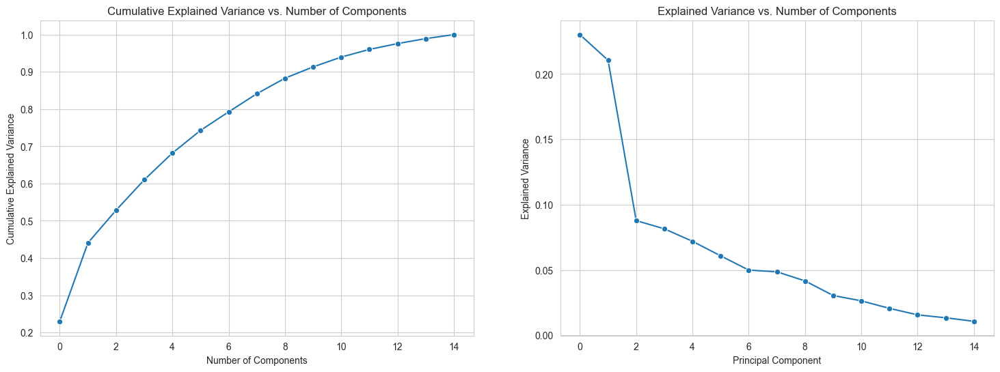

In [67]:
# Creating DataFrame for Explained Variance
df_explained_variance = pd.DataFrame({
    'Component': [i for i in range(pca_data.shape[1])],
    'Explained Variance': pca.explained_variance_ratio_,
    'Cumulative Explained Variance': np.cumsum(pca.explained_variance_ratio_)
})

# Creating subplots
fig, axes = plt.subplots(1, 2, figsize = (18, 6))

# Plotting subplot for Cumulative Explained Variance
sns.lineplot(x = 'Component', y = 'Cumulative Explained Variance', data = df_explained_variance, marker = 'o', ax = axes[0])
axes[0].set_title('Cumulative Explained Variance vs. Number of Components')
axes[0].set_xlabel('Number of Components')
axes[0].set_ylabel('Cumulative Explained Variance')

# Plotting subplot for Explained Variance
sns.lineplot(x = 'Component', y = 'Explained Variance', data = df_explained_variance, marker = 'o', ax = axes[1])
axes[1].set_title('Explained Variance vs. Number of Components')
axes[1].set_xlabel('Principal Component')
axes[1].set_ylabel('Explained Variance')

plt.show()

## 6.2 t-Stochastic Neighbouring Embedding (t-SNE)
t-Stochastic Neighbouring Embedding (t-SNE) is a **non-linear dimensionality reduction** technique that is particularly well-suited for embedding high-dimensional data into a space of two or three dimensions. Details of t-SNE are explained in the previous section.

**More details:**
[3.4.1 t-Distributed Stochastic Neighbor Embedding (t-SNE)](#3.4.1-t-distributed-stochastic-neighbor-embedding-tsne)

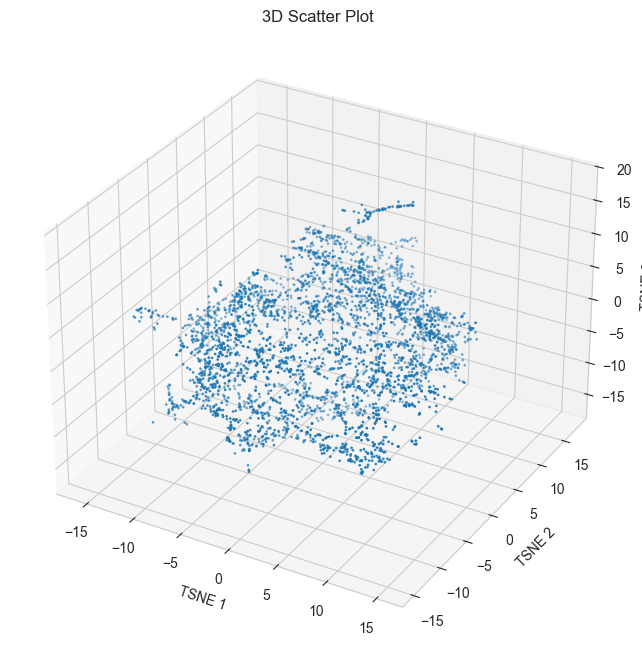

In [68]:
# Perform t-SNE with 3 components
# Random state is set to 42 for reproducibility
tsne = TSNE(n_components = 3, random_state = 42)
tsne_results = tsne.fit_transform(df_std_scaled)

# Create a DataFrame with t-SNE results
df_tsne = pd.DataFrame(tsne_results, index = df_std_scaled.index, columns = ['TSNE1', 'TSNE2', 'TSNE3'])

# Plotting scatter plot using Seaborn
fig = plt.figure(figsize = (18, 8))
ax = fig.add_subplot(111, projection = '3d')

sc = ax.scatter(xs = df_tsne['TSNE1'], ys = df_tsne['TSNE2'], zs = df_tsne['TSNE3'], s = 1)

# Set labels
ax.set_title('3D Scatter Plot')
ax.set_xlabel('TSNE 1')
ax.set_ylabel('TSNE 2')
ax.set_zlabel('TSNE 3')

# Saving the t-SNE dataset
df_tsne.to_csv(r'./dimension_reduced_data/knn3_tsne3.csv')

## 6.3 Uniform Manifold Approximation and Projection (UMAP)
Uniform Manifold Approximation and Projection (UMAP) is a **non-linear dimensionality reduction** technique that is particularly effective for visualizing high-dimensional data in a lower-dimensional space (typically 2D or 3D). UMAP is similar in purpose to t-SNE but also tends to preserve more of the global structure of the data while also being computationally more efficient.

The workings of UMAP are summarised as follows:
Firstly, a high-dimensional graph is constructed, where each data point is considered a node in the graph. Edges are drawn between nodes based on their similarity in the high-dimensional space. The similarity between points $x_i$ and $x_j$ is defined using a probability function:

\begin{align*}
p_{ij} = \exp\left(-\frac{\|x_i - x_j\|^2 - \rho_i}{\sigma_i}\right)
\end{align*}

where $\|x_i - x_j\|^2$ is usually the Euclidean distance between the points, $\rho_i$ is the distance from point $x_i$ to its nearest neighbour, and $\sigma_i$ is the scale of the Gaussian distribution. The probability function is then normalised to get the probability that $x_i$ would pick $x_j$ as its neighbour if neighbours were picked in proportion to their probability density under a Gaussian centered at $x_i$.

Then, a low-dimensional graph is constructed, where the goal is to preserve the structure of the high-dimensional graph in the low-dimensional space. The probability in the low-dimensional space is defined as:

\begin{align*}
q_{ij} = \frac{1}{1 + a\|y_i - y_j\|^{2b}}
\end{align*}

where $y_i$ and $y_j$ are the low-dimensional representations of points $x_i$ and $x_j$, and $a$ and $b$ are hyperparameters controlling the tightness of the embedding. The goal is to make the low-dimensional graph as similar as possible to the high-dimensional graph.
    
This is done by minimizing the cross-entropy between the two graphs, typically achieved using gradient descent algorithms.

\begin{align*}
\text{loss} = \sum_{i \neq j} p_{ij} \log \left(\frac{p_{ij}}{q_{ij}}\right) + (1 - p_{ij}) \log \left(\frac{1 - p_{ij}}{1 - q_{ij}}\right)
\end{align*}

Lastly, the data points are projected into the low-dimensional space, where the data points are now clustered in the low-dimensional space based on their similarity in the high-dimensional space.

**References:**
1) [UMAP: Uniform Manifold Approximation and Projection for Dimension Reduction](https://umap-learn.readthedocs.io/en/latest/)
2) [UMAP: An alternative dimensionality reduction technique](https://medium.com/mcd-unison/umap-an-alternative-dimensionality-reduction-technique-7a5e77e80982)
3) [How UMAP Works](https://umap-learn.readthedocs.io/en/latest/how_umap_works.html)
4) [Understanding UMAP (Uniform Manifold Approximation and Projection)](https://medium.com/@aeonaten/understanding-umap-uniform-manifold-approximation-and-projection-cede51c477d9)

C:\Users\hp\Downloads\Machine Learning Assignment\ml-venv\Lib\site-packages\umap\umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


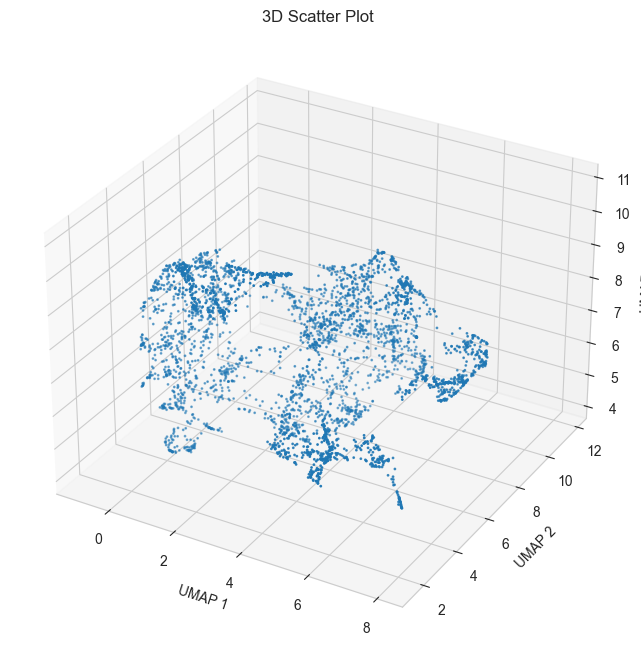

In [69]:
# Perform UMAP with 3 components
umap_model = umap.UMAP(random_state = 42, n_components = 3)
umap_results = umap_model.fit_transform(df_std_scaled)

# Create a DataFrame with UMAP results
df_umap = pd.DataFrame(umap_results, index = df_std_scaled.index, columns = ['UMAP1', 'UMAP2', 'UMAP3'])

# Plotting scatter plot using Seaborn
fig = plt.figure(figsize=(18, 8))
ax = fig.add_subplot(111, projection='3d')

sc = ax.scatter(xs = df_umap['UMAP1'], ys = df_umap['UMAP2'], zs = df_umap['UMAP3'], s = 1)

# Set labels
ax.set_title('3D Scatter Plot')
ax.set_xlabel('UMAP 1')
ax.set_ylabel('UMAP 2')
ax.set_zlabel('UMAP 3')

# Saving the UMAP dataset
df_umap.to_csv(r'./dimension_reduced_data/knn3_umap3.csv')

# 7 Model Training
Libraries used in this section:
1) **pandas** (For DataFrame manipulation)
2) **numpy** (For numerical operations)
3) **matplotlib.pyplot** (For plotting)
4) **seaborn** (For plotting)
5) **scipy.cluster.hierarchy** dendrogram (For plotting dendrogram)
6) **sklearn.cluster** (AgglomerativeClustering, Birch, MeanShift, HDBSCAN, OPTICS)
7) **sklearn.metrics** silhouette_score, davies_bouldin_score, calinski_harabasz_score (For model evaluation)
8) **pickle** (For serialisation and de-serialisation)

The following clustering algorithms are used:
1) **Agglomerative Clustering**
2) **Mean Shift**
3) **Balance Iterative Reducing and Clustering using Hierarchies (BIRCH)**
4) **Hierarchical Density-Based Spatial Clustering of Applications with Noise (HDBSCAN)**
5) **Ordering Points to Identify the Clustering Structure (OPTICS)**

The following techniques are used to evaluate the clustering results:
1) **Silhouette Score**
2) **Davies-Bouldin Index**
3) **Calinski-Harabasz Index**

## Silhouette Score
This metric is measured by calculating the similarity of each data points within the cluster and the dissimilarity of the data points in other clusters.

\begin{align*}
s(i) = \frac{b(i) - a(i)}{\max(a(i), b(i))}
\end{align*}

where $a(i)$ is the average distance of point $i$ to all other points in the same cluster and $b(i)$ is the average distance of point $i$ to all other points in the nearest cluster.

**Interpretation**: It ranges from -1 (poor clustering) to +1 (perfect clustering). A score close to 1 suggests well-separated clusters.

## Davies-Bouldin Index
The score is defined as the average similarity measure of each cluster with its most similar cluster, where similarity is the ratio of within-cluster distances to between-cluster distances.

\begin{align*}
DB = \frac{1}{n} \sum_{i=1}^{n} \max_{i \neq j} \left( \frac{\sigma_i + \sigma_j}{d_{ij}} \right)
\end{align*}

where $\sigma_i$ is the average distance of all the points in cluster $i$ to the centroid of the cluster, $d_{ij}$ is the distance between the centroids of cluster $i$ and $j$.

**Interpretation**: The minimum value of the Davies-Bouldin index is zero, which indicates the best clustering.

## Calinski-Harabasz Index
The score is the ratio of the sum of between-clusters dispersion and of inter-cluster dispersion for all clusters.

\begin{align*}
CH = \frac{\text{Tr}(B_k)}{\text{Tr}(W_k)} \cdot \frac{n - k}{k - 1}
\end{align*}

where $B_k$ is the between-cluster dispersion matrix, $W_k$ is the within-cluster dispersion matrix, $n$ is the number of samples, and $k$ is the number of clusters.

**Interpretation**: Higher score indicates better defined clusters.

**References:** 
1) [Clustering Metrics in Machine Learning](https://www.geeksforgeeks.org/clustering-metrics/)
2) [silhouette_score](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.silhouette_score.html)
3) [What is Silhouette Score?](https://medium.com/@hazallgultekin/what-is-silhouette-score-f428fb39bf9a) 
4) [davies_bouldin_score](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.davies_bouldin_score.html)
5) [Davies-Bouldin Index](https://www.geeksforgeeks.org/davies-bouldin-index/)
6) [How to measure clustering performances when there are no ground truth?](https://medium.com/@haataa/how-to-measure-clustering-performances-when-there-are-no-ground-truth-db027e9a871c)
7) [calinski_harabasz_score](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.calinski_harabasz_score.html)

In [70]:
# For DataFrame
import pandas as pd
import numpy as np

# For visualisation
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as mpatches

# For Agglomerative Clustering
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering

# For Mean Shift
from sklearn.cluster import MeanShift, estimate_bandwidth

# For Birch
from sklearn.cluster import Birch

# For HDBSCAN
from sklearn.cluster import HDBSCAN

# For OPTICS
from sklearn.cluster import OPTICS

# For model evaluation
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

# For serialisation and de-serialisation
import pickle

# Defining function for visualising the clusters in 3D
def visualise_clusters(df, cluster_labels, axis_name, s):
    # Plotting using Seaborn
    fig = plt.figure(figsize = (18, 8))
    ax = fig.add_subplot(111, projection = '3d')

    # Plotting using Seaborn
    sc = ax.scatter(xs = df.iloc[:, 0], ys = df.iloc[:, 1], zs = df.iloc[:, 2], c = cluster_labels, cmap = 'viridis', s = s)

    # Creating a legend
    plt.colorbar(sc).set_label('Cluster')

    # Adding the total number of clusters as a label
    ax.text2D(0.05, 0.95, f'Total Clusters: {len(np.unique(cluster_labels[cluster_labels != -1]))}', transform=ax.transAxes, fontsize=14, color='black')

    # Adding the total number of noise points as a label
    ax.text2D(0.05, 0.9, f'Noise Points: {np.sum(cluster_labels == -1)}', transform=ax.transAxes, fontsize=14, color='black')

    # Setting labels
    ax.set_title('3D Scatter Plot of Clusters')
    ax.set_xlabel(f'{axis_name} 1')
    ax.set_ylabel(f'{axis_name} 2')
    ax.set_zlabel(f'{axis_name} 3')
    plt.show()

# Defining function to visualise the differences in evaluation metric scores for different datasets
def visualise_scores(scores, model_name, metric_name, grid = False):
    plt.figure(figsize = (10, 6))
    plt.grid(grid)

    bars = plt.bar(scores.keys(), list(scores.values()), width=0.35, label = metric_name, color = ['firebrick', 'orange', 'lightblue', 'darkgreen'])

    # Annotate the scores
    for bar in bars:
        height = bar.get_height()
        plt.annotate(f'{height:.3f}',
                     xy=(bar.get_x() + bar.get_width() / 2, height),
                     xytext=(0, 3),
                     textcoords="offset points",
                     ha='center', va='bottom', fontsize=10)

    plt.xlabel('Datasets')
    plt.ylabel('Scores')
    plt.title(f'{model_name}: {metric_name}')
    plt.show()

# Defining function for plotting metrics in subplots
def plot_metrics(values, metrics, title):
    # Plotting the metrics in subplots
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # Iterate through the computed metrics
    for i, metric in enumerate(metrics):
        axes[i].plot(values, metrics[metric], label=metric, marker='o')

        # Setting labels
        axes[i].set_title(metric)
        axes[i].set_xlabel(title)
        axes[i].set_ylabel('Score')
    
    # Showing the plot
    plt.tight_layout()
    plt.show()

## 7.1 Agglomerative Clustering
Agglomerative Clustering is a **hierarchical clustering** technique that builds a hierarchy of clusters. Initially, each data point is considered a cluster. Then, the algorithm merges the closest clusters iteratively until only one cluster remains.

In [71]:
# Defining function for plotting dendrogram 
def plot_dendrogram(df, method = 'ward', cutoff_distance = None):
    linkage_matrix = sch.linkage(df, method = method)
    plt.figure(figsize=(12, 8))
    dendrogram = sch.dendrogram(linkage_matrix)
    
    plt.title(f'Dendrogram ({method.capitalize()} Linkage)')
    plt.xlabel('Samples')
    plt.ylabel('Euclidean distances')
    
    ax = plt.gca()
    ax.set_xticks(ax.get_xticks()[::500])  # Show every 500th label
    plt.xticks(rotation=45, fontsize=10)

    if cutoff_distance:
        plt.axhline(y=cutoff_distance, color='r', linestyle='--')
        plt.text(plt.xlim()[1], cutoff_distance, f'Cutoff: {cutoff_distance:.2f}',
                 va='center', ha='left', backgroundcolor='w')

    plt.show()

    if cutoff_distance:
        n_clusters = len(set(sch.fcluster(linkage_matrix, cutoff_distance, criterion='distance')))
        return n_clusters

### 7.1.1 Initial Model Fitting
The following datasets are used for clustering:
1) **Standard Scaled Dataset**
2) **PCA Dataset**
3) **t-SNE Dataset**
4) **UMAP Dataset**

The following initial hyperparameters are used to determine the best performing dataset:
1) **Linkage Method**: Ward Linkage
2) **Distance Measure**: Euclidean Distance
3) **Cutoff-Distance**: 35

Dendrograms for each dataset are also plotted.

#### Standard Scaled Dataset
The following will use the **Standard Scaled Dataset** to train the **Agglomerative Clustering Model**.

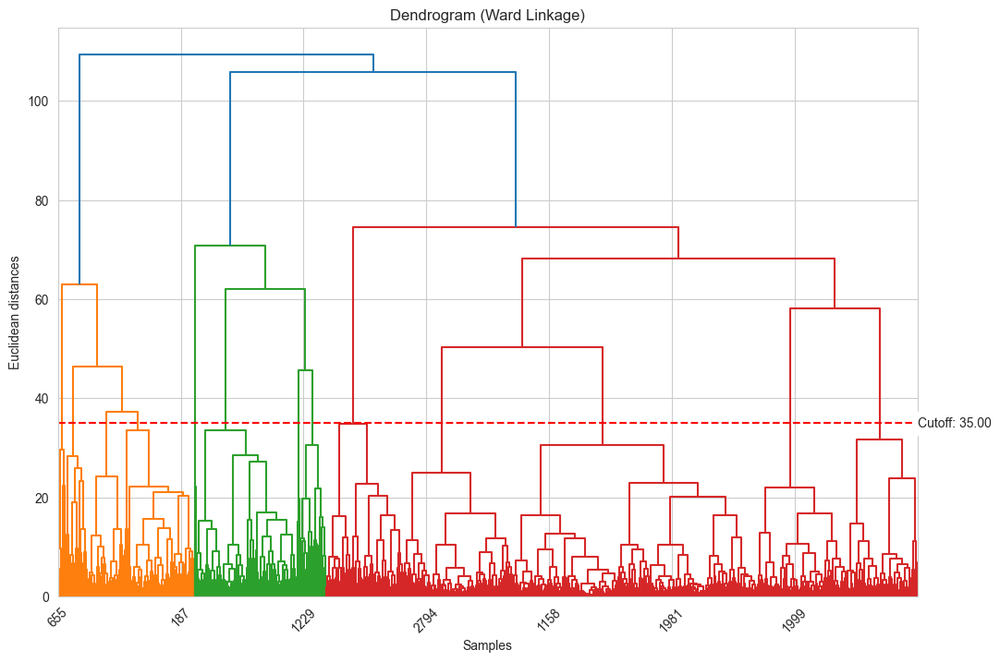

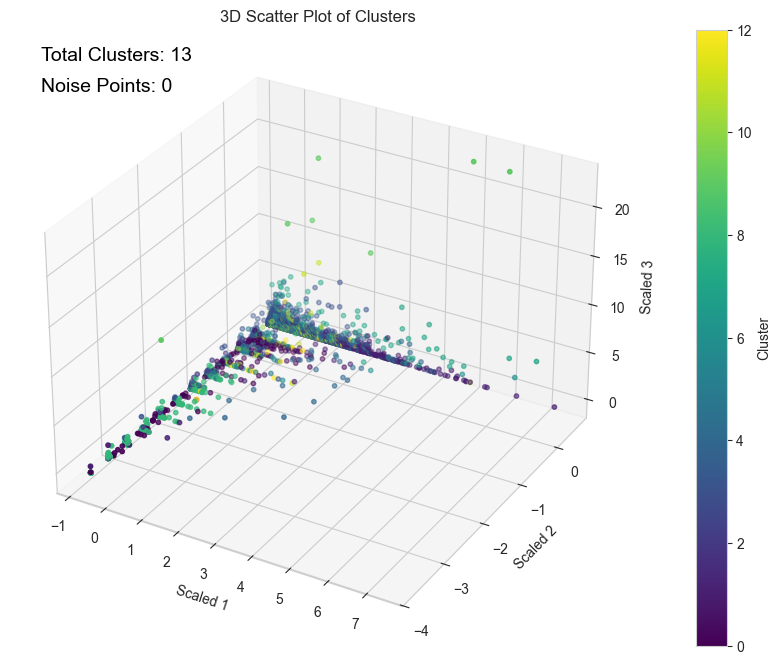

In [72]:
# Loading the dataset
df_scaled = pd.read_csv('./scaled_data/knn3_standard_scaled.csv', index_col='CUST_ID')

# Plot dendrogram with cutoff
cutoff_distance = 35  # Can adjust this value
n_clusters = plot_dendrogram(df_scaled, method = 'ward', cutoff_distance = cutoff_distance)

# Initial clustering
agglomerative_scaled = AgglomerativeClustering(n_clusters = n_clusters, metric = 'euclidean', linkage = 'ward').fit(df_scaled)

# Visualising clusters
visualise_clusters(df_scaled, agglomerative_scaled.labels_, 'Scaled', s = 5)

# Saving the model
with open(r'./models/agglomerative_scaled.pkl', 'wb') as file:
    pickle.dump(agglomerative_scaled, file)

#### PCA Dataset
The following will only use the **first 3 principal components**.

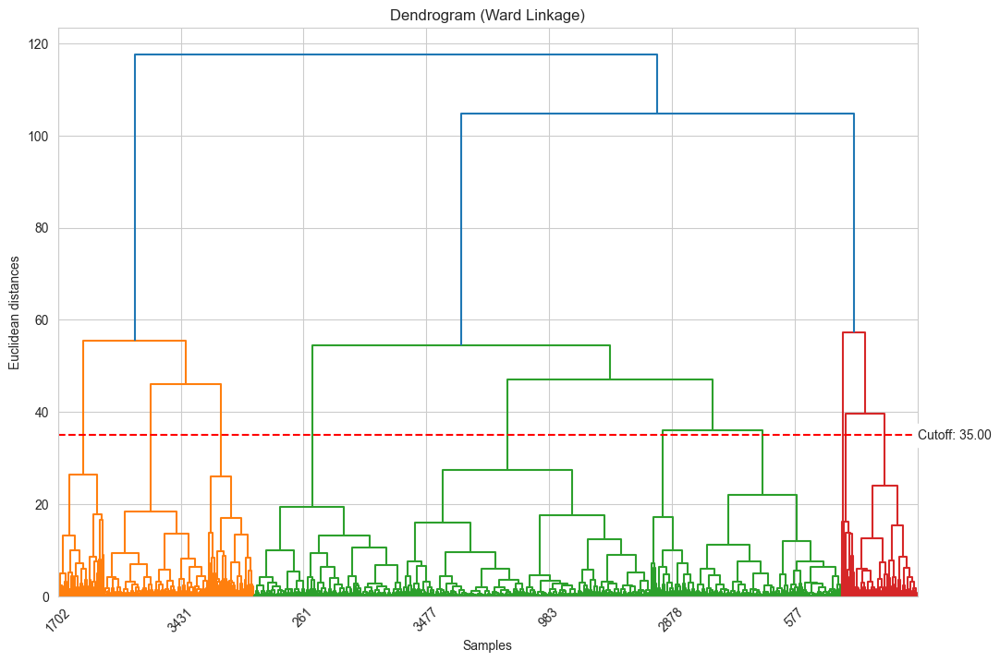

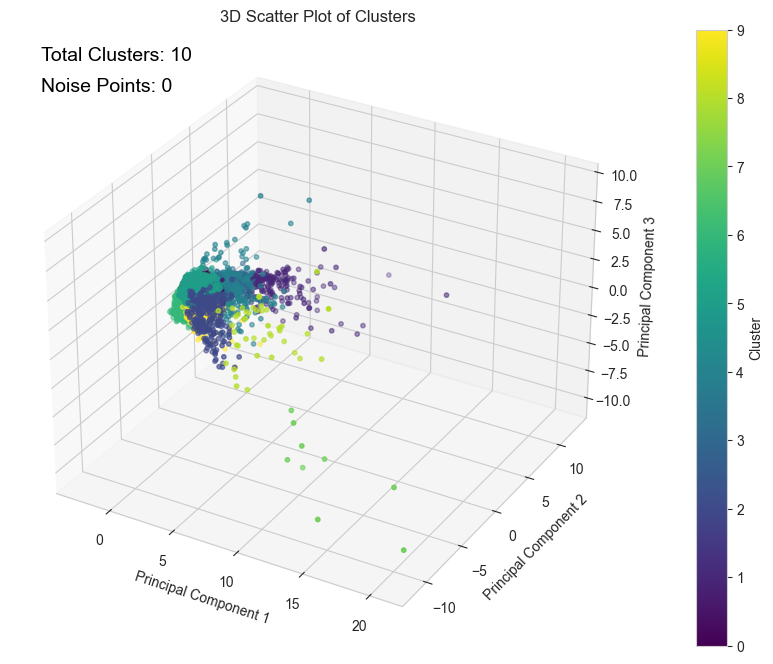

In [73]:
# Loading the dataset
df_pca = pd.read_csv('./dimension_reduced_data/knn3_pca.csv', index_col='CUST_ID')
df_pca = df_pca.iloc[:, :3]

# Plot dendrogram with cutoff
cutoff_distance = 35  # Can adjust this value
n_clusters = plot_dendrogram(df_pca, method = 'ward', cutoff_distance = cutoff_distance)

# Initial clustering
agglomerative_pca3 = AgglomerativeClustering(n_clusters = n_clusters, metric = 'euclidean', linkage = 'ward').fit(df_pca)

# Visualising clusters
visualise_clusters(df_pca, agglomerative_pca3.labels_, 'Principal Component', s = 5)

# Saving the model
with open(r'./models/agglomerative_pca3.pkl', 'wb') as file:
    pickle.dump(agglomerative_pca3, file)

#### t-SNE Dataset
The following will use **t-SNE with 3 components**.

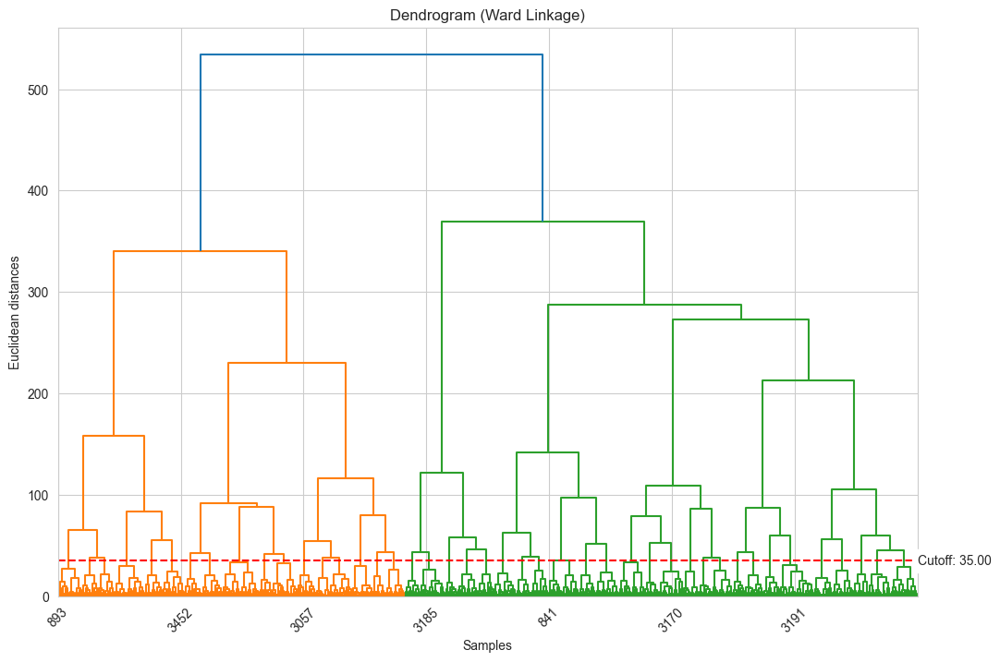

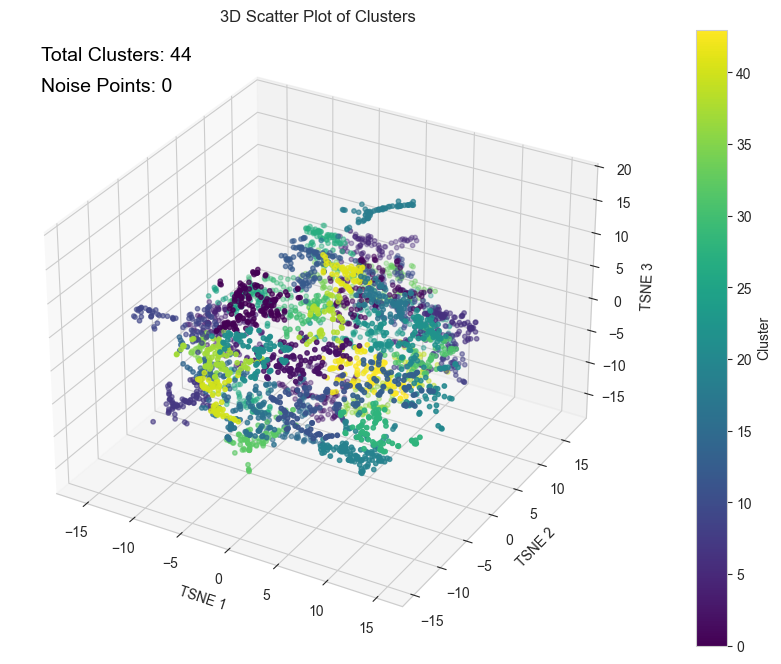

In [74]:
# Loading the dataset
df_tsne = pd.read_csv('./dimension_reduced_data/knn3_tsne3.csv', index_col='CUST_ID')

# Plot dendrogram with cutoff
cutoff_distance = 35  # Can adjust this value
n_clusters = plot_dendrogram(df_tsne, method = 'ward', cutoff_distance = cutoff_distance)

# Initial clustering
agglomerative_tsne3 = AgglomerativeClustering(n_clusters = n_clusters, metric = 'euclidean', linkage = 'ward').fit(df_tsne)

# Visualising clusters
visualise_clusters(df_tsne, agglomerative_tsne3.labels_, 'TSNE', s = 5)

# Saving the model
with open(r'./models/agglomerative_tsne3.pkl', 'wb') as file:
    pickle.dump(agglomerative_tsne3, file)

#### UMAP Dataset
The following will use **UMAP with 3 components**.

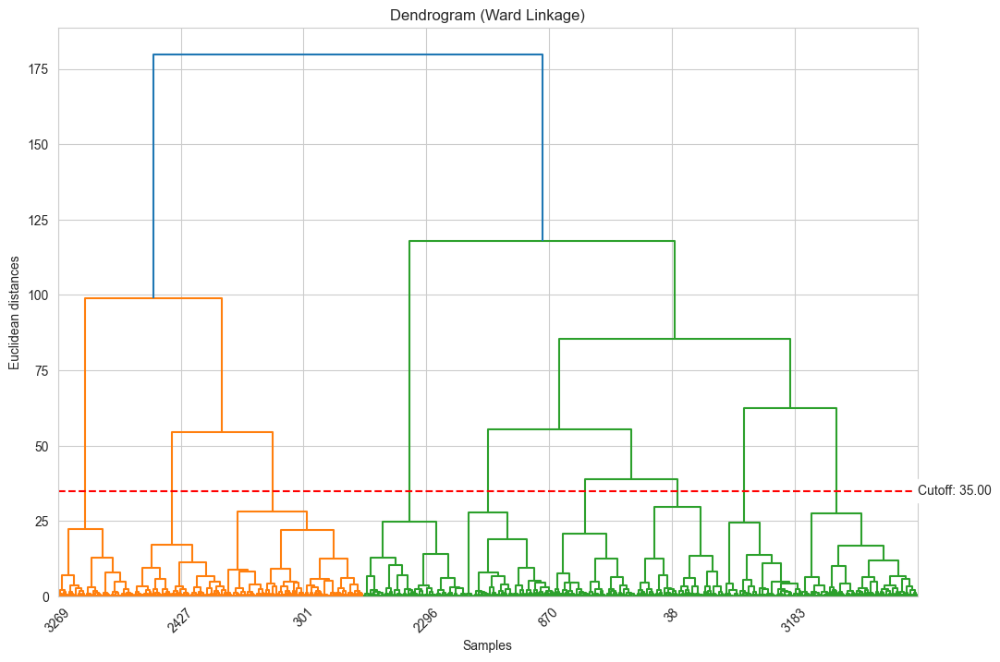

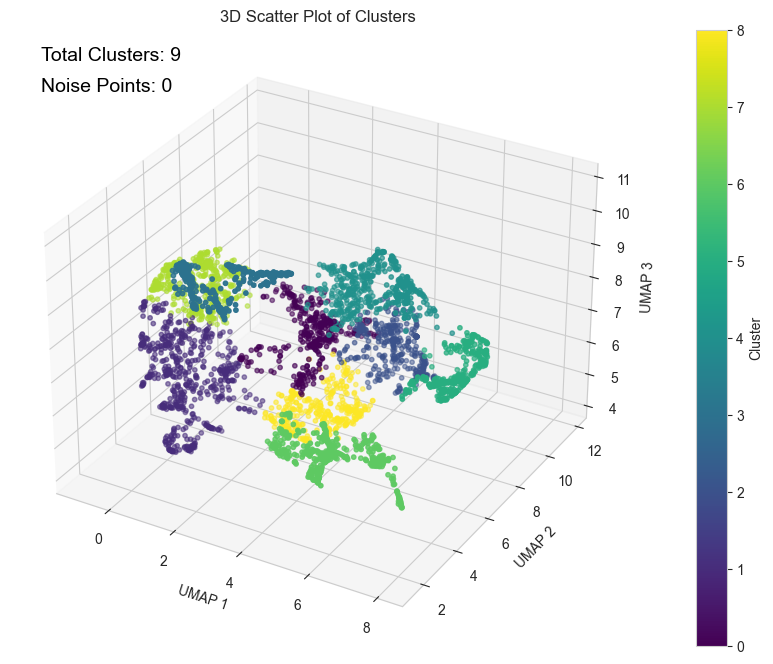

In [75]:
# Loading the dataset
df_umap = pd.read_csv('./dimension_reduced_data/knn3_umap3.csv', index_col='CUST_ID')

# Plot dendrogram with cutoff
cutoff_distance = 35  # Can adjust this value
n_clusters = plot_dendrogram(df_umap, method = 'ward', cutoff_distance = cutoff_distance)

# Initial clustering
agglomerative_umap3 = AgglomerativeClustering(n_clusters = n_clusters, metric = 'euclidean', linkage = 'ward').fit(df_umap)

# Visualising clusters
visualise_clusters(df_umap, agglomerative_umap3.labels_, 'UMAP', s = 5)

# Saving the model
with open(r'./models/agglomerative_umap3.pkl', 'wb') as file:
    pickle.dump(agglomerative_umap3, file)

### 7.1.2 Model Evaluation

#### Silhouette Score

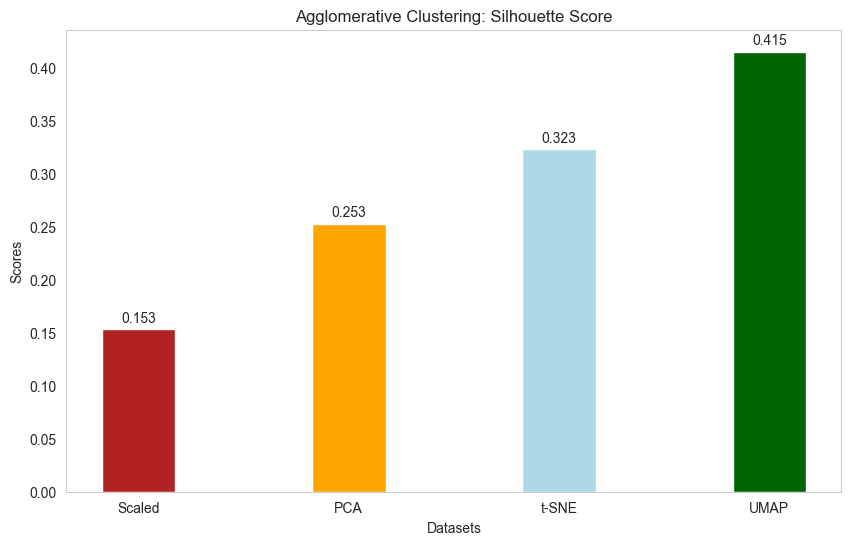

In [76]:
# Calculating the Silhouette Score
agglomerative_silhouette = {
    'Scaled': silhouette_score(df_scaled, agglomerative_scaled.labels_),
    'PCA': silhouette_score(df_pca, agglomerative_pca3.labels_),
    't-SNE': silhouette_score(df_tsne, agglomerative_tsne3.labels_),
    'UMAP': silhouette_score(df_umap, agglomerative_umap3.labels_)
}

# Visualising the differences in Silhouette Score
visualise_scores(agglomerative_silhouette, 'Agglomerative Clustering', 'Silhouette Score')

#### Davies-Bouldin Index

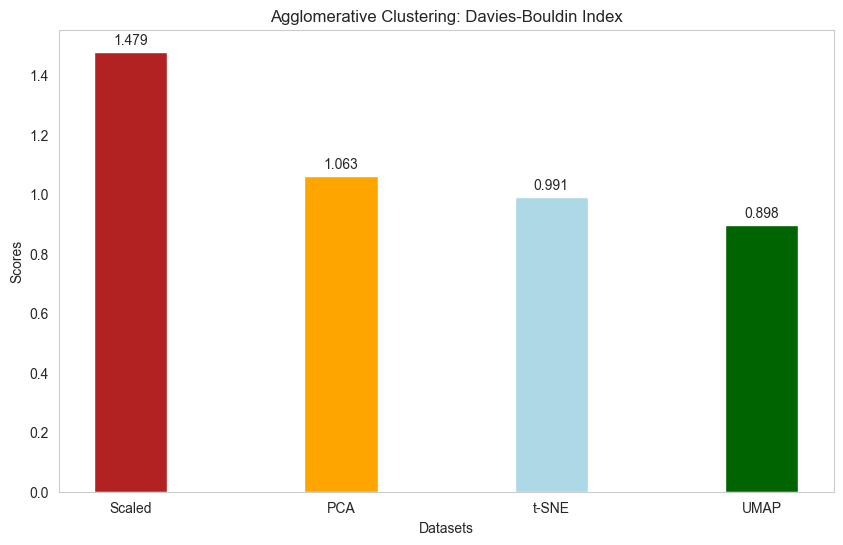

In [77]:
# Calculating the Davies-Bouldin Index
agglomerative_dbindex = {
    'Scaled': davies_bouldin_score(df_scaled, agglomerative_scaled.labels_),
    'PCA': davies_bouldin_score(df_pca, agglomerative_pca3.labels_),
    't-SNE': davies_bouldin_score(df_tsne, agglomerative_tsne3.labels_),
    'UMAP': davies_bouldin_score(df_umap, agglomerative_umap3.labels_)
}

# Visualising the differences in Davies-Bouldin Index
visualise_scores(agglomerative_dbindex, 'Agglomerative Clustering', 'Davies-Bouldin Index')

#### Calinski-Harabasz Index

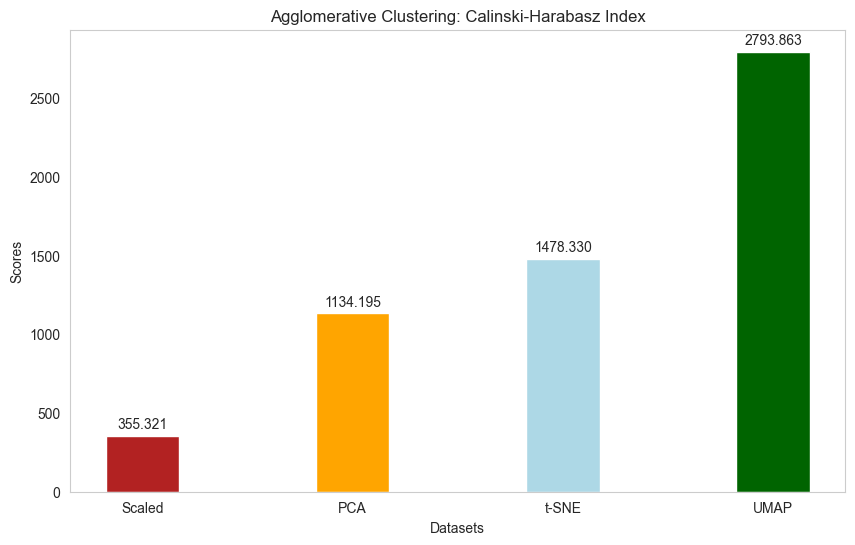

In [78]:
# Calculating the Calinski-Harabasz Index
agglomerative_chindex = {
    'Scaled': calinski_harabasz_score(df_scaled, agglomerative_scaled.labels_),
    'PCA': calinski_harabasz_score(df_pca, agglomerative_pca3.labels_),
    't-SNE': calinski_harabasz_score(df_tsne, agglomerative_tsne3.labels_),
    'UMAP': calinski_harabasz_score(df_umap, agglomerative_umap3.labels_)
}

# Visualising the differences in Calinski-Harabasz Index
visualise_scores(agglomerative_chindex, 'Agglomerative Clustering', 'Calinski-Harabasz Index')

**Conclusion:**

Since the performance of the **UMAP** dataset is the **best** in terms of **Silhouette Score** and **Calinski-Harabasz Index**, the **UMAP Dataset** is **chosen** for the **Agglomerative Clustering Model**.

### 7.1.3 Hyperparameter Tuning
The following hyperparameters will be fine-tuned:
1) **Number of Clusters**
2) **Linkage Method**

#### N-Clusters
The number of clusters used to fine-tune the model will be from **2 to 11** clusters.

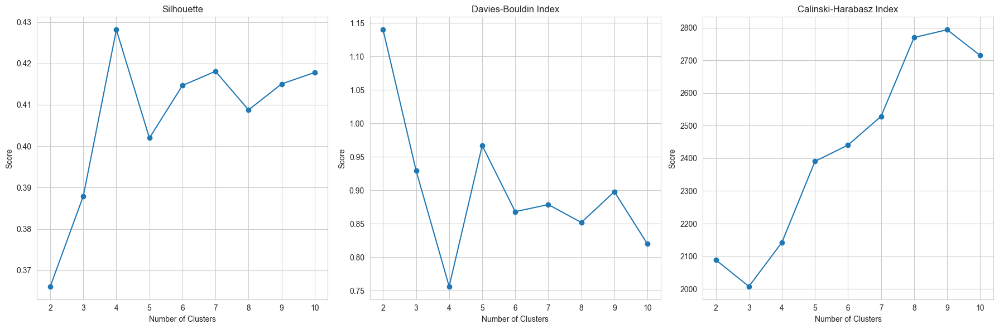

In [79]:
# Loading the best performing dataset for Agglomerative Clustering
df_agglomerative_best = df_umap

# Defining number of clusters for fine-tuning
n_clusters_range = range(2, 11)

# Dictionary for storing scores
agglomerative_ncluster_tuning = {
    'Silhouette': [],
    'Davies-Bouldin Index': [],
    'Calinski-Harabasz Index': []
}

for n_clusters in n_clusters_range:
    agglomerative_model = AgglomerativeClustering(n_clusters = n_clusters, metric = 'euclidean', linkage = 'ward').fit(df_agglomerative_best)

    with open(f'./models/agglomerative_umap3_ncluster{n_clusters}.pkl', 'wb') as file:
        pickle.dump(agglomerative_model, file)

    agglomerative_ncluster_tuning['Silhouette'].append(silhouette_score(df_agglomerative_best, agglomerative_model.labels_))
    agglomerative_ncluster_tuning['Davies-Bouldin Index'].append(davies_bouldin_score(df_agglomerative_best, agglomerative_model.labels_))
    agglomerative_ncluster_tuning['Calinski-Harabasz Index'].append(calinski_harabasz_score(df_agglomerative_best, agglomerative_model.labels_))

# Plotting the metrics in subplots
plot_metrics(values = n_clusters_range, metrics = agglomerative_ncluster_tuning, title = 'Number of Clusters')

#### Linkage Method
The following linkage methods will be used in fine-tuning the model:
1) **Ward Linkage**
2) **Complete Linkage**
3) **Average Linkage**
4) **Single Linkage**

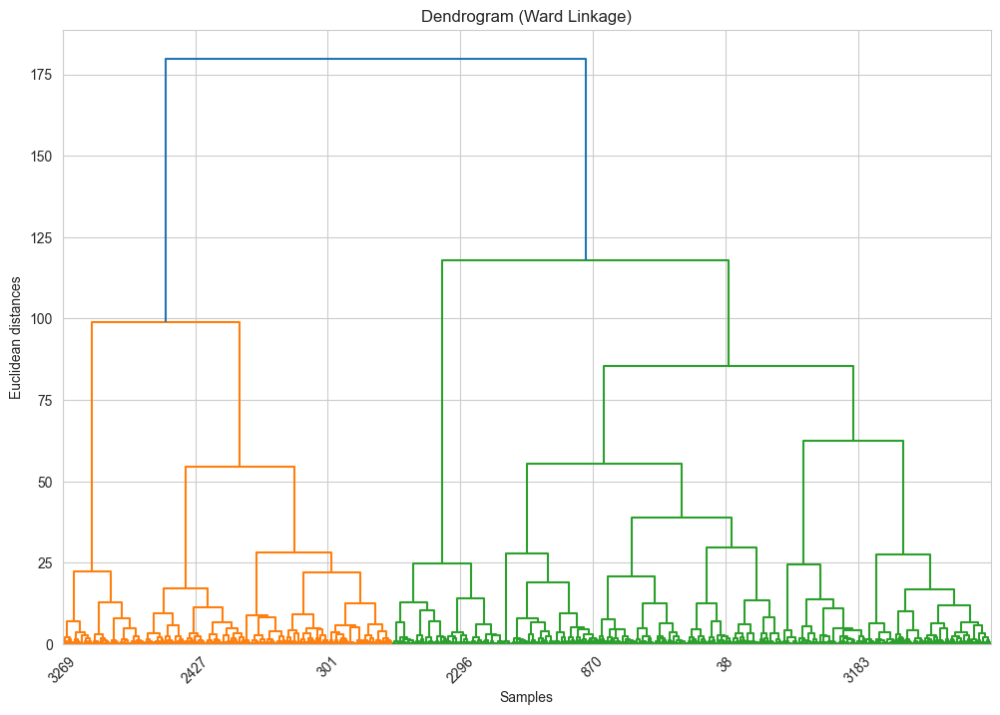

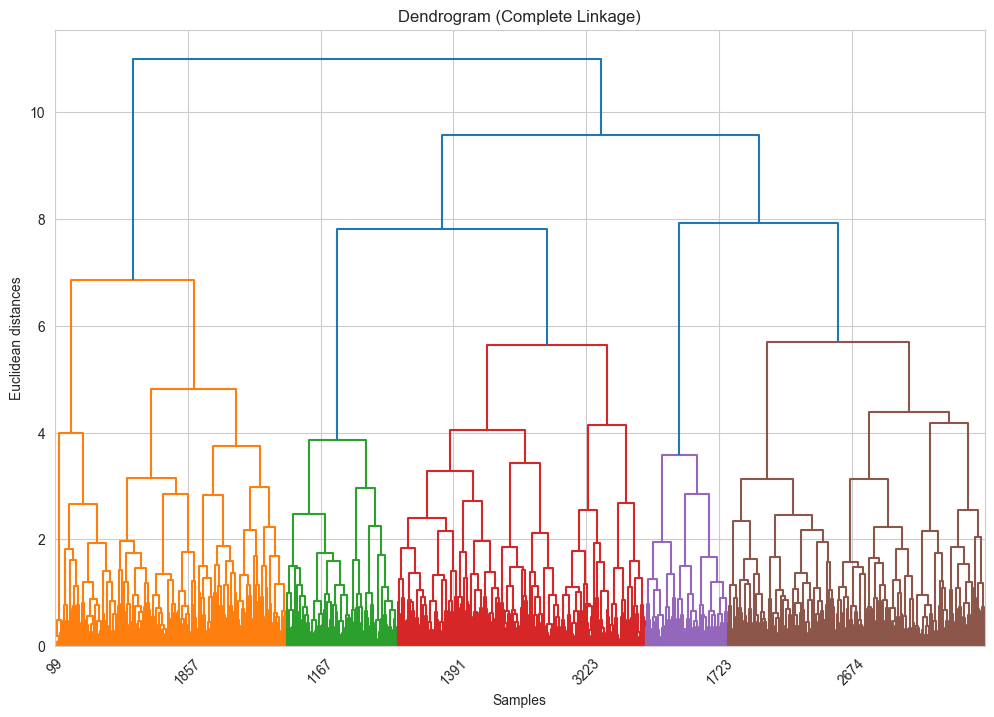

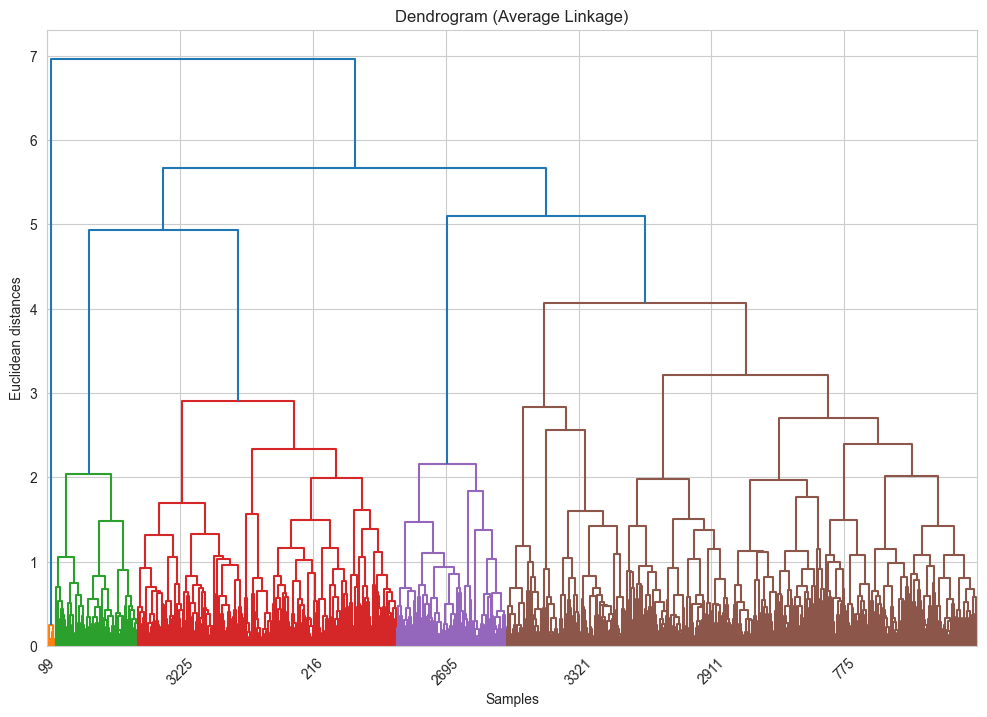

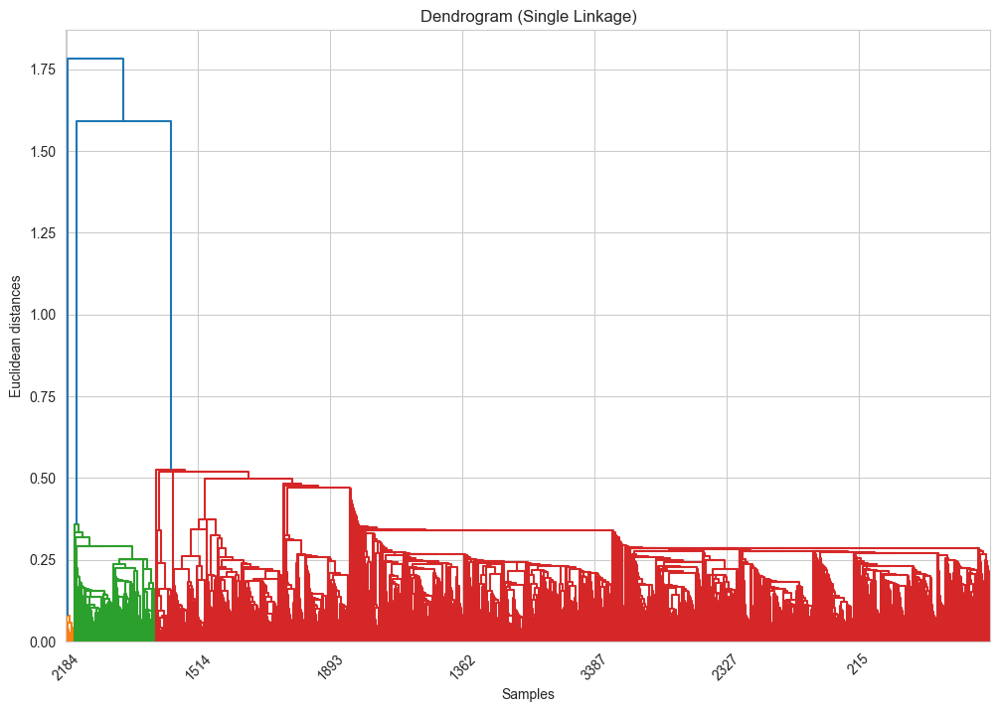

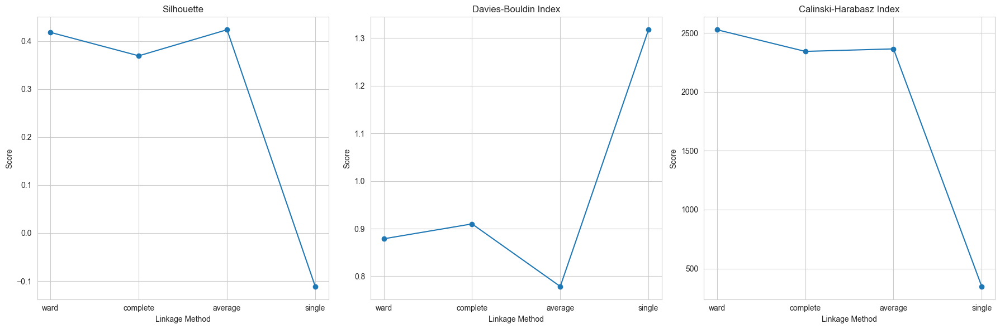

In [80]:
# Fine-tune linkage method
linkage_methods = ['ward', 'complete', 'average', 'single']

agglomerative_linkage_tuning = {
    'Silhouette': [],
    'Davies-Bouldin Index': [],
    'Calinski-Harabasz Index': []
}

for method in linkage_methods:
    agglomerative_model = AgglomerativeClustering(n_clusters = 7, metric = 'euclidean', linkage = method).fit(df_agglomerative_best)
    
    # Plot dendrogram for each linkage method
    plot_dendrogram(df_agglomerative_best, method = method)

    with open(f'./models/agglomerative_umap3_ncluster7_{method}.pkl', 'wb') as file:
        pickle.dump(agglomerative_model, file)

    agglomerative_linkage_tuning['Silhouette'].append(silhouette_score(df_agglomerative_best, agglomerative_model.labels_))
    agglomerative_linkage_tuning['Davies-Bouldin Index'].append(davies_bouldin_score(df_agglomerative_best, agglomerative_model.labels_))
    agglomerative_linkage_tuning['Calinski-Harabasz Index'].append(calinski_harabasz_score(df_agglomerative_best, agglomerative_model.labels_))

# Plotting the metrics in subplots
plot_metrics(values = linkage_methods, metrics = agglomerative_linkage_tuning, title = 'Linkage Method')

### 7.1.4 Best Model Fitting
The best model will be fitted using the following hyperparameters:
1) **Number of Clusters**: 7
2) **Linkage Method**: Ward Linkage

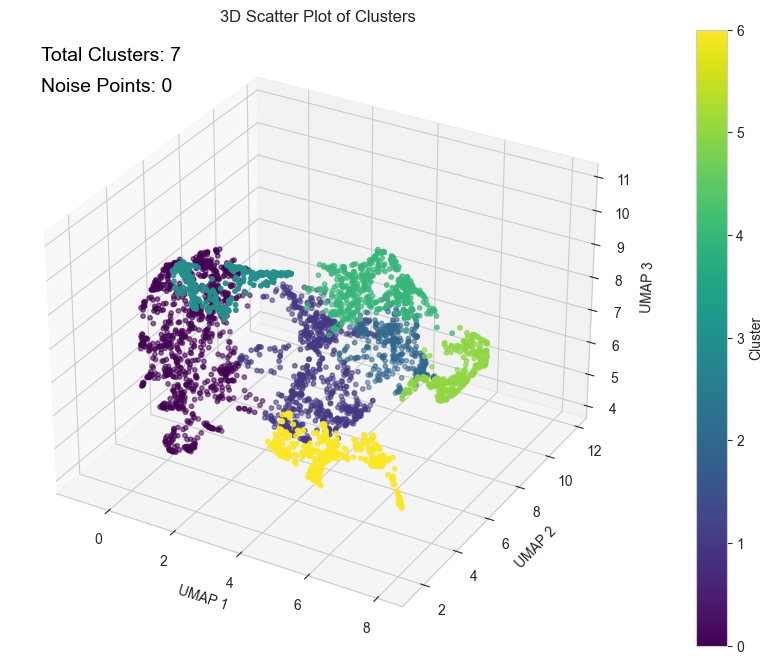

Silhouette Score: 0.4181073555035957
Davies-Bouldin Index: 0.8787646346734783
Calinski-Harabasz Index: 2528.7410127486137


In [81]:
best_agglomerative = AgglomerativeClustering(n_clusters = 7, metric = 'euclidean', linkage = 'ward').fit(df_umap)

# Visualising clusters
visualise_clusters(df_umap, best_agglomerative.labels_, 'UMAP', s = 5)

# Printing the best model's metrics
print(f'Silhouette Score: {silhouette_score(df_umap, best_agglomerative.labels_)}')
print(f'Davies-Bouldin Index: {davies_bouldin_score(df_umap, best_agglomerative.labels_)}')
print(f'Calinski-Harabasz Index: {calinski_harabasz_score(df_umap, best_agglomerative.labels_)}')

# Saving the model
with open('./models/best_agglomerative.pkl', 'wb') as file:
    pickle.dump(best_agglomerative, file)

## 7.2 Mean Shift
Mean shift is a **non-parametric clustering** technique that does not require the number of clusters to be specified beforehand. The algorithm works by iteratively shifting the data points towards the mode of the data distribution. The mode is determined by the kernel density estimate of the data points.

### 7.2.1 Initial Model Fitting
The following datasets are used for clustering:
1) **Standard Scaled Dataset**
2) **PCA Dataset**
3) **t-SNE Dataset**
4) **UMAP Dataset**

The following initial hyperparameters are used to determine the best performing dataset:
1) **Quantile**: 0.1

#### Standard Scaled Dataset
The following will use the **Standard Scaled Dataset** to train the **Mean Shift Model**.

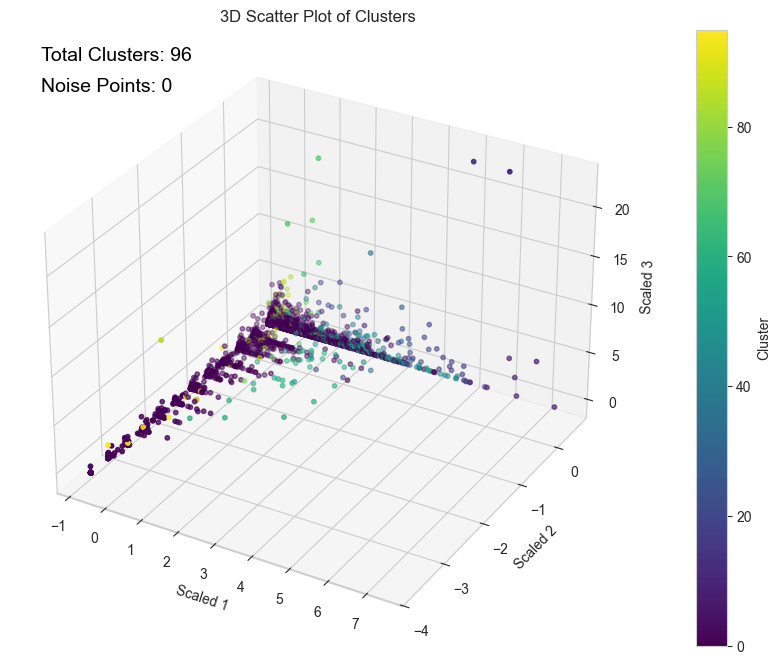

In [82]:
# Loading the dataset
df_scaled = pd.read_csv(r'./scaled_data/knn3_standard_scaled.csv', index_col = 'CUST_ID')

# Estimating the bandwidth
est_bandwidth = estimate_bandwidth(df_scaled, quantile = 0.1)

# Initial clustering
ms_scaled = MeanShift(bandwidth = est_bandwidth).fit(df_scaled)

# Visualising clusters
visualise_clusters(df_scaled, ms_scaled.labels_, 'Scaled', s = 5)

# Saving the model
with open('./models/ms_scaled.pkl', 'wb') as file:
    pickle.dump(ms_scaled, file)

#### PCA Dataset
The following will only use the **first 3 principal components**.

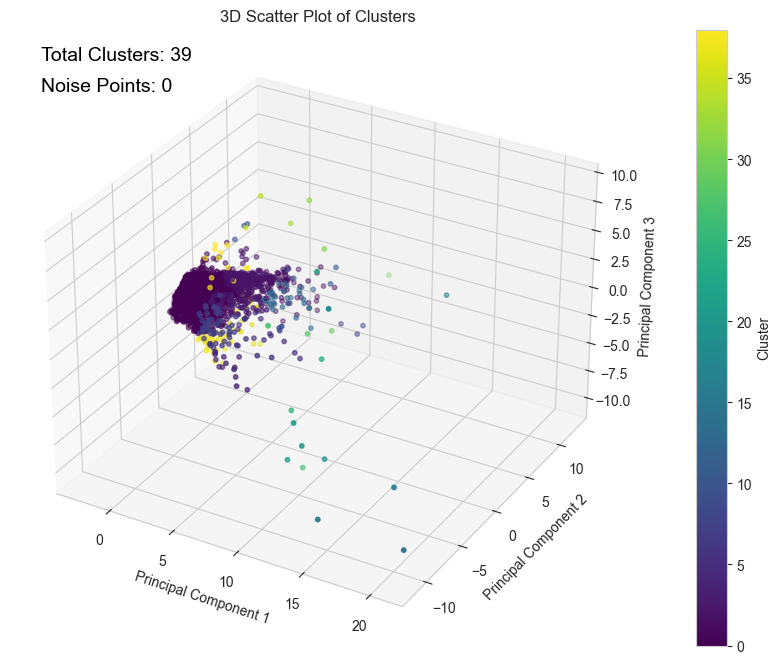

In [83]:
# Loading the dataset
df_pca = pd.read_csv(r'./dimension_reduced_data/knn3_pca.csv', index_col = 'CUST_ID')
df_pca = df_pca.iloc[:, :3]

# Estimating the bandwidth
est_bandwidth = estimate_bandwidth(df_pca, quantile = 0.1)

# Initial clustering
ms_pca3 = MeanShift(bandwidth = est_bandwidth).fit(df_pca)

# Visualising clusters
visualise_clusters(df_pca, ms_pca3.labels_, 'Principal Component', s = 5)

# Saving the model
with open('./models/ms_pca3.pkl', 'wb') as file:
    pickle.dump(ms_pca3, file)

### t-SNE Dataset
The following will use **t-SNE with 3 components**.

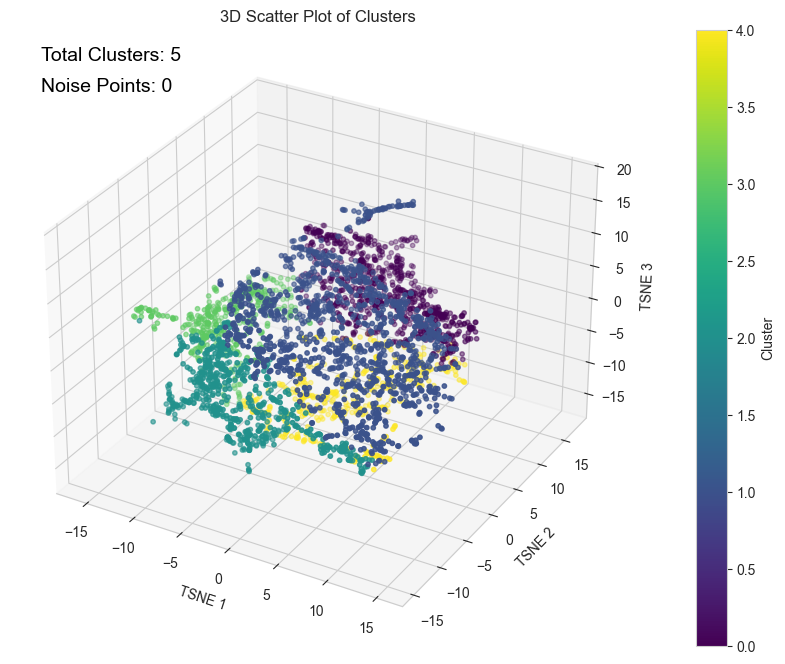

In [84]:
# Loading the dataset
df_tsne = pd.read_csv(r'./dimension_reduced_data/knn3_tsne3.csv', index_col = 'CUST_ID')

# Estimating the bandwidth
est_bandwidth = estimate_bandwidth(df_tsne, quantile = 0.1)

# Initial clustering
ms_tsne3 = MeanShift(bandwidth = est_bandwidth).fit(df_tsne)

# Visualising clusters
visualise_clusters(df_tsne, ms_tsne3.labels_, 'TSNE', s = 5)

# Saving the model
with open('./models/ms_tsne3.pkl', 'wb') as file:
    pickle.dump(ms_tsne3, file)

#### UMAP Dataset
The following will use **UMAP with 3 components**.

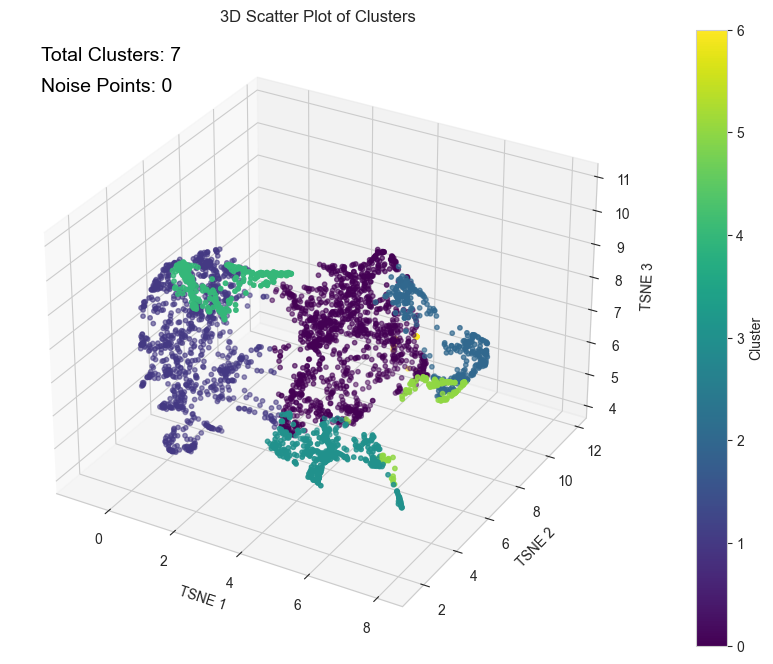

In [85]:
# Loading the dataset
df_umap = pd.read_csv(r'./dimension_reduced_data/knn3_umap3.csv', index_col = 'CUST_ID')

# Estimating the bandwidth
est_bandwidth = estimate_bandwidth(df_umap, quantile = 0.1)

# Initial clustering
ms_umap3 = MeanShift(bandwidth = est_bandwidth).fit(df_umap)

# Visualising clusters
visualise_clusters(df_umap, ms_umap3.labels_, 'TSNE', s = 5)

# Saving the model
with open('./models/ms_umap3.pkl', 'wb') as file:
    pickle.dump(ms_umap3, file)

### 7.2.2 Model Evaluation

#### Silhouette Score

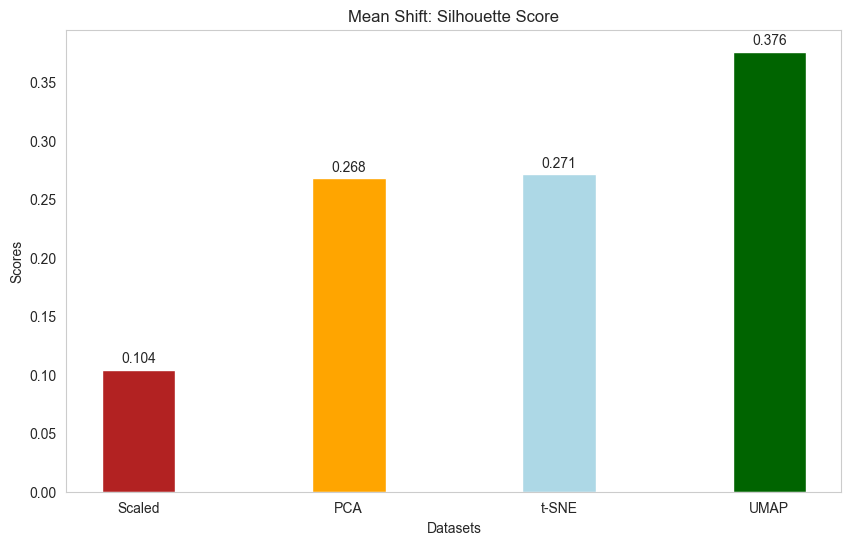

In [86]:
# Calculating the Silhouette Score
ms_silhouette = {
    'Scaled': silhouette_score(df_scaled, ms_scaled.labels_),
    'PCA': silhouette_score(df_pca, ms_pca3.labels_),
    't-SNE': silhouette_score(df_tsne, ms_tsne3.labels_),
    'UMAP': silhouette_score(df_umap, ms_umap3.labels_)
}

# Visualising the differences in Silhouette Score
visualise_scores(ms_silhouette, 'Mean Shift', 'Silhouette Score')

#### Davies-Bouldin Index

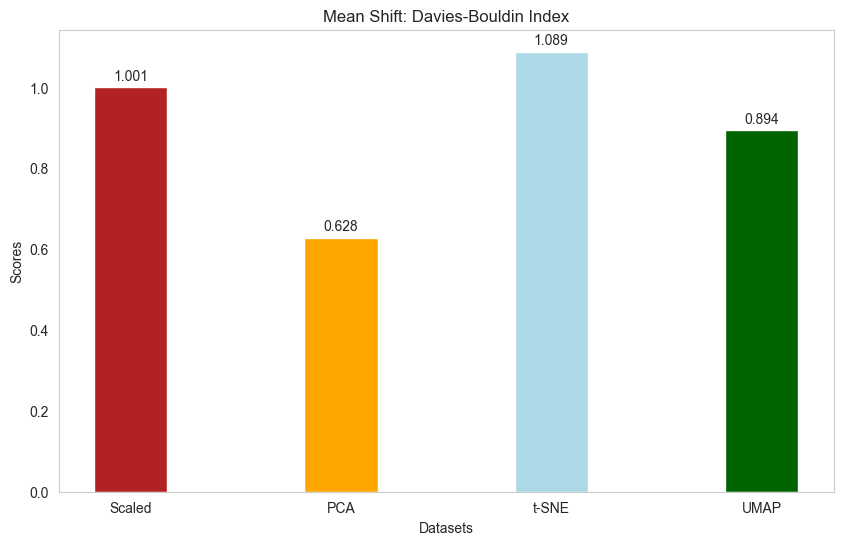

In [87]:
# Calculating the Silhouette Score
ms_dbindex = {
    'Scaled': davies_bouldin_score(df_scaled, ms_scaled.labels_),
    'PCA': davies_bouldin_score(df_pca, ms_pca3.labels_),
    't-SNE': davies_bouldin_score(df_tsne, ms_tsne3.labels_),
    'UMAP': davies_bouldin_score(df_umap, ms_umap3.labels_)
}

# Visualising the differences in Davies-Bouldin Index
visualise_scores(ms_dbindex, 'Mean Shift', 'Davies-Bouldin Index')

#### Calinski-Harabasz Index

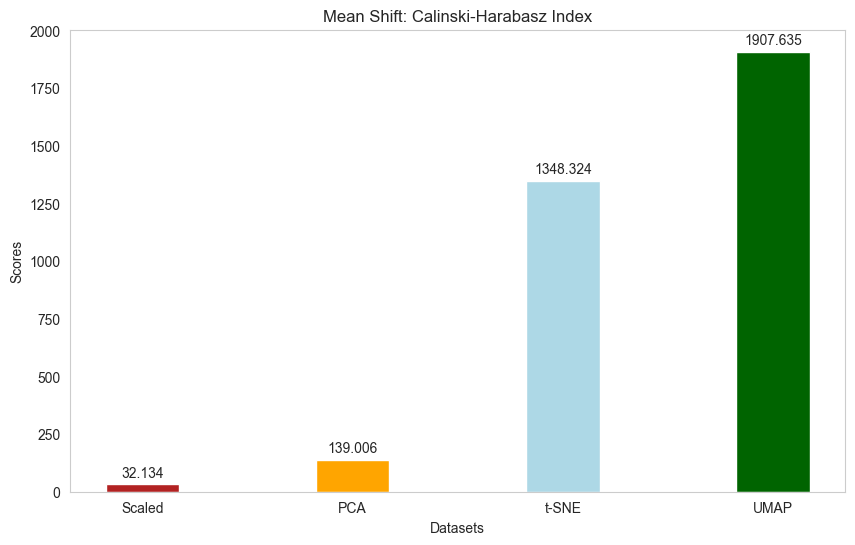

In [88]:
# Calculating the Calinski-Harabasz Index
ms_chindex = {
    'Scaled': calinski_harabasz_score(df_scaled, ms_scaled.labels_),
    'PCA': calinski_harabasz_score(df_pca, ms_pca3.labels_),
    't-SNE': calinski_harabasz_score(df_tsne, ms_tsne3.labels_),
    'UMAP': calinski_harabasz_score(df_umap, ms_umap3.labels_)
}

# Visualising the differences in Calinski-Harabasz Index
visualise_scores(ms_chindex, 'Mean Shift', 'Calinski-Harabasz Index')

**Conclusion:**

Since the performance of **UMAP** dataset is the **best** in terms of **Silhouette Score** and **Calinski-Harabasz Index**, the **UMAP Dataset** is **chosen** for the **Mean Shift Model**.

### 7.2.3 Hyperparameter Tuning
The following hyperparameters will be fine-tuned:
1) **Bandwidth**

#### Bandwidth
The key hyperparameter for Mean Shift clustering is **bandwidth**, which is the radius of the kernel. In sklearn, the default bandwidth is estimated using the estimate_bandwidth function. The estimated bandwidth can be adjusted by setting the **quantile** parameter, which specifies the proportion of distances to the k-th nearest neighbor that are used to estimate the bandwidth. Higher quantile value will yield a larger bandwidth and vice versa. The default quantile value is 0.3. The following will try out different quantile values to see if it improves the clustering performance.

**References:**
 1) [estimate_bandwidth](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.estimate_bandwidth.html)

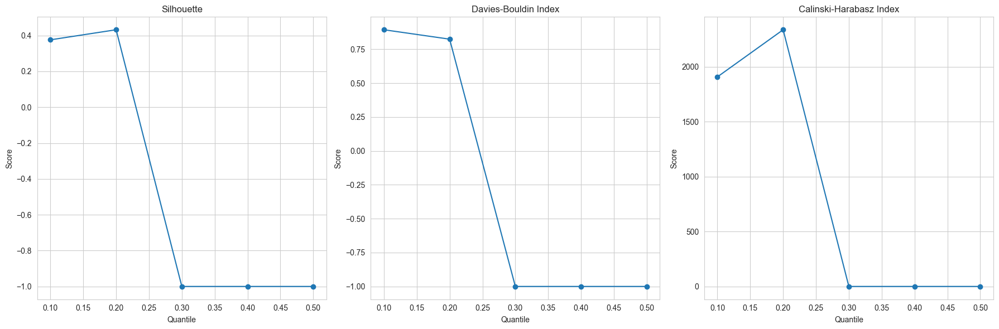

In [89]:
# Loading the best performing dataset for Mean Shift
df_ms_best = df_umap

# Quantile values for fine-tuning
quantiles = [0.1, 0.2, 0.3, 0.4, 0.5]

# Dictionary for storing scores
ms_quantile_tuning = {
    'Silhouette': [],
    'Davies-Bouldin Index': [],
    'Calinski-Harabasz Index': []
}

for quantile in quantiles:
    # Bandwidth setting
    bandwidth = estimate_bandwidth(df_ms_best, quantile=quantile)

    # Creating and fitting the Mean Shift model
    ms_model= MeanShift(bandwidth=bandwidth).fit(df_ms_best)

    with open(f'./models/ms_umap3_quantile{quantile}.pkl', 'wb') as file:
        pickle.dump(ms_model, file)

    if len(np.unique(ms_model.labels_)) > 1:
        ms_quantile_tuning['Silhouette'].append(silhouette_score(df_ms_best, ms_model.labels_))
        ms_quantile_tuning['Davies-Bouldin Index'].append(davies_bouldin_score(df_ms_best, ms_model.labels_))
        ms_quantile_tuning['Calinski-Harabasz Index'].append(calinski_harabasz_score(df_ms_best, ms_model.labels_))
    else:
        ms_quantile_tuning['Silhouette'].append(-1)
        ms_quantile_tuning['Davies-Bouldin Index'].append(-1)
        ms_quantile_tuning['Calinski-Harabasz Index'].append(-1)

# Plotting the metrics in subplots
plot_metrics(values = quantiles, metrics = ms_quantile_tuning, title = 'Quantile')

### 7.2.4 Best Model Fitting
The best model will be fitted using the following hyperparameters:
1) **Quantile**: 0.2

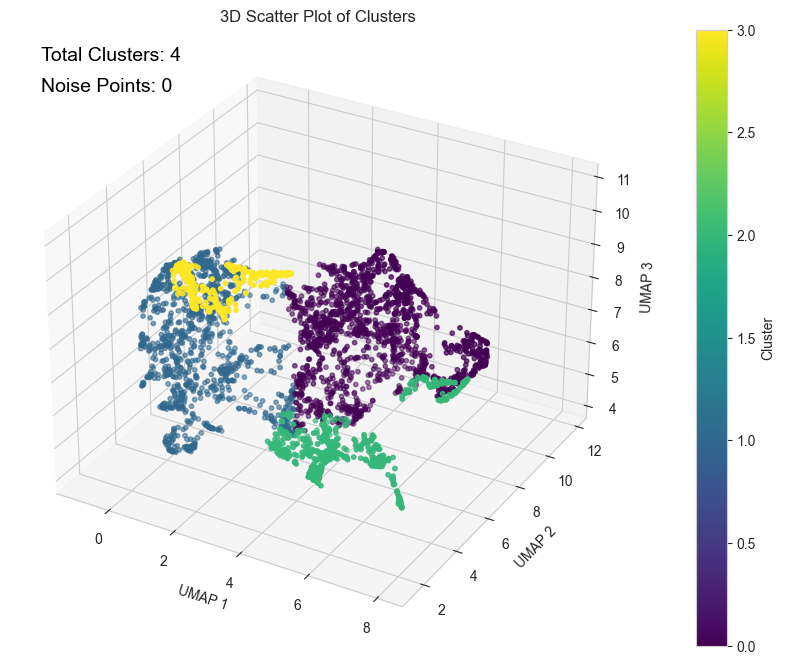

Silhouette Score: 0.43208220527301383
Davies-Bouldin Index: 0.8249304259974568
Calinski-Harabasz Index: 2336.6070945567617


In [90]:
# Bandwidth setting
bandwidth = estimate_bandwidth(df_umap, quantile=0.2)

# Creating and fitting the Mean Shift model
best_ms= MeanShift(bandwidth=bandwidth).fit(df_umap)

# Visualising clusters
visualise_clusters(df_umap, best_ms.labels_, 'UMAP', s = 5)

# Printing the best model's metrics
print(f'Silhouette Score: {silhouette_score(df_umap, best_ms.labels_)}')
print(f'Davies-Bouldin Index: {davies_bouldin_score(df_umap, best_ms.labels_)}')
print(f'Calinski-Harabasz Index: {calinski_harabasz_score(df_umap, best_ms.labels_)}')

# Saving the model
with open('./models/best_ms.pkl', 'wb') as file:
    pickle.dump(best_ms, file)

## 7.3 Balance Iterative Reducing and Clustering using Hierarchies (BIRCH)
Balance Iterative Reducing and Clustering using Hierarchies (BIRCH) is a **hierarchical clustering** technique that is designed to handle large datasets. The algorithm builds a tree structure with a fixed amount of memory, where each node in the tree represents a cluster. The algorithm works by incrementally updating the tree structure as new data points are added to the dataset.

### 7.3.1 Initial Model Fitting
The following datasets are used for clustering:
1) **Standard Scaled Dataset**
2) **PCA Dataset**
3) **t-SNE Dataset**
4) **UMAP Dataset**

The following initial hyperparameters are used to determine the best performing dataset:
1) **Threshold**: 0.5
2) **Branching Factor**: 50
3) **Number of Clusters**: 3

#### Standard Scaled Dataset
The following will use the **Standard Scaled Dataset** to train the **BIRCH Model**.

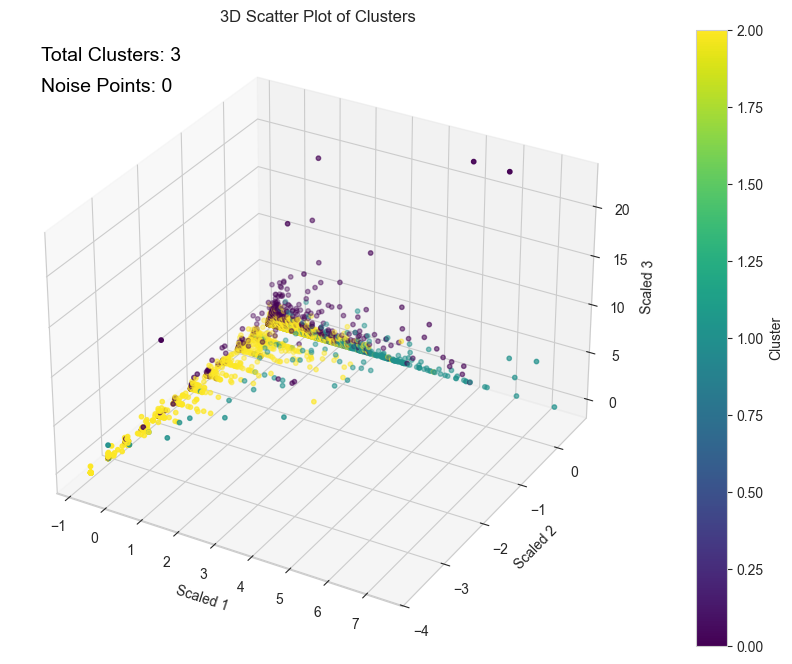

In [91]:
# Loading the dataset
df_scaled = pd.read_csv(r'./scaled_data/knn3_standard_scaled.csv', index_col = 'CUST_ID')

# Initial clustering
birch_scaled = Birch(threshold = 0.5, branching_factor = 50, n_clusters = 3).fit(df_scaled)

# Visualising clusters
visualise_clusters(df_scaled, birch_scaled.labels_, 'Scaled', s = 5)

# Saving the model
with open('./models/birch_scaled.pkl', 'wb') as file:
    pickle.dump(birch_scaled, file)

#### PCA Dataset
The following will only use the **first 3 principal components**.

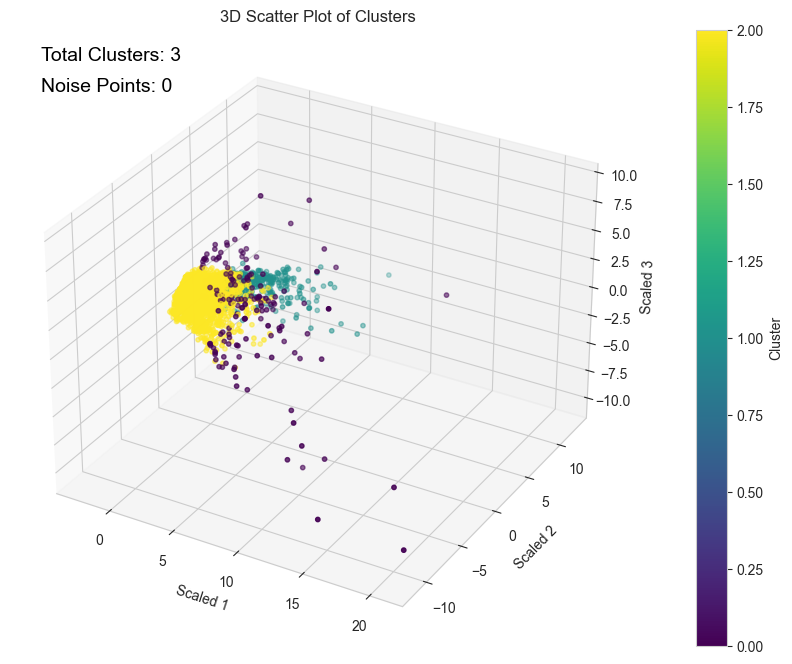

In [92]:
# Loading the dataset
df_pca = pd.read_csv(r'./dimension_reduced_data/knn3_pca.csv', index_col = 'CUST_ID')
df_pca = df_pca.iloc[:, :5]

# Initial clustering
birch_pca3 = Birch(threshold = 0.5, branching_factor = 50, n_clusters = 3).fit(df_pca)

# Visualising clusters
visualise_clusters(df_pca, birch_pca3.labels_, 'Scaled', s = 5)

# Saving the model
with open('./models/birch_pca3.pkl', 'wb') as file:
    pickle.dump(birch_pca3, file)

#### t-SNE Dataset
The following will use **t-SNE with 3 components**.

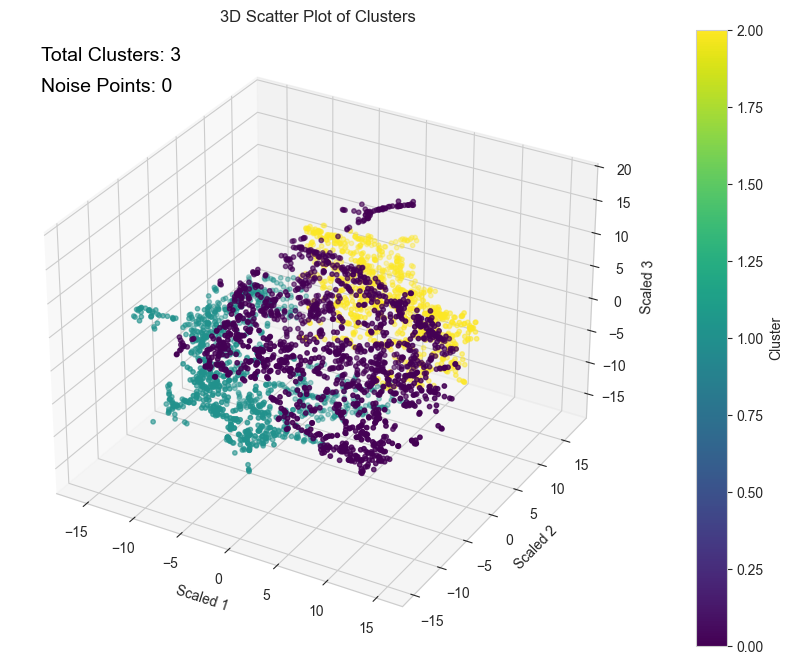

In [93]:
# Loading the dataset
df_tsne = pd.read_csv(r'./dimension_reduced_data/knn3_tsne3.csv', index_col = 'CUST_ID')

# Initial clustering
birch_tsne3 = Birch(threshold = 0.5, branching_factor = 50, n_clusters = 3).fit(df_tsne)

# Visualising clusters
visualise_clusters(df_tsne, birch_tsne3.labels_, 'Scaled', s = 5)

# Saving the model
with open('./models/birch_tsne3.pkl', 'wb') as file:
    pickle.dump(birch_tsne3, file)

#### UMAP Dataset
The following will use **UMAP with 3 components**.

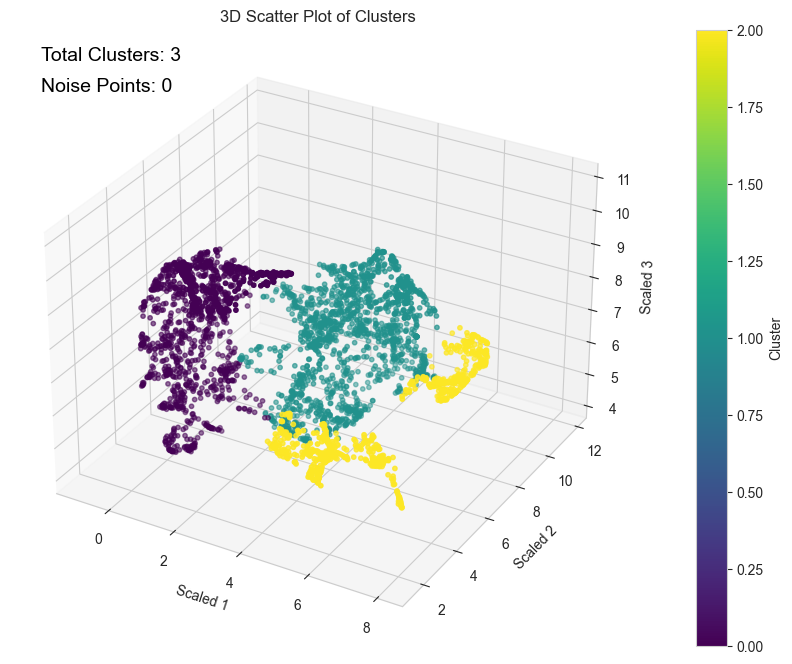

In [94]:
# Loading the dataset
df_umap = pd.read_csv(r'./dimension_reduced_data/knn3_umap3.csv', index_col = 'CUST_ID')

# Initial clustering
birch_umap3 = Birch(threshold = 0.5, branching_factor = 50, n_clusters = 3).fit(df_umap)

# Visualising clusters
visualise_clusters(df_umap, birch_umap3.labels_, 'Scaled', s = 5)

# Saving the model
with open('./models/birch_umap3.pkl', 'wb') as file:
    pickle.dump(birch_umap3, file)

### 7.3.2 Model Evaluation

#### Silhouette Score

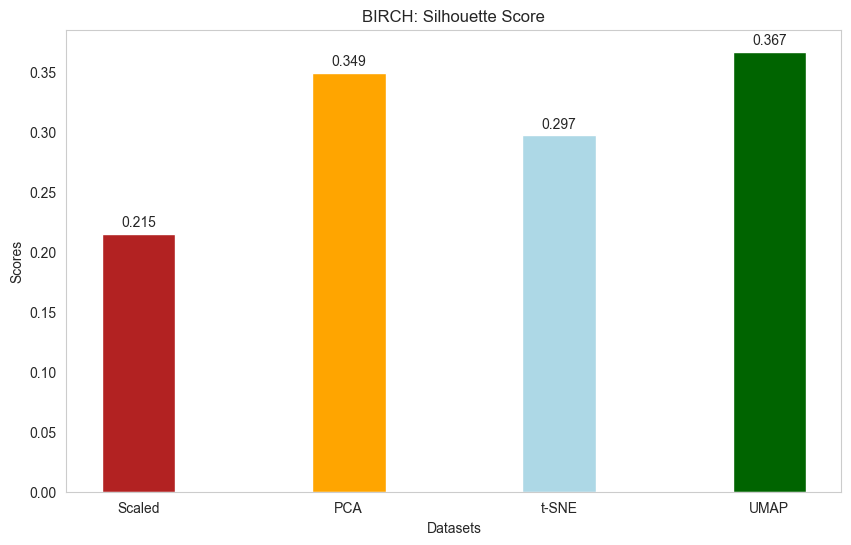

In [95]:
# Calculating the Silhouette Score
birch_silhoutte = {
    'Scaled': silhouette_score(df_scaled, birch_scaled.labels_),
    'PCA': silhouette_score(df_pca, birch_pca3.labels_),
    't-SNE': silhouette_score(df_tsne, birch_tsne3.labels_),
    'UMAP': silhouette_score(df_umap, birch_umap3.labels_)
}

# Visualising the differences in Silhouette Score
visualise_scores(birch_silhoutte, 'BIRCH', 'Silhouette Score')

#### Davies-Bouldin Index

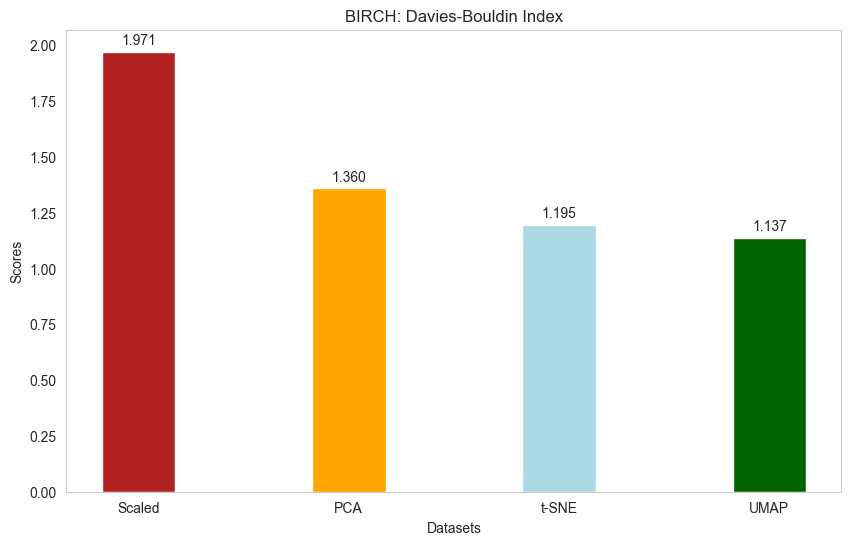

In [96]:
# Calculating the Davies-Bouldin Index
birch_dbindex = {
    'Scaled': davies_bouldin_score(df_scaled, birch_scaled.labels_),
    'PCA': davies_bouldin_score(df_pca, birch_pca3.labels_),
    't-SNE': davies_bouldin_score(df_tsne, birch_tsne3.labels_),
    'UMAP': davies_bouldin_score(df_umap, birch_umap3.labels_)
}

# Visualising the differences in Davies-Bouldin Index
visualise_scores(birch_dbindex, 'BIRCH', 'Davies-Bouldin Index')

#### Calinski-Harabasz Index

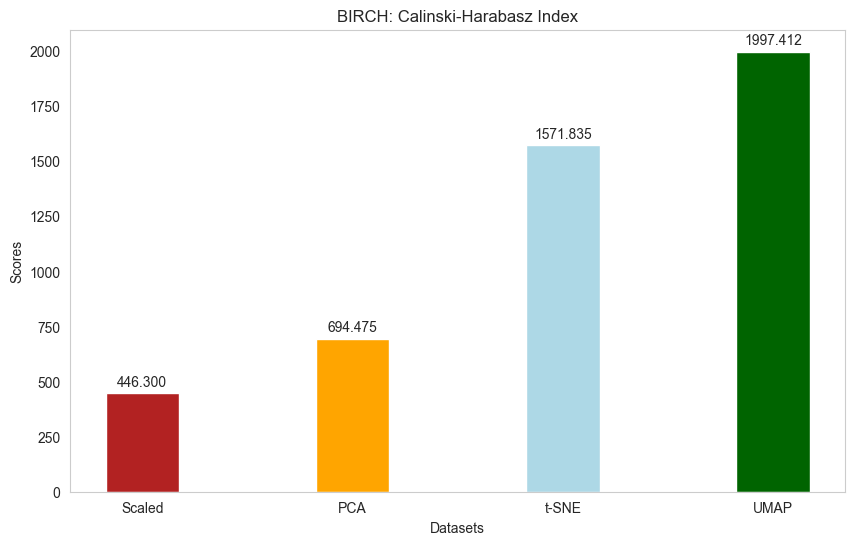

In [97]:
# Calculating the Calinski-Harabasz
birch_chindex = {
    'Scaled': calinski_harabasz_score(df_scaled, birch_scaled.labels_),
    'PCA': calinski_harabasz_score(df_pca, birch_pca3.labels_),
    't-SNE': calinski_harabasz_score(df_tsne, birch_tsne3.labels_),
    'UMAP': calinski_harabasz_score(df_umap, birch_umap3.labels_)
}

# Visualising the differences in Calinski-Harabasz Index
visualise_scores(birch_chindex, 'BIRCH', 'Calinski-Harabasz Index')

### 7.3.3 Hyperparameter Tuning
The following hyperparameters will be fine-tuned:
1) **Threshold**
2) **Branching Factor**
3) **Number of Clusters**

**References:**
 1) [Birch](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.Birch.html)

#### Threshold
Threshold value the maximum radius of the subcluster obtained by merging a new sample and the closest subcluster. Smaller thresold means more subclusters and vice versa.

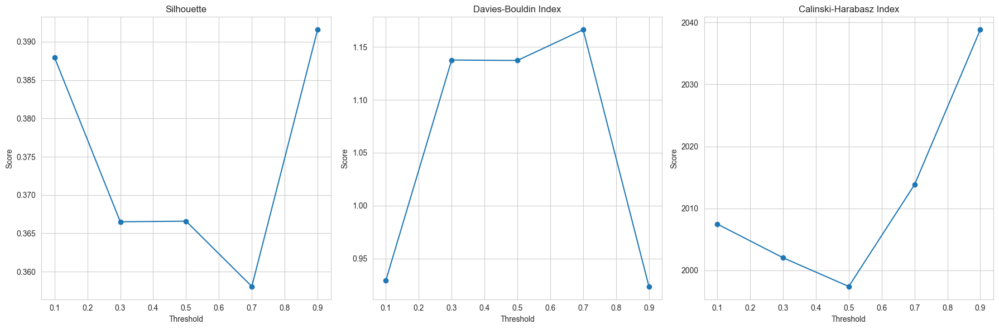

In [98]:
# Loading the best performing dataset for BIRCH
df_birch_best = df_umap

# Threshold values for fine-tuning
thresholds = [0.1, 0.3, 0.5, 0.7, 0.9]

# Dictionary for storing scores
birch_threshold_tuning = {
    'Silhouette': [],
    'Davies-Bouldin Index': [],
    'Calinski-Harabasz Index': []
}

for threshold in thresholds:
    # Creating and fitting the Birch model
    birch_model = Birch(threshold = threshold, branching_factor = 50, n_clusters = 3).fit(df_birch_best)

    with open(f'./models/birch_umap3_threshold{threshold}.pkl', 'wb') as file:
        pickle.dump(birch_model, file)

    birch_threshold_tuning['Silhouette'].append(silhouette_score(df_birch_best, birch_model.labels_))
    birch_threshold_tuning['Davies-Bouldin Index'].append(davies_bouldin_score(df_birch_best, birch_model.labels_))
    birch_threshold_tuning['Calinski-Harabasz Index'].append(calinski_harabasz_score(df_birch_best, birch_model.labels_))

# Plotting the metrics in subplots
plot_metrics(values = thresholds, metrics = birch_threshold_tuning, title = 'Threshold')

#### Branching Factor
Branching Factor is the maximum number of CF subclusters in each node. Small branching factor means deeper tree and vice versa.

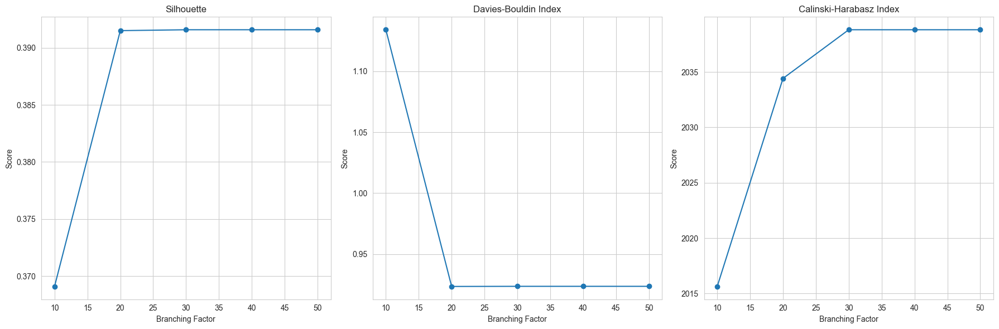

In [99]:
# Branching factors for fine-tuning
branching_factors = [10, 20, 30, 40, 50]

birch_branching_tuning = {
    'Silhouette': [],
    'Davies-Bouldin Index': [],
    'Calinski-Harabasz Index': []
}

for factor in branching_factors:
    # Creating and fitting the Birch model
    birch_model = Birch(threshold = 0.9, branching_factor = factor, n_clusters = 3).fit(df_birch_best)

    with open(f'./models/birch_umap3_threshold0.9_branchingfact{factor}.pkl', 'wb') as file:
        pickle.dump(birch_model, file)

    birch_branching_tuning['Silhouette'].append(silhouette_score(df_birch_best, birch_model.labels_))
    birch_branching_tuning['Davies-Bouldin Index'].append(davies_bouldin_score(df_birch_best, birch_model.labels_))
    birch_branching_tuning['Calinski-Harabasz Index'].append(calinski_harabasz_score(df_birch_best, birch_model.labels_))

# Plotting the metrics in subplots
plot_metrics(values = branching_factors, metrics = birch_branching_tuning, title = 'Branching Factor')

#### Number of Clusters
The number of clusters to form. (In sklearn, agglomerative clustering is by default used to extract the clusters)

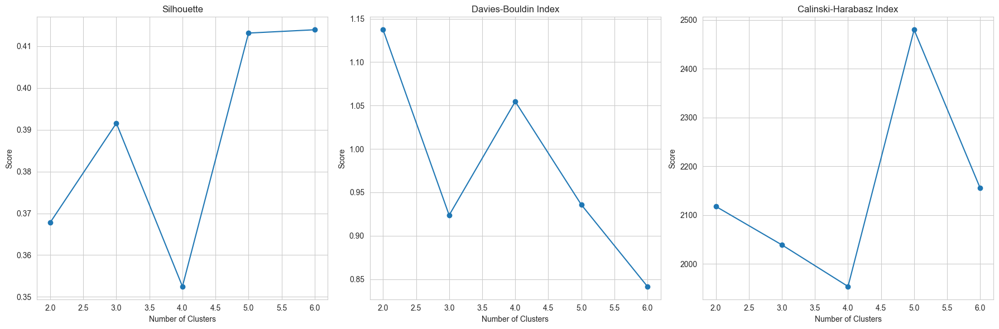

In [100]:
# The number of clusters for fine-tuning
n_clusters = [2, 3, 4, 5, 6]

# Dictionary for storing scores
birch_ncluster_tuning = {
    'Silhouette': [],
    'Davies-Bouldin Index': [],
    'Calinski-Harabasz Index': []
}

for ncluster in n_clusters:
    # Creating and fitting the Birch model
    birch_model = Birch(threshold = 0.9, branching_factor = 50, n_clusters = ncluster).fit(df_birch_best)

    with open(f'./models/birch_umap3_threshold0.9_branchingfact50_ncluster{ncluster}.pkl', 'wb') as file:
        pickle.dump(birch_model, file)

    birch_ncluster_tuning['Silhouette'].append(silhouette_score(df_birch_best, birch_model.labels_))
    birch_ncluster_tuning['Davies-Bouldin Index'].append(davies_bouldin_score(df_birch_best, birch_model.labels_))
    birch_ncluster_tuning['Calinski-Harabasz Index'].append(calinski_harabasz_score(df_birch_best, birch_model.labels_))

# Plotting the metrics in subplots
plot_metrics(values = n_clusters, metrics = birch_ncluster_tuning, title = 'Number of Clusters')

### 7.3.4 Best Model Fitting
The best model will be fitted using the following hyperparameters:
1. **Threshold**: 0.9
2. **Branching Factor**: 50
3. **Number of Clusters**: 5

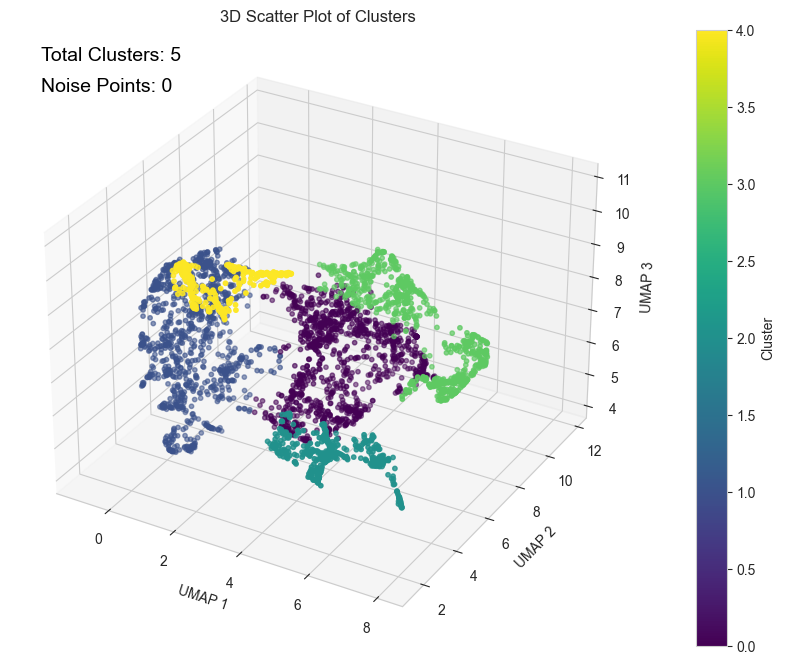

Silhouette Score: 0.41314991312846766
Davies-Bouldin Index: 0.9357427561222093
Calinski-Harabasz Index: 2479.9438174827387


In [101]:
# Creating and fitting the Birch model
best_birch = Birch(threshold = 0.9, branching_factor = 50, n_clusters = 5).fit(df_birch_best)

# Visualising clusters
visualise_clusters(df_umap, best_birch.labels_, 'UMAP', s = 5)

# Printing the best model's metrics
print(f'Silhouette Score: {silhouette_score(df_umap, best_birch.labels_)}')
print(f'Davies-Bouldin Index: {davies_bouldin_score(df_umap, best_birch.labels_)}')
print(f'Calinski-Harabasz Index: {calinski_harabasz_score(df_umap, best_birch.labels_)}')

# Saving the model
with open('./models/best_birch.pkl', 'wb') as file:
    pickle.dump(best_birch, file)

## 7.4 Hierarchical Density-Based Spatial Clustering of Applications with Noise (HDBSCAN)
Hierarchical Density-Based Spatial Clustering of Applications with Noise (HDBSCAN) is a **density-based clustering** technique that is designed to handle datasets with noise. The algorithm works by forming clusters based on the density of the data points, where clusters are formed around the dense regions of the dataset.

### 7.4.1 Initial Model Fitting
The following datasets are used for clustering:
1) **Standard Scaled Dataset**
2) **PCA Dataset**
3) **t-SNE Dataset**
4) **UMAP Dataset**

The following initial hyperparameters are used to determine the best performing dataset:
1) **Minimum Cluster Size**: 40
2) **Minimum Samples**: 5

#### Standard Scaled Dataset
The following will use the **Standard Scaled Dataset** to train the **HDBSCAN Model**.

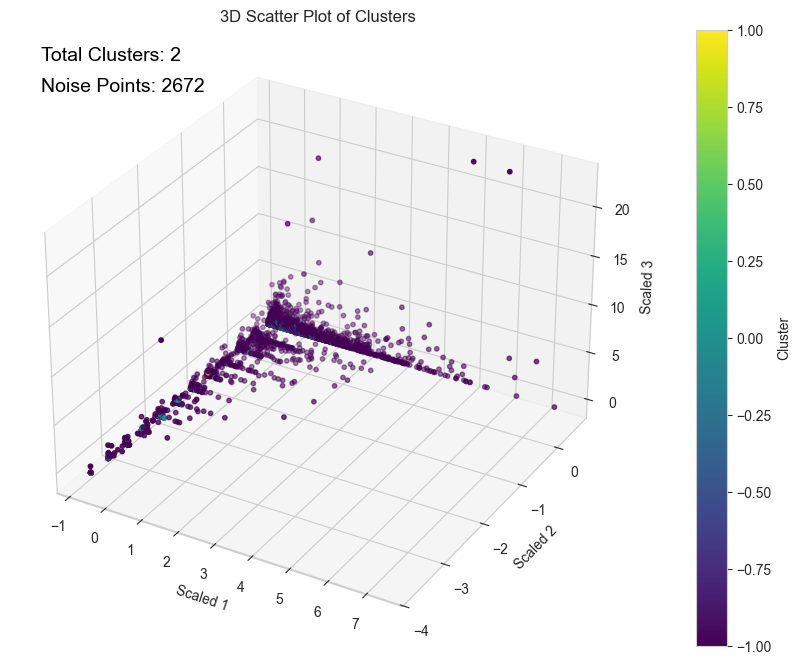

In [102]:
# Loading the dataset
df_scaled = pd.read_csv('./scaled_data/knn3_standard_scaled.csv', index_col='CUST_ID')

# Initial clustering
hdbscan_scaled = HDBSCAN(min_cluster_size = 40, min_samples = 5).fit(df_scaled)

# Visualising clusters
visualise_clusters(df_scaled, hdbscan_scaled.labels_, 'Scaled', s = 5)

# Saving the model
with open('./models/hdbscan_scaled.pkl', 'wb') as file:
    pickle.dump(hdbscan_scaled, file)

#### PCA Dataset
The following will only use the **first 3 principal components**.

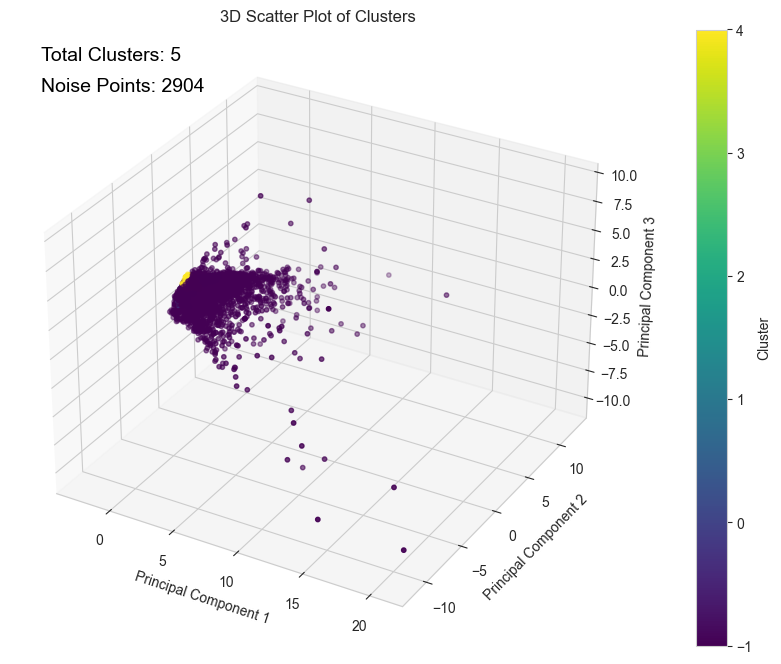

In [103]:
# Loading the dataset
df_pca = pd.read_csv('./dimension_reduced_data/knn3_pca.csv', index_col='CUST_ID')
df_pca = df_pca.iloc[:, :5]

# Initial clustering
hdbscan_pca3 = HDBSCAN(min_cluster_size = 40, min_samples = 5).fit(df_pca)

# Visualising clusters
visualise_clusters(df_pca, hdbscan_pca3.labels_, 'Principal Component', s = 5)

# Saving the model
with open('./models/hdbscan_pca3.pkl', 'wb') as file:
    pickle.dump(hdbscan_pca3, file)

#### t-SNE Dataset
The following will use **t-SNE with 3 components**.

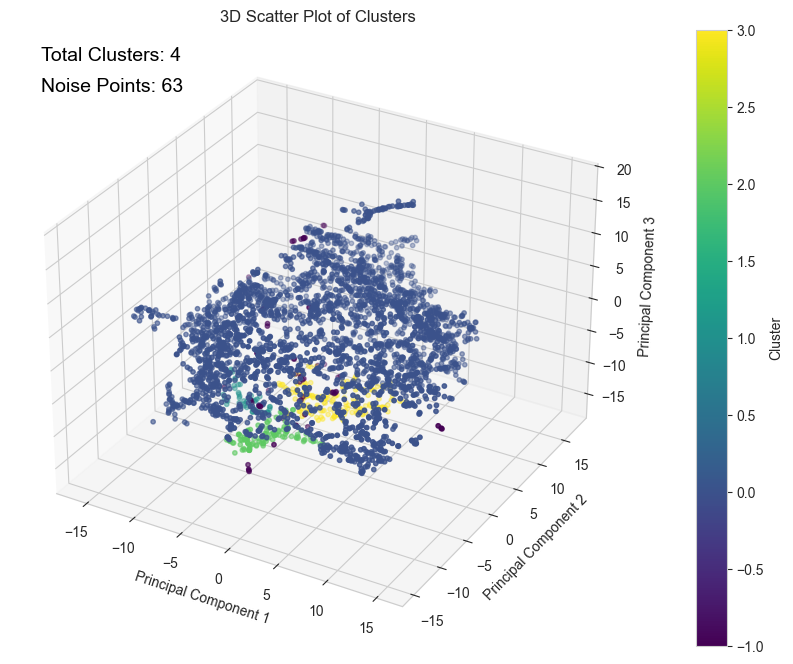

In [104]:
# Loading the dataset
df_tsne = pd.read_csv('./dimension_reduced_data/knn3_tsne3.csv', index_col='CUST_ID')

# Initial clustering
hdbscan_tsne3 = HDBSCAN(min_cluster_size = 40, min_samples = 5).fit(df_tsne)

# Visualising clusters
visualise_clusters(df_tsne, hdbscan_tsne3.labels_, 'Principal Component', s = 5)

# Saving the model
with open('./models/hdbscan_tsne3.pkl', 'wb') as file:
    pickle.dump(hdbscan_tsne3, file)

#### UMAP Dataset
The following will use **UMAP with 3 components**.

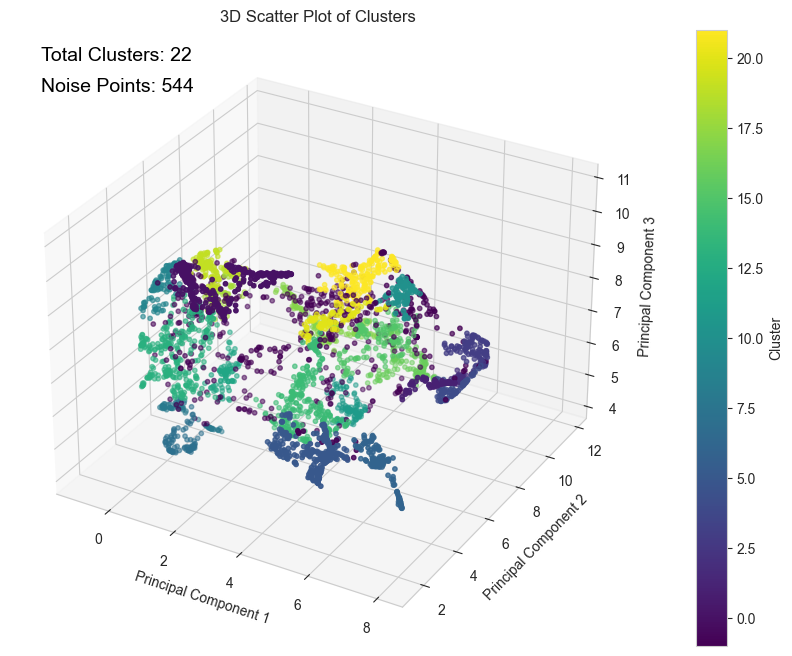

In [105]:
# Loading the dataset
df_umap = pd.read_csv('./dimension_reduced_data/knn3_umap3.csv', index_col='CUST_ID')

# Initial clustering
hdbscan_umap3 = HDBSCAN(min_cluster_size = 40, min_samples = 5).fit(df_umap)

# Visualising clusters
visualise_clusters(df_umap, hdbscan_umap3.labels_, 'Principal Component', s = 5)

# Saving the model
with open('./models/hdbscan_umap3.pkl', 'wb') as file:
    pickle.dump(hdbscan_umap3, file)

### 7.4.2 Model Evaluation

#### Silhouette Score

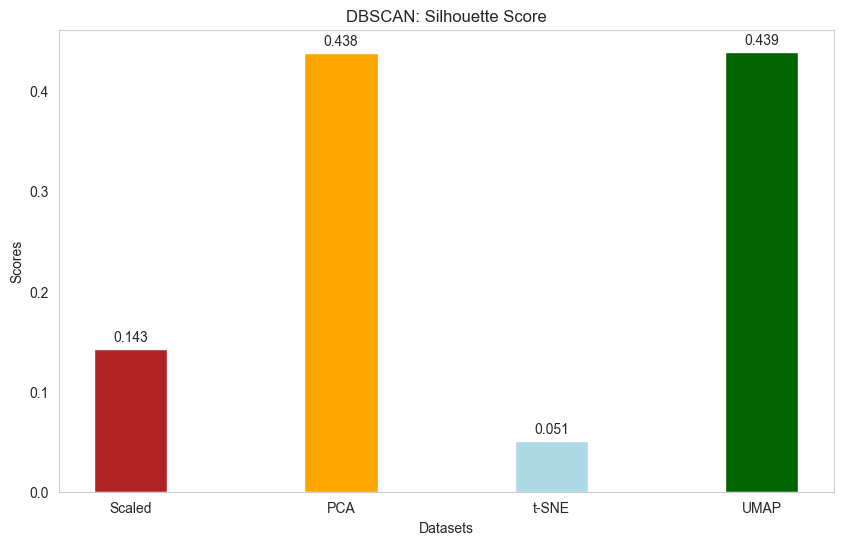

In [106]:
# Calculating the Silhouette Score
hdbscan_silhouette = {
    'Scaled': silhouette_score(df_scaled[hdbscan_scaled.labels_ != -1], hdbscan_scaled.labels_[hdbscan_scaled.labels_ != -1]),
    'PCA': silhouette_score(df_pca[hdbscan_pca3.labels_ != -1], hdbscan_pca3.labels_[hdbscan_pca3.labels_ != -1]),
    't-SNE': silhouette_score(df_tsne[hdbscan_tsne3.labels_ != -1], hdbscan_tsne3.labels_[hdbscan_tsne3.labels_ != -1]),
    'UMAP': silhouette_score(df_umap[hdbscan_umap3.labels_ != -1], hdbscan_umap3.labels_[hdbscan_umap3.labels_ != -1])
}

# Visualising the differences in Silhouette Score
visualise_scores(hdbscan_silhouette, 'DBSCAN', 'Silhouette Score')

#### Davies-Bouldin Index

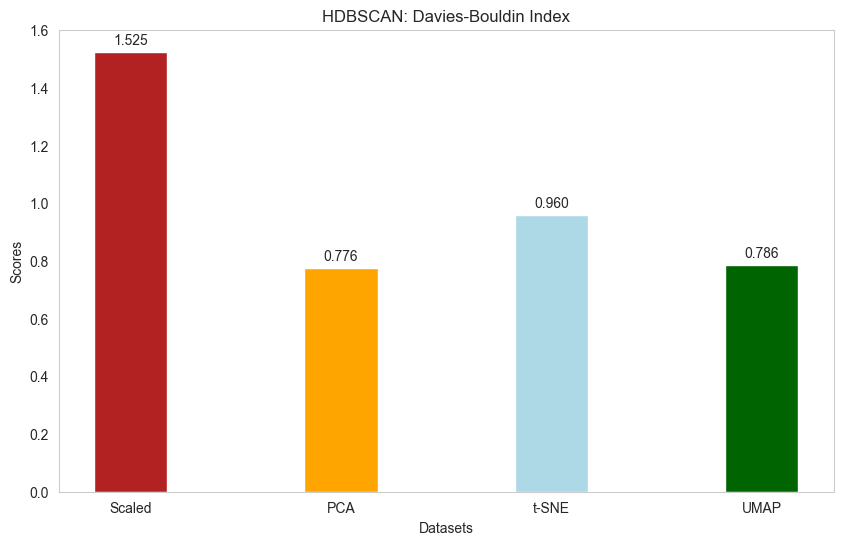

In [107]:
# Calculating the Davies-Bouldin Index
hdbscan_dbindex = {
    'Scaled': davies_bouldin_score(df_scaled[hdbscan_scaled.labels_ != -1], hdbscan_scaled.labels_[hdbscan_scaled.labels_ != -1]),
    'PCA': davies_bouldin_score(df_pca[hdbscan_pca3.labels_ != -1], hdbscan_pca3.labels_[hdbscan_pca3.labels_ != -1]),
    't-SNE': davies_bouldin_score(df_tsne[hdbscan_tsne3.labels_ != -1], hdbscan_tsne3.labels_[hdbscan_tsne3.labels_ != -1]),
    'UMAP': davies_bouldin_score(df_umap[hdbscan_umap3.labels_ != -1], hdbscan_umap3.labels_[hdbscan_umap3.labels_ != -1])
}

# Visualising the differences in Davies-Bouldin Index
visualise_scores(hdbscan_dbindex, 'HDBSCAN', 'Davies-Bouldin Index')

#### Calinski-Harabasz Index

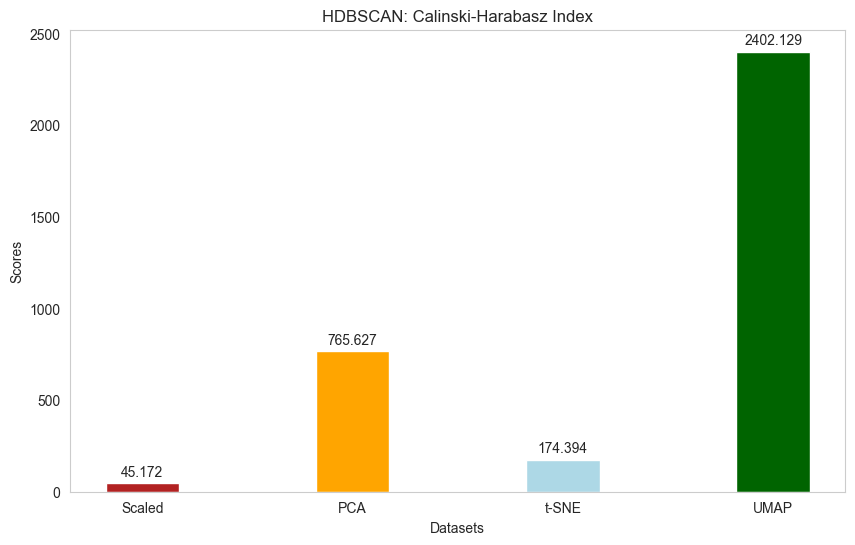

In [108]:
# Calculating the Silhouette Score
hdbscan_chindex = {
    'Scaled': calinski_harabasz_score(df_scaled[hdbscan_scaled.labels_ != -1], hdbscan_scaled.labels_[hdbscan_scaled.labels_ != -1]),
    'PCA': calinski_harabasz_score(df_pca[hdbscan_pca3.labels_ != -1], hdbscan_pca3.labels_[hdbscan_pca3.labels_ != -1]),
    't-SNE': calinski_harabasz_score(df_tsne[hdbscan_tsne3.labels_ != -1], hdbscan_tsne3.labels_[hdbscan_tsne3.labels_ != -1]),
    'UMAP': calinski_harabasz_score(df_umap[hdbscan_umap3.labels_ != -1], hdbscan_umap3.labels_[hdbscan_umap3.labels_ != -1])
}

# Visualising the differences in Calinski-Harabasz Index
visualise_scores(hdbscan_chindex, 'HDBSCAN', 'Calinski-Harabasz Index')

**Conclusion:**

Since the performance of **UMAP** dataset is the **best** in terms of **Silhouette Score** and **Calinski-Harabasz Index**, the **UMAP Dataset** is **chosen** for the **HDBSCAN Model**.

### 7.4.3 Hyperparameter Tuning
The following hyperparameters will be fine-tuned:
1) **Minimum Cluster Size**
2) **Minimum Samples**

#### Minimum Cluster Size
The smallest size grouping that should be considered a cluster.

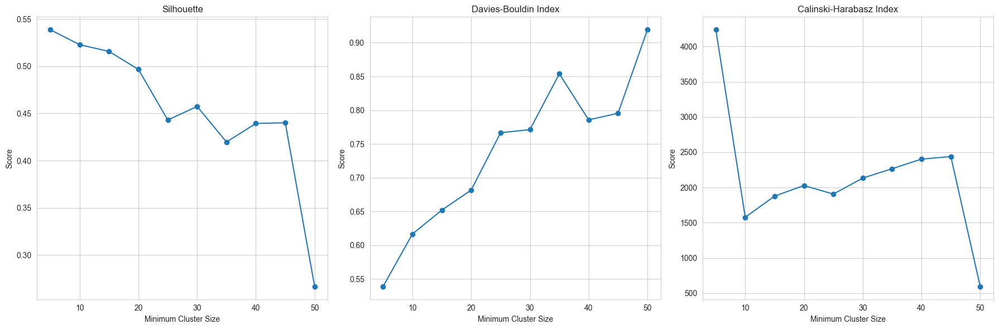

In [109]:
# Loading the best performing dataset for HDBSCAN
df_hdbscan_best = df_umap

# Minimum cluster sizes for fine-tuning
min_cluster_sizes = range(5, 51, 5)

# Dictionary for storing scores
hdbscan_minsize_tuning = {
    'Silhouette': [],
    'Davies-Bouldin Index': [],
    'Calinski-Harabasz Index': []
}

for min_cluster_size in min_cluster_sizes:
    # Creating and fitting the HDBSCAN model
    hdbscan_model = HDBSCAN(min_cluster_size = min_cluster_size, min_samples = 5).fit(df_hdbscan_best)

    with open(f'./models/birch_umap3_minclustersize{min_cluster_size}.pkl', 'wb') as file:
        pickle.dump(hdbscan_model, file)

    hdbscan_minsize_tuning['Silhouette'].append(silhouette_score(df_hdbscan_best[hdbscan_model.labels_ != -1], hdbscan_model.labels_[hdbscan_model.labels_ != -1]))
    hdbscan_minsize_tuning['Davies-Bouldin Index'].append(davies_bouldin_score(df_hdbscan_best[hdbscan_model.labels_ != -1], hdbscan_model.labels_[hdbscan_model.labels_ != -1]))
    hdbscan_minsize_tuning['Calinski-Harabasz Index'].append(calinski_harabasz_score(df_hdbscan_best[hdbscan_model.labels_ != -1], hdbscan_model.labels_[hdbscan_model.labels_ != -1]))

# Plotting the metrics in subplots
plot_metrics(values = min_cluster_sizes, metrics = hdbscan_minsize_tuning, title = 'Minimum Cluster Size')

#### Minimum Samples
The number of samples in a neighbourhood for a point to be considered a core point.

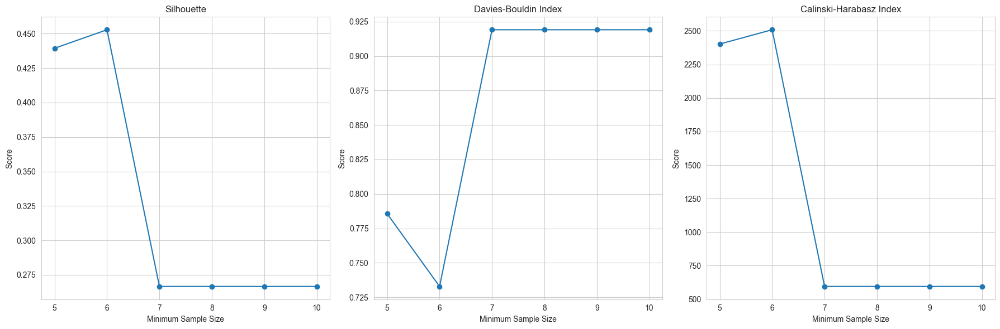

In [110]:
# Minimum samples sizes for fine-tuning
min_samples_range = range(5, 11)

# Dictionary for storing scores
hdbscan_minsample_tuning = {
    'Silhouette': [],
    'Davies-Bouldin Index': [],
    'Calinski-Harabasz Index': []
}

for min_sample in min_samples_range:
    # Creating and fitting the HDBSCAN model
    hdbscan_model = HDBSCAN(min_cluster_size = 40, min_samples = min_sample).fit(df_hdbscan_best)

    with open(f'./models/birch_umap3_minclustersize40_minsamples{min_sample}.pkl', 'wb') as file:
        pickle.dump(hdbscan_model, file)

    hdbscan_minsample_tuning['Silhouette'].append(silhouette_score(df_hdbscan_best[hdbscan_model.labels_ != -1], hdbscan_model.labels_[hdbscan_model.labels_ != -1]))
    hdbscan_minsample_tuning['Davies-Bouldin Index'].append(davies_bouldin_score(df_hdbscan_best[hdbscan_model.labels_ != -1], hdbscan_model.labels_[hdbscan_model.labels_ != -1]))
    hdbscan_minsample_tuning['Calinski-Harabasz Index'].append(calinski_harabasz_score(df_hdbscan_best[hdbscan_model.labels_ != -1], hdbscan_model.labels_[hdbscan_model.labels_ != -1]))

# Plotting the metrics in subplots
plot_metrics(values = min_samples_range, metrics = hdbscan_minsample_tuning, title = 'Minimum Sample Size')

### 7.4.4 Best Model Fitting
The best model will be fitted using the following hyperparameters:
1) **Minimum Cluster Size**: 40
2) **Minimum Samples**: 6

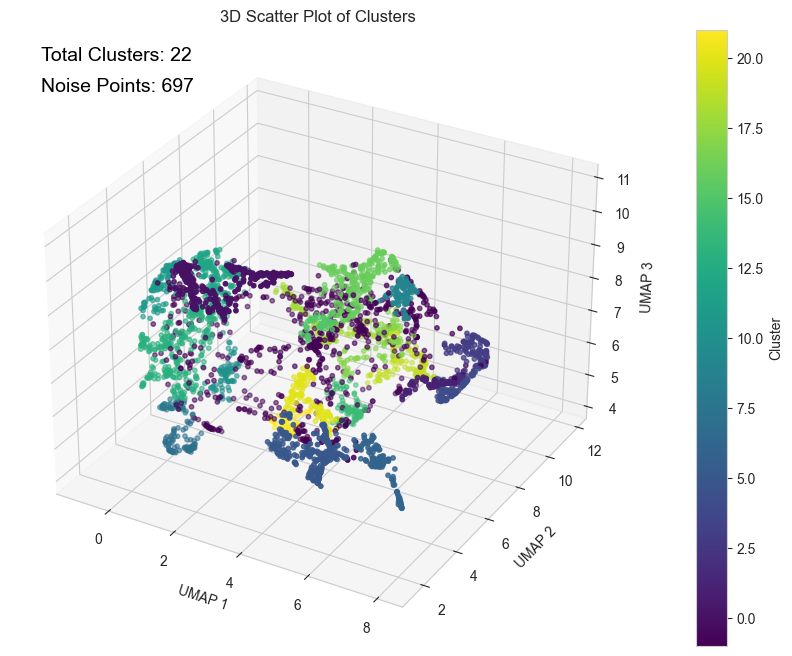

Silhouette Score: 0.4528457953663547
Davies-Bouldin Index: 0.7328782984157446
Calinski-Harabasz Index: 2508.521853892432


In [111]:
# Creating and fitting the HDBSCAN model
best_hdbscan = HDBSCAN(min_cluster_size = 40, min_samples = 6).fit(df_umap)

# Visualising clusters
visualise_clusters(df_umap, best_hdbscan.labels_, 'UMAP', s = 5)

# Printing the best model's metrics
print(f'Silhouette Score: {silhouette_score(df_umap[best_hdbscan.labels_ != -1], best_hdbscan.labels_[best_hdbscan.labels_ != -1])}')
print(f'Davies-Bouldin Index: {davies_bouldin_score(df_umap[best_hdbscan.labels_ != -1], best_hdbscan.labels_[best_hdbscan.labels_ != -1])}')
print(f'Calinski-Harabasz Index: {calinski_harabasz_score(df_umap[best_hdbscan.labels_ != -1], best_hdbscan.labels_[best_hdbscan.labels_ != -1])}')

# Saving the model
with open('./models/best_hdbscan.pkl', 'wb') as file:
    pickle.dump(best_hdbscan, file)

## 7.5 Ordering Points To Identify the Clustering Structure (OPTICS)
OPTICS is a **density-based clustering** technique that is designed to handle datasets with noise. The algorithm works by forming clusters based on the density of the data points, where clusters are formed around the dense regions of the dataset.

### 7.5.1 Initial Model Fitting
The following datasets are used for clustering:
1) **Standard Scaled Dataset**
2) **PCA Dataset**
3) **t-SNE Dataset**
4) **UMAP Dataset**

The following initial hyperparameters are used to determine the best performing dataset:
1) **Minimum samples**: 30
2) **Xi**: 0.05

In [112]:
# Defining function to plot reachability plot
def plot_reachability(df, optics_model, min_samples, xi):
    # Extract reachability distances and cluster labels
    reachability = optics_model.reachability_[optics_model.ordering_]
    labels = optics_model.labels_[optics_model.ordering_]

    # Create a color map for the clusters
    unique_labels = np.unique(labels)
    palette = sns.color_palette('viridis', len(unique_labels))
    color_map = {label: color for label, color in zip(unique_labels, palette)}

    # Plot the reachability distances with colors corresponding to the cluster labels
    plt.figure(figsize=(12, 6))
    for i in range(len(reachability) - 1):
        plt.plot([i, i + 1], [reachability[i], reachability[i + 1]], color= color_map[labels[i]])
        plt.fill_between([i, i + 1], [reachability[i], reachability[i + 1]], color= color_map[labels[i]], alpha=0.3)

    else:
        handles = [mpatches.Patch(color=color_map[label], label=f'Cluster {label}') for label in unique_labels]
        plt.legend(handles=handles, loc='upper right', title = 'Clusters')

    plt.title(f'OPTICS Clustering with min_samples = {min_samples} and xi = {xi}')
    plt.xlabel('Order')
    plt.ylabel('Reachability Distance')
    plt.show()

#### Standard Scaled Dataset
The following will use the **Standard Scaled Dataset** to train the **OPTICS Model**.

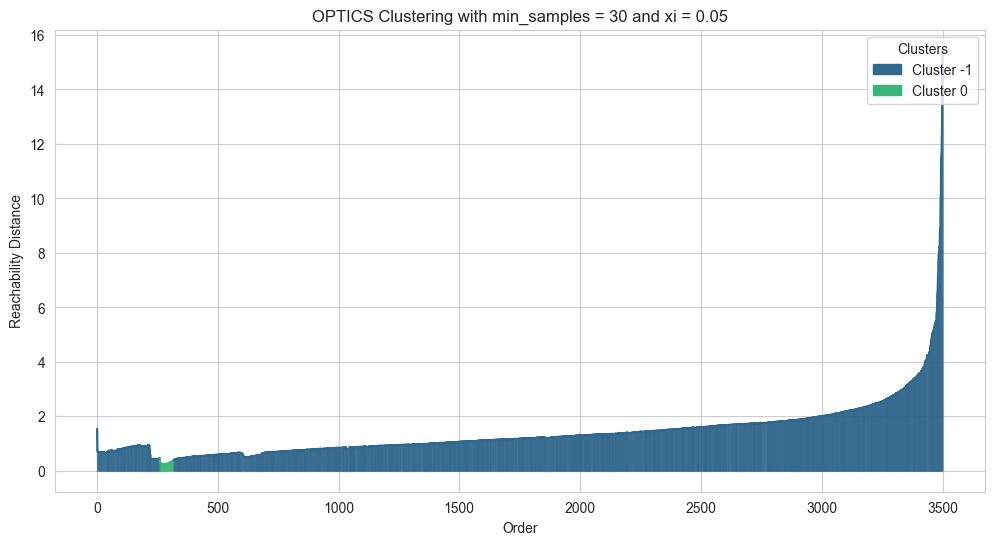

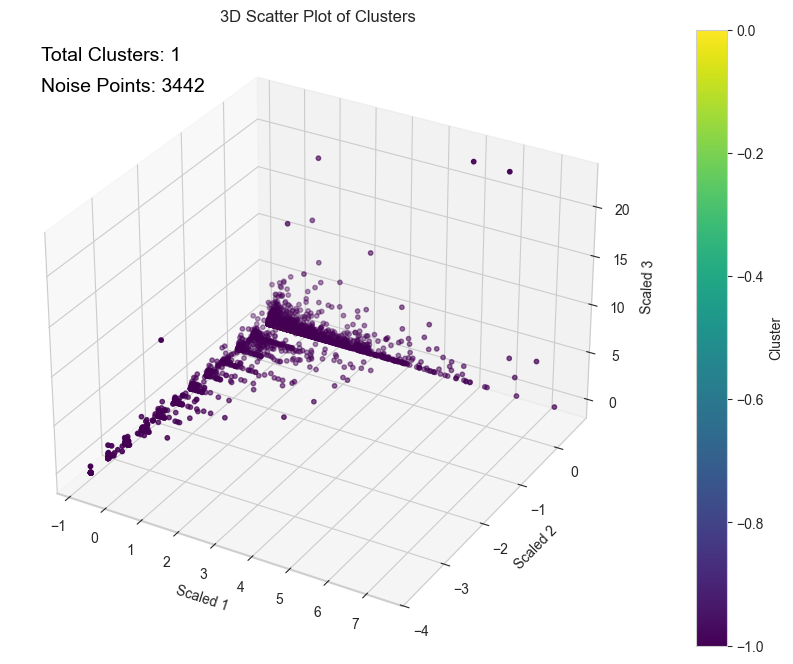

In [113]:
# Loading the dataset
df_scaled = pd.read_csv(r'./scaled_data/knn3_standard_scaled.csv', index_col = 'CUST_ID')

# Initial clustering
optics_scaled = OPTICS(min_samples = 30, xi = 0.05).fit(df_scaled)

# Showing reachability plot
plot_reachability(df_scaled, optics_scaled, 30, 0.05)

# Visualising clusters
visualise_clusters(df_scaled, optics_scaled.labels_, 'Scaled', s = 5)

# Saving the model
with open('./models/optics_scaled.pkl', 'wb') as file:
    pickle.dump(optics_scaled, file)

#### PCA Dataset
The following will only use the **first 3 principal components**.

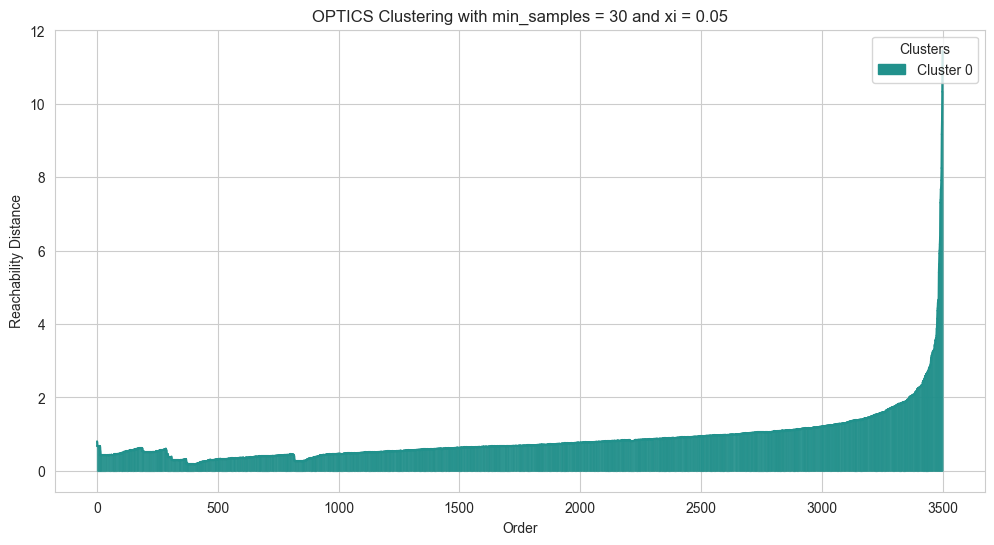

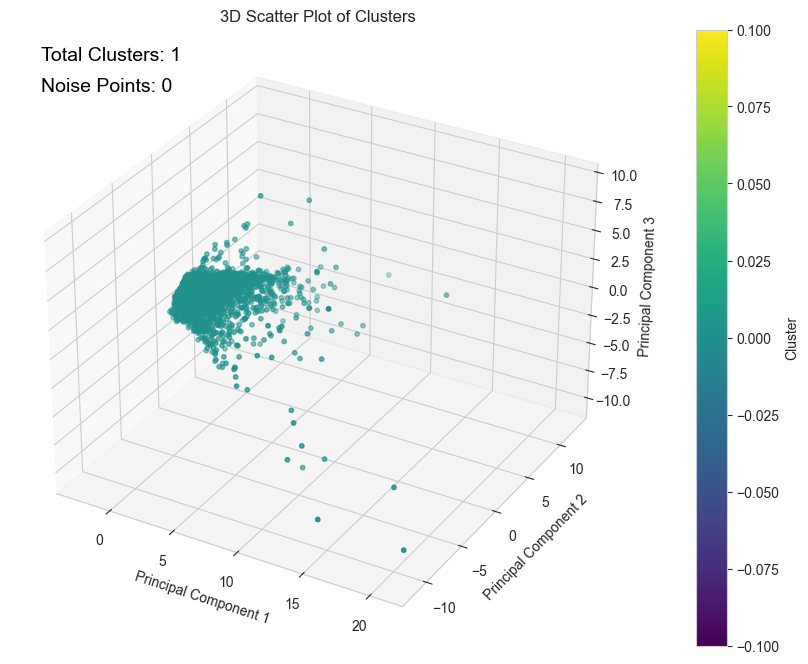

In [114]:
# Loading the dataset
df_pca = pd.read_csv(r'./dimension_reduced_data/knn3_pca.csv', index_col = 'CUST_ID')
df_pca = df_pca.iloc[:, :5]

# Initial clustering
optics_pca3 = OPTICS(min_samples = 30, xi = 0.05).fit(df_pca)

# Showing reachability plot
plot_reachability(df_pca, optics_pca3, 30, 0.05)

# Visualising clusters
visualise_clusters(df_pca, optics_pca3.labels_, 'Principal Component', s = 5)

# Saving the model
with open('./models/optics_pca3.pkl', 'wb') as file:
    pickle.dump(optics_pca3, file)

#### t-SNE Dataset
The following will use **t-SNE with 3 components**.

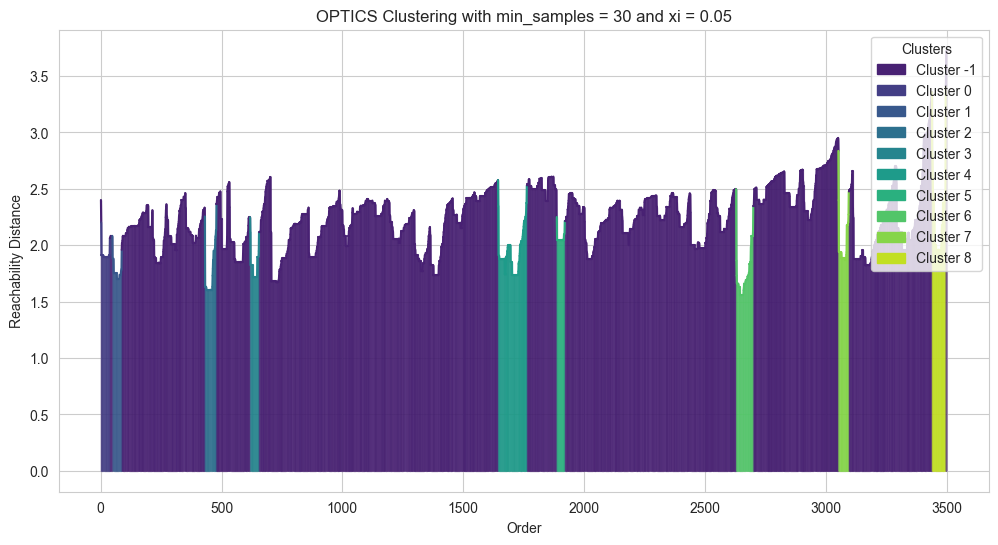

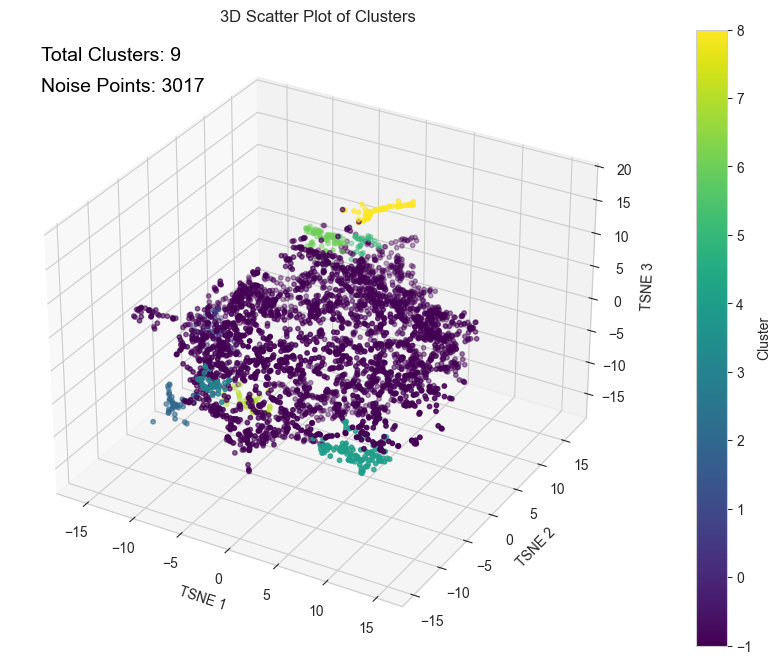

In [115]:
# Loading the dataset
df_tsne = pd.read_csv(r'./dimension_reduced_data/knn3_tsne3.csv', index_col = 'CUST_ID')

# Initial clustering
optics_tsne3 = OPTICS(min_samples = 30, xi = 0.05).fit(df_tsne)

# Showing reachability plot
plot_reachability(df_tsne, optics_tsne3, 30, 0.05)

# Visualising clusters
visualise_clusters(df_tsne, optics_tsne3.labels_, 'TSNE', s = 5)

# Saving the model
with open('./models/optics_tsne3.pkl', 'wb') as file:
    pickle.dump(optics_tsne3, file)

#### UMAP Dataset
The following will use **UMAP with 3 components**.

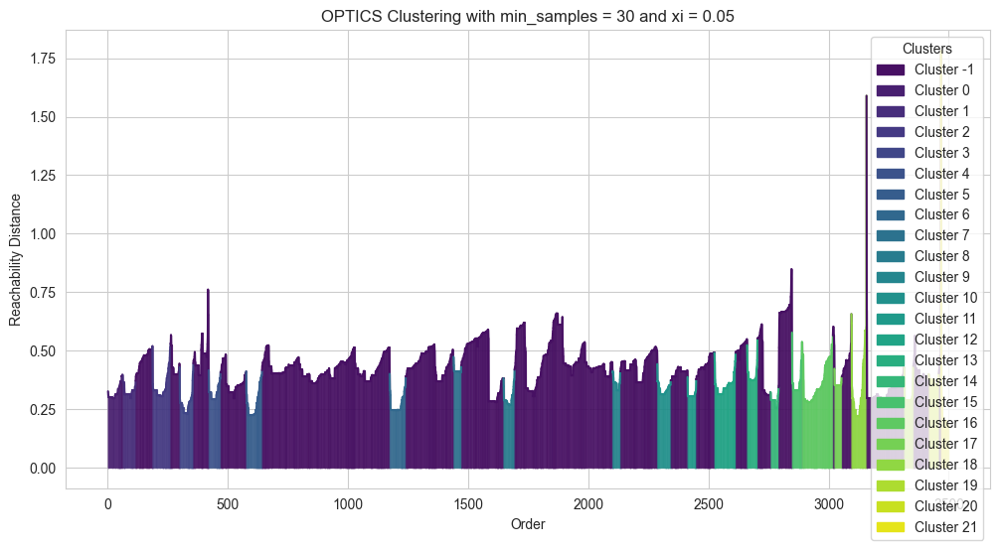

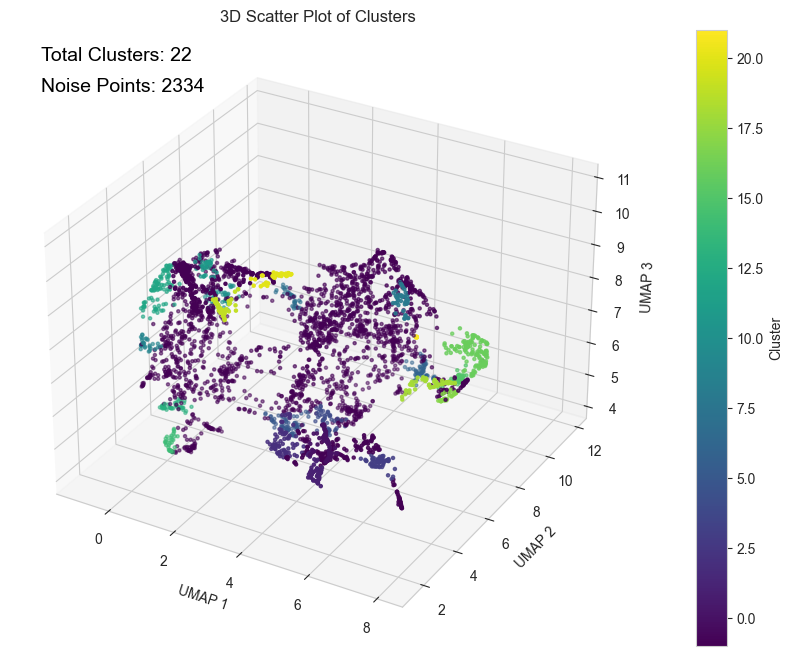

In [116]:
# Loading the dataset
df_umap = pd.read_csv(r'./dimension_reduced_data/knn3_umap3.csv', index_col = 'CUST_ID')

# Initial clustering
optics_umap3 = OPTICS(min_samples = 30, xi = 0.05).fit(df_umap)

# Showing reachability plot
plot_reachability(df_umap, optics_umap3, 30, 0.05)

# Visualising clusters
visualise_clusters(df_umap, optics_umap3.labels_, 'UMAP', s = 5)

# Saving the model
with open('./models/optics_umap3.pkl', 'wb') as file:
    pickle.dump(optics_umap3, file)

### 7.5.2 Model Evaluation

#### Silhouette Score

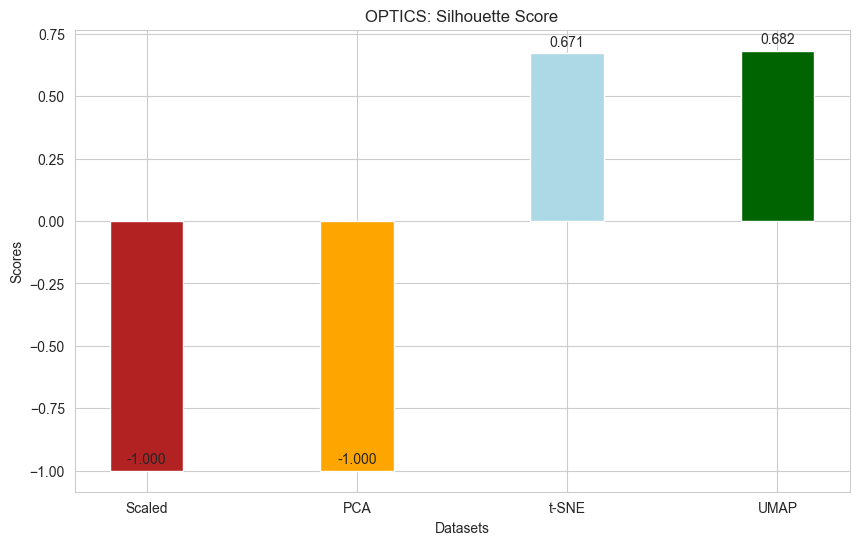

In [117]:
# Calculating the Silhouette Score
optics_silhouette = {
    'Scaled': (
        silhouette_score(df_scaled[optics_scaled.labels_ != -1], optics_scaled.labels_[optics_scaled.labels_ != -1])
        if len(np.unique(optics_scaled.labels_[optics_scaled.labels_ != -1])) > 1 else -1),
    'PCA': (
        silhouette_score(df_pca[optics_pca3.labels_ != -1], optics_pca3.labels_[optics_pca3.labels_ != -1])
        if len(np.unique(optics_pca3.labels_[optics_pca3.labels_ != -1])) > 1 else -1),
    't-SNE': (
        silhouette_score(df_tsne[optics_tsne3.labels_ != -1], optics_tsne3.labels_[optics_tsne3.labels_ != -1])
        if len(np.unique(optics_tsne3.labels_[optics_tsne3.labels_ != -1])) > 1 else -1),
    'UMAP': (
        silhouette_score(df_umap[optics_umap3.labels_ != -1], optics_umap3.labels_[optics_umap3.labels_ != -1])
        if len(np.unique(optics_umap3.labels_[optics_umap3.labels_ != -1])) > 1 else -1)
}

# Visualising the differences in Silhouette Score
visualise_scores(optics_silhouette, 'OPTICS', 'Silhouette Score', grid = True)

#### Davies-Bouldin Index

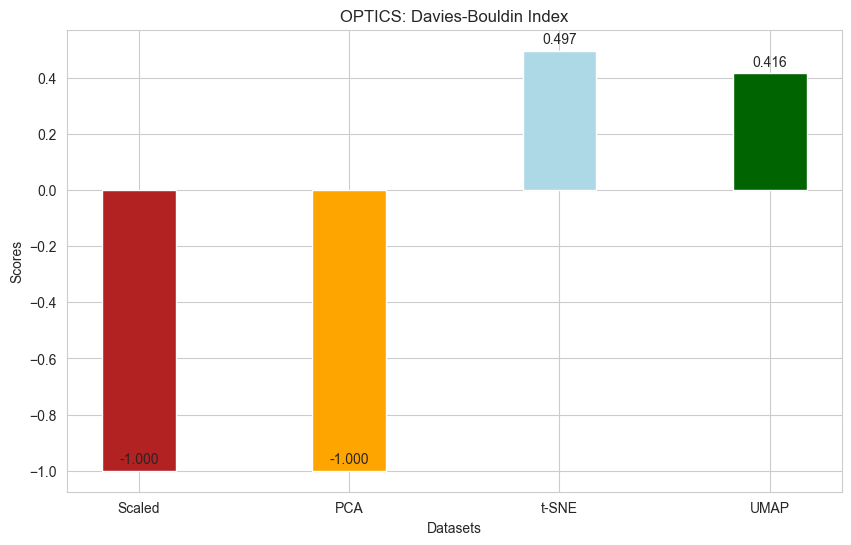

In [118]:
# Calculating the Davies-Bouldin Index
optics_dbindex = {
    'Scaled': (
        davies_bouldin_score(df_scaled[optics_scaled.labels_ != -1], optics_scaled.labels_[optics_scaled.labels_ != -1])
        if len(np.unique(optics_scaled.labels_[optics_scaled.labels_ != -1])) > 1 else -1),
    'PCA': (
        davies_bouldin_score(df_pca[optics_pca3.labels_ != -1], optics_pca3.labels_[optics_pca3.labels_ != -1])
        if len(np.unique(optics_pca3.labels_[optics_pca3.labels_ != -1])) > 1 else -1),
    't-SNE': (
        davies_bouldin_score(df_tsne[optics_tsne3.labels_ != -1], optics_tsne3.labels_[optics_tsne3.labels_ != -1])
        if len(np.unique(optics_tsne3.labels_[optics_tsne3.labels_ != -1])) > 1 else -1),
    'UMAP': (
        davies_bouldin_score(df_umap[optics_umap3.labels_ != -1], optics_umap3.labels_[optics_umap3.labels_ != -1])
        if len(np.unique(optics_umap3.labels_[optics_umap3.labels_ != -1])) > 1 else -1)
}

# Visualising the differences in Davies-Bouldin Index
visualise_scores(optics_dbindex, 'OPTICS', 'Davies-Bouldin Index', grid = True)

#### Calinski-Harabasz Index

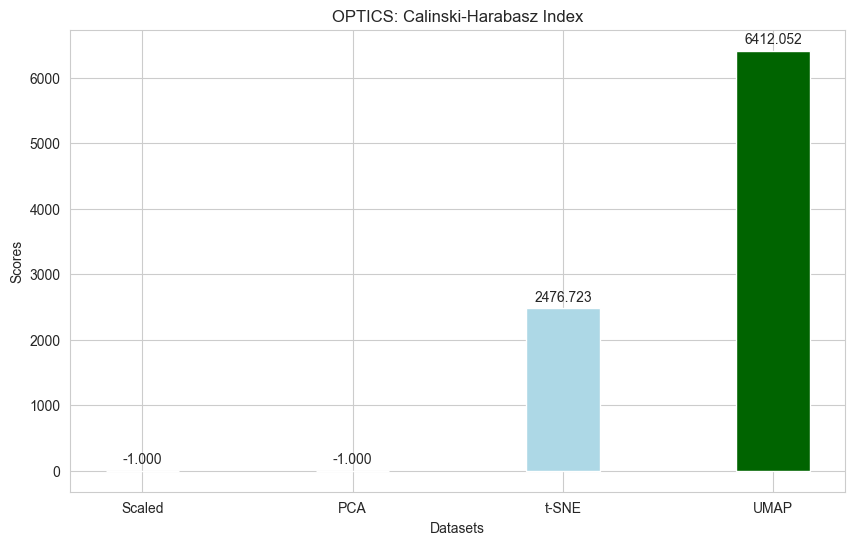

In [119]:
# Calculating the Calinski-Harabasz Index
optics_chindex = {
    'Scaled': (
        calinski_harabasz_score(df_scaled[optics_scaled.labels_ != -1], optics_scaled.labels_[optics_scaled.labels_ != -1])
        if len(np.unique(optics_scaled.labels_[optics_scaled.labels_ != -1])) > 1 else -1),
    'PCA': (
        calinski_harabasz_score(df_pca[optics_pca3.labels_ != -1], optics_pca3.labels_[optics_pca3.labels_ != -1])
        if len(np.unique(optics_pca3.labels_[optics_pca3.labels_ != -1])) > 1 else -1),
    't-SNE': (
        calinski_harabasz_score(df_tsne[optics_tsne3.labels_ != -1], optics_tsne3.labels_[optics_tsne3.labels_ != -1])
        if len(np.unique(optics_tsne3.labels_[optics_tsne3.labels_ != -1])) > 1 else -1),
    'UMAP': (
        calinski_harabasz_score(df_umap[optics_umap3.labels_ != -1], optics_umap3.labels_[optics_umap3.labels_ != -1])
        if len(np.unique(optics_umap3.labels_[optics_umap3.labels_ != -1])) > 1 else -1)
}

# Visualising the differences in Calinski-Harabasz Index
visualise_scores(optics_chindex, 'OPTICS', 'Calinski-Harabasz Index', grid = True)

**Conclusion:**

Since the performance of **UMAP** dataset is the **best** in terms of **Silhouette Score** and **Calinski-Harabasz Index**, the **UMAP Dataset** is **chosen** for the **OPTICS Model**.

### 7.5.3 Hyperparameter Tuning
The following hyperparameters will be fine-tuned:
1) **Minimum Samples**
2) **Xi**

#### Minimum Samples
The number of samples in a neighbourhood for a point to be considered a core point.

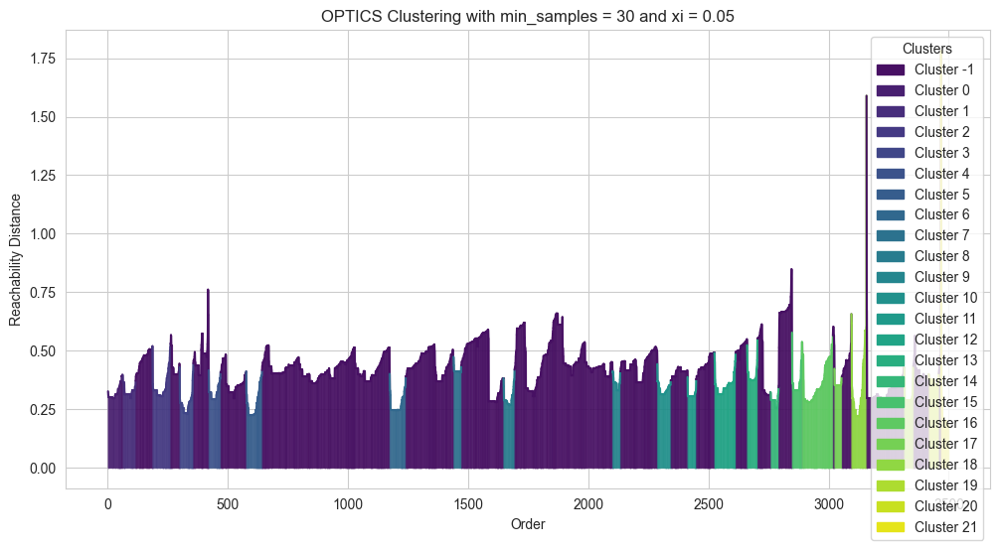

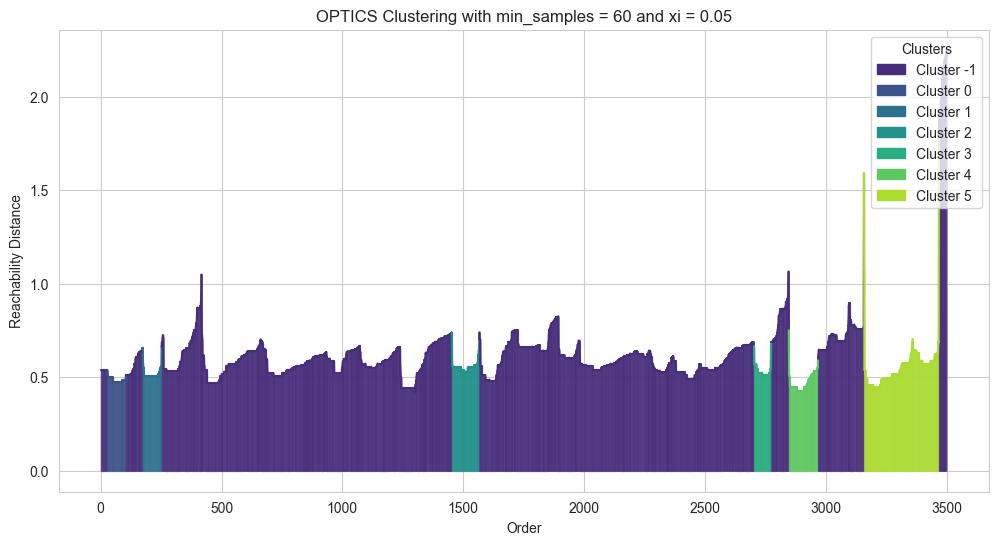

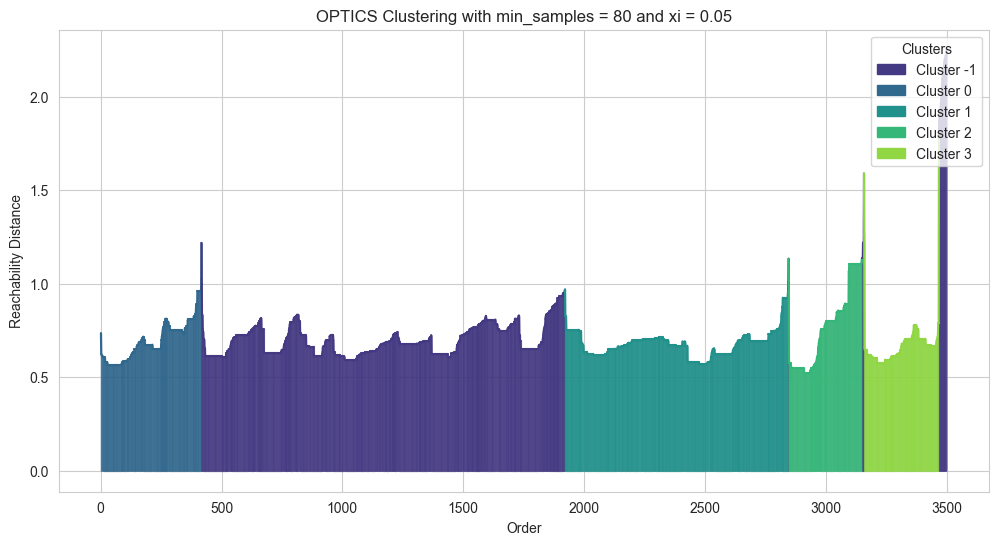

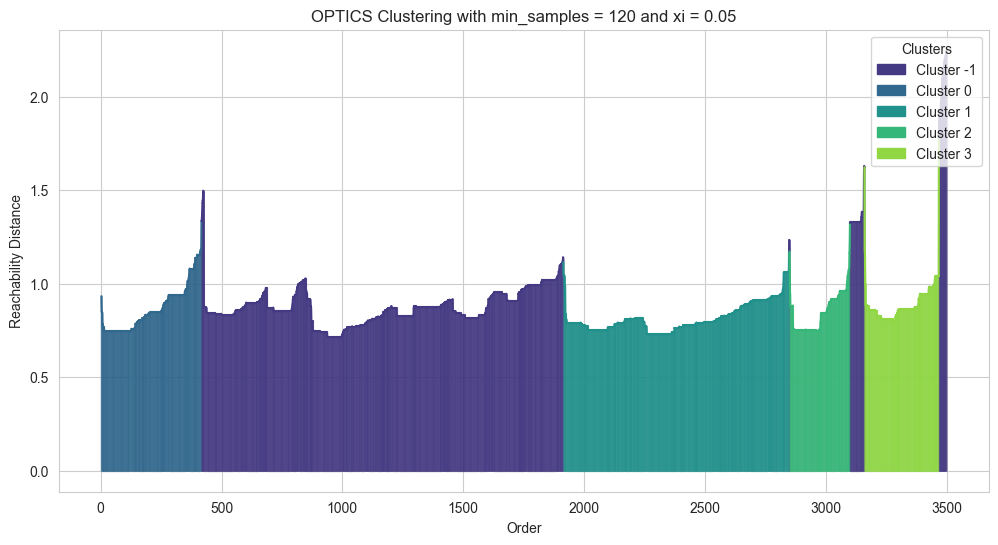

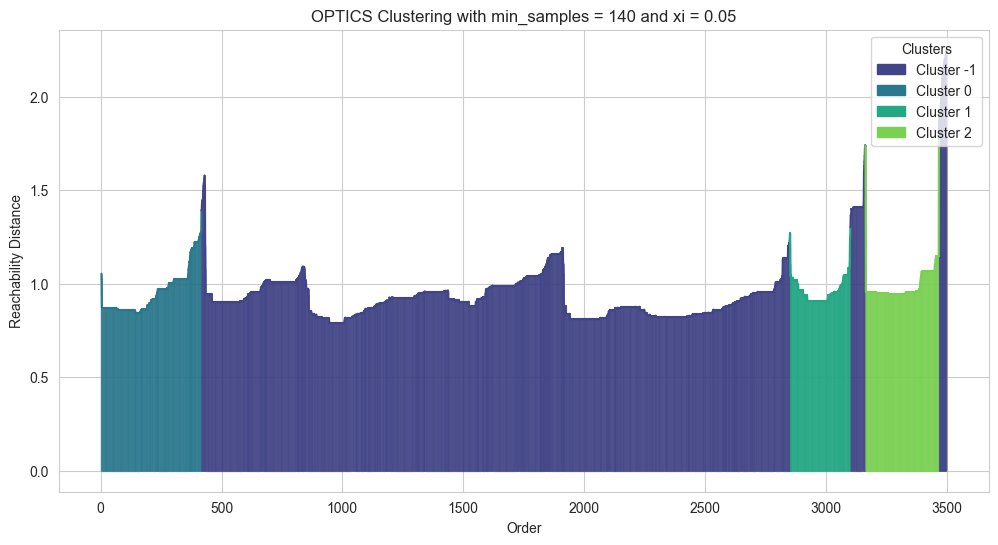

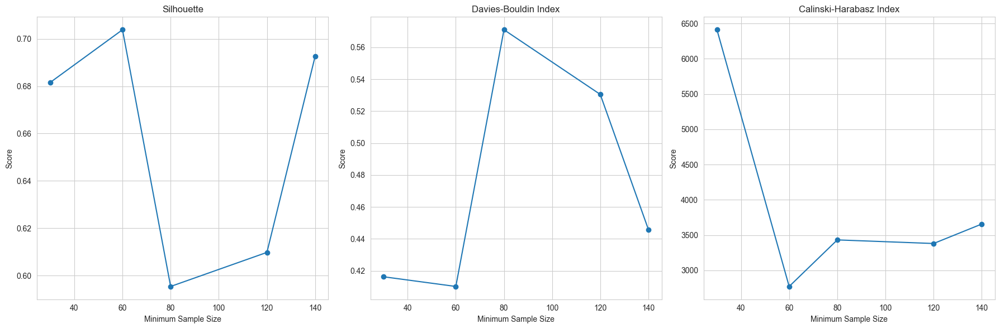

In [120]:
# Loading the best performing dataset for OPTICS
df_optics_best = df_umap

# Minimum samples for fine-tuning
min_samples = [30, 60, 80, 120, 140]

# Dictionary for storing scores
optics_minsample_tuning = {
    'Silhouette': [],
    'Davies-Bouldin Index': [],
    'Calinski-Harabasz Index': []
}

for min_samp in min_samples:
    # Creating and fitting the OPTICS model
    optics_model = OPTICS(min_samples = min_samp, xi = 0.05).fit(df_optics_best)

    # Plotting reachability plot
    plot_reachability(df_optics_best, optics_model, min_samp, 0.05)

    with open(f'./models/optics_umap3_minsamples{min_samp}.pkl', 'wb') as file:
        pickle.dump(optics_model, file)

    optics_minsample_tuning['Silhouette'].append(silhouette_score(df_optics_best[optics_model.labels_ != -1], optics_model.labels_[optics_model.labels_ != -1]))
    optics_minsample_tuning['Davies-Bouldin Index'].append(davies_bouldin_score(df_optics_best[optics_model.labels_ != -1], optics_model.labels_[optics_model.labels_ != -1]))
    optics_minsample_tuning['Calinski-Harabasz Index'].append(calinski_harabasz_score(df_optics_best[optics_model.labels_ != -1], optics_model.labels_[optics_model.labels_ != -1]))

# Plotting the metrics in subplots
plot_metrics(values = min_samples, metrics = optics_minsample_tuning, title = 'Minimum Sample Size')

#### Xi
**Xi** determines the steepness on the reachability plot that defines a cluster boundary

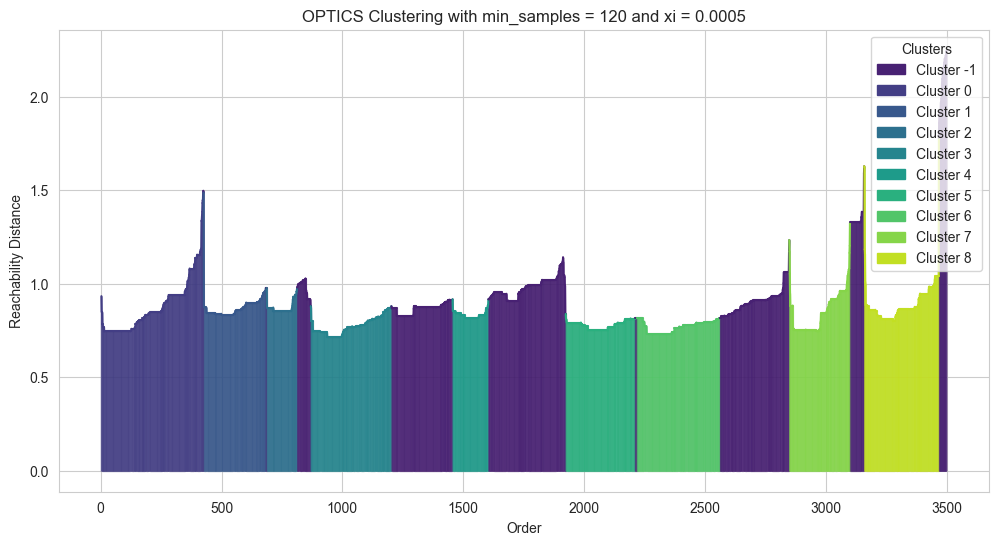

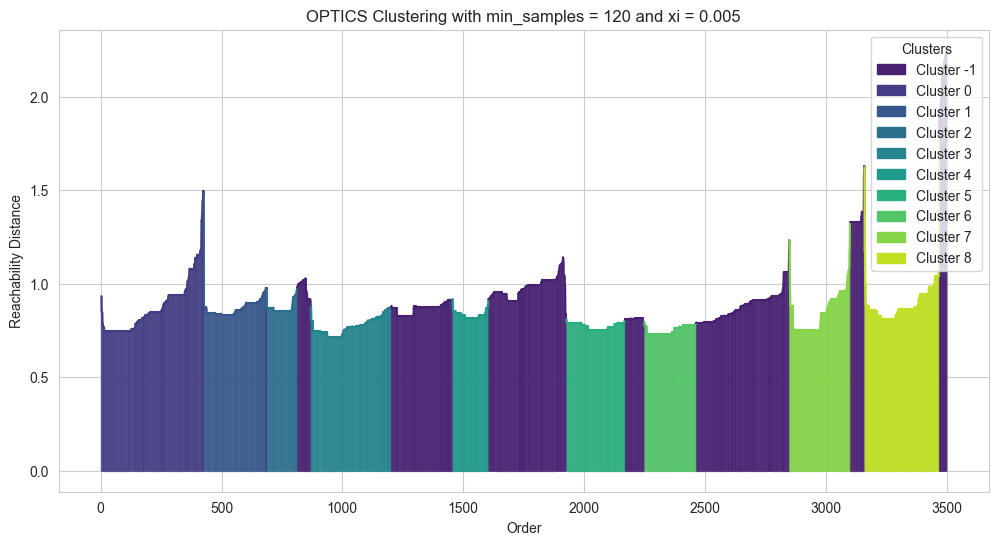

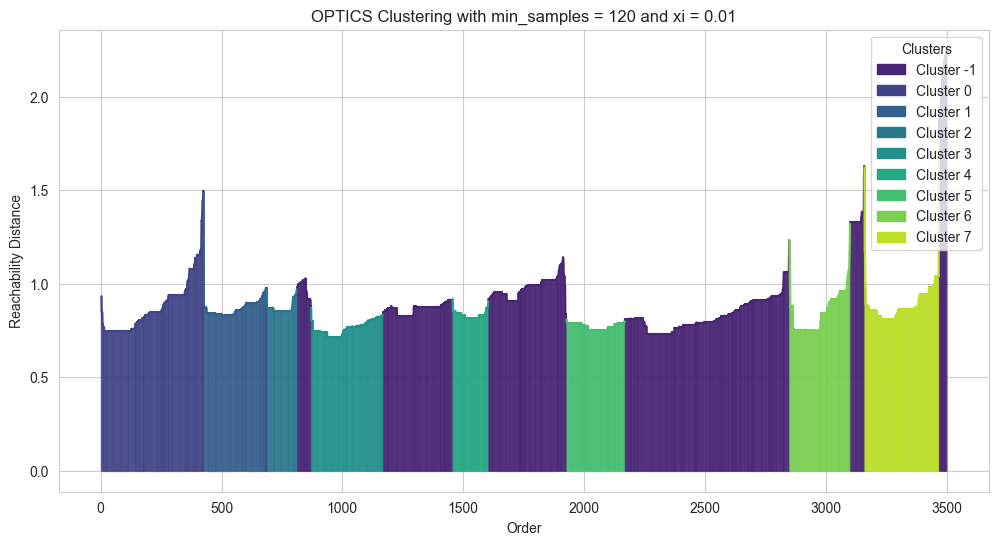

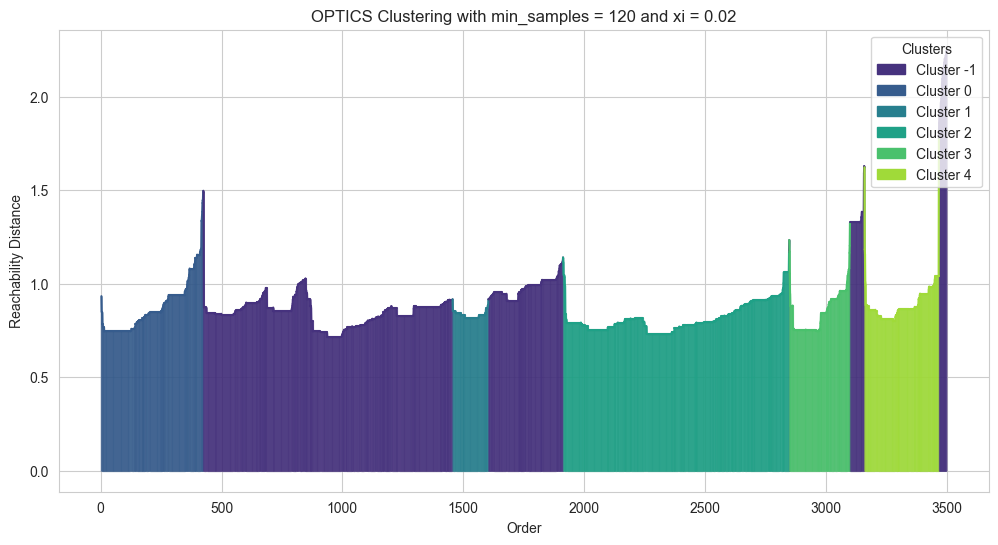

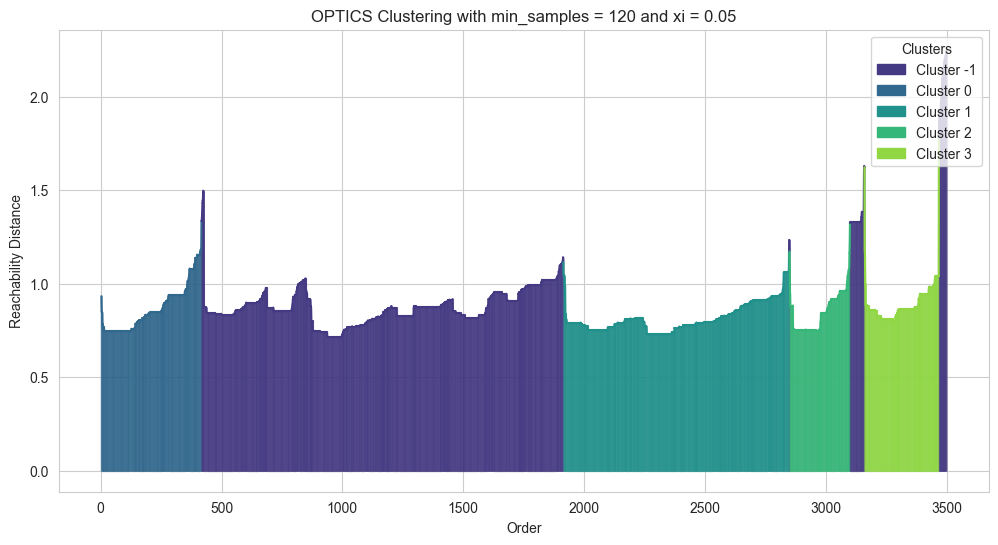

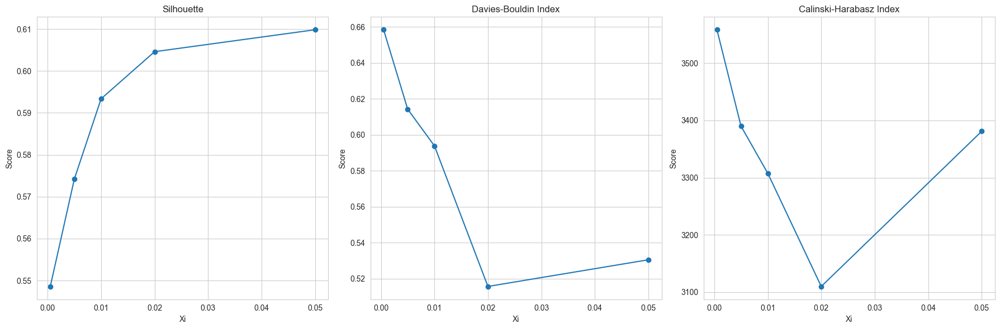

In [121]:
# Xi for fine-tuning
xi_values = [0.0005, 0.005, 0.01, 0.02, 0.05]

# Dictionary for storing scores
optics_xi_tuning = {
    'Silhouette': [],
    'Davies-Bouldin Index': [],
    'Calinski-Harabasz Index': []
}

for xi in xi_values:
    # Creating and fitting the OPTICS model
    optics_model = OPTICS(min_samples = 120, xi = xi).fit(df_optics_best)

    # Plotting reachability plot
    plot_reachability(df_optics_best, optics_model, 120, xi)

    with open(f'./models/optics_umap3_minsamples120_xi{xi}.pkl', 'wb') as file:
        pickle.dump(optics_model, file)

    optics_xi_tuning['Silhouette'].append(silhouette_score(df_optics_best[optics_model.labels_ != -1], optics_model.labels_[optics_model.labels_ != -1]))
    optics_xi_tuning['Davies-Bouldin Index'].append(davies_bouldin_score(df_optics_best[optics_model.labels_ != -1], optics_model.labels_[optics_model.labels_ != -1]))
    optics_xi_tuning['Calinski-Harabasz Index'].append(calinski_harabasz_score(df_optics_best[optics_model.labels_ != -1], optics_model.labels_[optics_model.labels_ != -1]))

# Plotting the metrics in subplots
plot_metrics(values = xi_values, metrics = optics_xi_tuning, title = 'Xi')

### 7.5.4 Best Model Fitting
The best model will be fitted using the following hyperparameters:
1) **Minimum Samples**: 120
2) **Xi**: 0.005

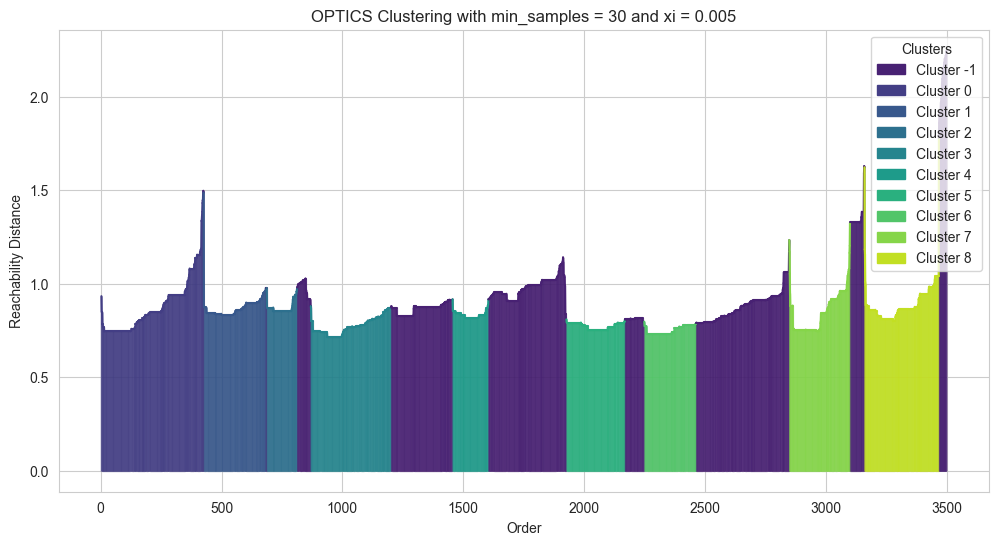

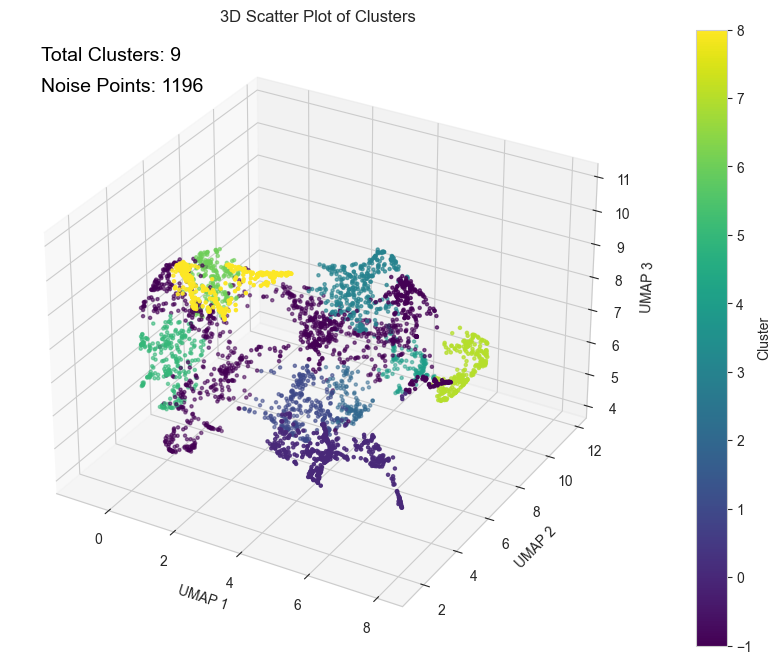

Silhouette Score: 0.5742363527162497
Davies-Bouldin Index: 0.6142864948328446
Calinski-Harabasz Index: 3389.8440660855695


In [122]:
# Creating and fitting the OPTICS model
best_optics = OPTICS(min_samples = 120, xi = 0.005).fit(df_umap)

# Showing reachability plot
plot_reachability(df_umap, best_optics, 30, 0.005)

# Visualising clusters
visualise_clusters(df_umap, best_optics.labels_, 'UMAP', s = 5)

# Printing the best model's metrics
print(f'Silhouette Score: {silhouette_score(df_umap[best_optics.labels_ != -1], best_optics.labels_[best_optics.labels_ != -1])}')
print(f'Davies-Bouldin Index: {davies_bouldin_score(df_umap[best_optics.labels_ != -1], best_optics.labels_[best_optics.labels_ != -1])}')
print(f'Calinski-Harabasz Index: {calinski_harabasz_score(df_umap[best_optics.labels_ != -1], best_optics.labels_[best_optics.labels_ != -1])}')

# Saving the model
with open('./models/best_optics.pkl', 'wb') as file:
    pickle.dump(best_optics, file)

## 7.6 Model Comparison
The following compared the performance of the 5 models employed, in term of silhouette, Davies-Bouldin Index, and ch index, as well as the final representation of the outcome

# 8 Cluster Interpretation

# ????